#Hybrid Arima - LSTM code

The hybrid ARIMA-LSTM model is open to a variety of experimentation. For ideal performance, a balance must be reached between the levels of volatility that work best for the ARIMA and LSTM models. Using shorter MA periods that result in a non-mesokurtic distribution may achieve a better volatility balance between models.

## Import Libraries

In [ ]:
import pandas as pd
pd.set_option('display.max_rows', 500)
import timeit


In [ ]:
!pip install -q -U keras-tuner

     |████████████████████████████████| 98 kB 3.6 MB/s 


In [ ]:
import keras_tuner as kt

In [ ]:
!pip install pmdarima

     |████████████████████████████████| 1.4 MB 5.1 MB/s 
     |████████████████████████████████| 9.8 MB 23.7 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
import pmdarima

In [ ]:
url = 'https://launchpad.net/~mario-mariomedina/+archive/ubuntu/talib/+files'
!wget $url/libta-lib0_0.4.0-oneiric1_amd64.deb -qO libta.deb
!wget $url/ta-lib0-dev_0.4.0-oneiric1_amd64.deb -qO ta.deb
!dpkg -i libta.deb ta.deb
!pip install ta-lib
import talib

Selecting previously unselected package libta-lib0.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack libta.deb ...
Unpacking libta-lib0 (0.4.0-oneiric1) ...
Selecting previously unselected package ta-lib0-dev.
Preparing to unpack ta.deb ...
Unpacking ta-lib0-dev (0.4.0-oneiric1) ...
Setting up libta-lib0 (0.4.0-oneiric1) ...
Setting up ta-lib0-dev (0.4.0-oneiric1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Processing triggers for libc-bin (2.27-3ubuntu1.3) ...
/sbin/ldconfig.real: /usr/local/lib/python3.7/dist-packages/ideep4py/lib/libmkldnn.so.0 is not a symbolic link

     |████████████████████████████████| 268 kB 5.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for ta-lib: filename=TA_Lib-0.4.22-cp37-cp37m-linux_x86_64.whl size=1465696 sha256=fd07dcc6bd81b6649d73bbe63bbc5993a021f7026d99ecf058e277f8a8f80365
  Stored in direc

In [ ]:
import tensorflow
import statsmodels.tsa.api
import keras
import sklearn

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Bidirectional,BatchNormalization, Embedding, TimeDistributed, LeakyReLU, GRU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [ ]:
from keras.models import Sequential, load_model
from keras.layers import Dense, LSTM, Activation, Dropout
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.regularizers import l1_l2

In [ ]:
import math

In [ ]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX,VARMAXResults

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


In [ ]:
from matplotlib import pyplot


In [ ]:
import json
import datetime
import pandas as pd
import numpy as np
import os
from scipy.stats import kurtosis
import pmdarima as pm
from pmdarima import auto_arima
from talib import abstract
import json
import matplotlib.pyplot as plt
# plt.rcParams.update({'font.size': 16})
from matplotlib.pyplot import figure
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

In [ ]:
from keras.utils.generic_utils import get_custom_objects
from tensorflow.keras.utils import plot_model

In [ ]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

Reference 1: https://towardsdatascience.com/time-series-forecasting-predicting-stock-prices-using-an-arima-model-2e3b3080bd70

## Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd drive/MyDrive/Stock price prediction/Generated datasets

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Generated datasets


In [ ]:
df = pd.read_csv("FULL_Data_google_COVID_bull_bear.csv",parse_dates=[0])
df.tail(10)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
1592,1592,1781,1781,1781,150.199997,151.429993,150.059998,150.809998,150.809998,56787900.0,150.565717,148.423811,-1.137777,2.817933,154.059677,142.787944,150.767809,5.009368,93.428749,-0.061228,100.779503,-0.039111,103.599003,-0.022436,2021-11-09,19,112313,1258,0.119141,0.111328,NaN,NaN,NaN,NaN
1593,1593,1782,1782,1782,150.020004,150.130005,147.850006,147.919998,147.919998,65187100.0,150.417145,148.729049,-1.236913,2.144358,153.017766,144.440332,148.869268,4.989888,92.922909,-0.061683,99.694365,-0.039762,101.872301,-0.022657,2021-11-10,19,80301,1470,0.154297,0.109375,NaN,NaN,NaN,NaN
1594,1594,1783,1783,1783,148.960007,149.429993,147.679993,147.869995,147.869995,41000000.0,150.110001,149.060477,-1.165047,1.767475,152.595428,145.525526,148.203086,4.989548,92.416471,-0.062129,98.604584,-0.040391,100.137594,-0.022839,2021-11-11,19,94975,1662,0.102845,0.126915,NaN,NaN,NaN,NaN
1595,1595,1784,1784,1784,148.429993,150.399994,147.479996,149.990005,149.990005,63632600.0,149.895715,149.357144,-0.869308,1.420732,152.198608,146.515681,149.394365,5.003879,91.909483,-0.062566,97.510555,-0.040998,98.396260,-0.022980,2021-11-12,19,55499,797,0.157277,0.080595,NaN,NaN,NaN,NaN
1596,1596,1785,1785,1785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-13,19,146529,2505,0.139459,0.083243,NaN,NaN,NaN,NaN
1597,1597,1786,1786,1786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-14,19,40964,479,0.151261,0.100840,NaN,NaN,NaN,NaN
1598,1598,1787,1787,1787,150.369995,151.880005,149.429993,150.000000,150.000000,59222800.0,149.758571,149.602859,-0.907641,1.229694,152.062246,147.143471,149.798122,5.003946,91.401994,-0.062993,96.412672,-0.041581,96.649685,-0.023077,2021-11-15,22,30290,148,0.136737,0.109389,NaN,NaN,NaN,NaN
1599,1599,1788,1788,1788,149.940002,151.490005,149.339996,151.000000,151.000000,59256200.0,149.718571,149.814763,-0.791320,1.236243,152.287250,147.342277,150.599374,5.010635,90.894052,-0.063410,95.311334,-0.042140,94.899260,-0.023130,2021-11-16,22,138962,1294,0.135531,0.115385,NaN,NaN,NaN,NaN
1600,1600,1789,1789,1789,151.000000,155.000000,150.990005,153.490005,153.490005,88807000.0,150.154286,150.040002,-0.657719,1.467121,152.974245,147.105759,152.526461,5.027099,90.385704,-0.063817,94.206941,-0.042673,93.146378,-0.023135,2021-11-17,22,87626,1290,0.100870,0.126957,NaN,NaN,NaN,NaN
1601,1601,1790,1790,1790,153.710007,158.669998,153.050003,157.869995,157.869995,137659100.0,151.162857,150.450002,-0.609656,2.267825,154.985653,145.914351,156.088817,5.055417,89.877000,-0.064214,93.099895,-0.043179,91.392433,-0.023090,2021-11-18,22,111404,1637,0.145098,0.121569,NaN,NaN,NaN,NaN


In [ ]:
cd ..

In [ ]:
cd Archana - LSTM Hybrid/Outputs/Baseline

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/Baseline


In [ ]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name().head(5)

0    Saturday
1      Sunday
3     Tuesday
7    Saturday
8      Sunday
Name: Date, dtype: object

In [ ]:
len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

497

In [ ]:
len(df)

1602

In [ ]:
len(df) - len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

1105

In [ ]:
df.dropna(inplace=True)
len(df)

1080

In [ ]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name()

Series([], Name: Date, dtype: object)

In [ ]:
df.head(5)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,2,191,191,191,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,4,193,193,193,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,5,194,194,194,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,6,195,195,195,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,9,198,198,198,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


In [ ]:
stock_col= list(df.columns)
stock_col = stock_col[4:len(stock_col)]

In [ ]:
dataset_final = df[stock_col]

In [ ]:
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


### Data Load for Experiment set 1 with Technical Indicators

In [ ]:
stock_col= list(df.columns)
stock_col = stock_col[4:len(stock_col)-9]
dataset_final = df[stock_col]
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10


In [ ]:
# Set the date to datetime data
datetime_series = pd.to_datetime(dataset_final['Date'])
datetime_index = pd.DatetimeIndex(datetime_series.values)
dataset_final = dataset_final.set_index(datetime_index)
dataset_final = dataset_final.sort_values(by='Date')
dataset_final = dataset_final.drop(columns='Date')
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp
2017-07-03,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955
2017-07-05,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936
2017-07-06,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820
2017-07-07,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608
2017-07-10,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302


### Train & test Dataset for Multistep Process

In [ ]:
# Get features and target
X_value = pd.DataFrame(dataset_final.iloc[:, :])
y_value = pd.DataFrame(dataset_final.iloc[:, 3])

In [ ]:
y_value.head(5)

,Close
2017-07-03,35.875000
2017-07-05,36.022499
2017-07-06,35.682499
2017-07-07,36.044998
2017-07-10,36.264999


In [ ]:
# Normalized the data
X_scaler = MinMaxScaler(feature_range=(-1, 1))
y_scaler = MinMaxScaler(feature_range=(-1, 1))
X_scaler.fit(X_value)
y_scaler.fit(y_value)

MinMaxScaler(feature_range=(-1, 1))

In [ ]:
X_scale_dataset = X_scaler.fit_transform(X_value)
y_scale_dataset = y_scaler.fit_transform(y_value)

In [ ]:
X_scale_dataset.shape, y_scale_dataset.shape, 

((1080, 20), (1080, 1))

In [ ]:
 X_value.shape[1]

20

### N Steps Definition

In [ ]:
n_steps_in = 3
n_features = X_value.shape[1] #19 features
n_steps_out = 1


In [ ]:
# Reshape the data
'''Set the data input steps and output steps, 
    we use 30 days data to predict 1 day price here, 
    reshape it to (None, input_step, number of features) used for LSTM input'''
# Get X/y dataset
def get_X_y(X_data, y_data):
    X = list()
    y = list()
    yc = list()

    length = len(X_data)
    for i in range(0, length, 1):
        # pdb.set_trace()
        X_value = X_data[i: i + n_steps_in][:, :]
        # print('[',i,': ',i,' + ',n_steps_in,'][:, :]')
        y_value = y_data[i + n_steps_in: i + (n_steps_in + n_steps_out)][:, 0]
        # print('[',i,' + ',n_steps_in,': ',i,' + (',n_steps_in,' + ',n_steps_out,')][:, 0]')
        yc_value = y_data[i: i + n_steps_in][:, :]
        if len(X_value) == 3 and len(y_value) == 1:
            X.append(X_value)
            y.append(y_value)
            yc.append(yc_value)

    return np.array(X), np.array(y), np.array(yc)

In [ ]:
# get the train test predict index
def predict_index(dataset, X_train, n_steps_in, n_steps_out):

    # get the predict data (remove the in_steps days)
    train_predict_index = dataset.iloc[n_steps_in : X_train.shape[0] + n_steps_in + n_steps_out - 1, :].index
    test_predict_index = dataset.iloc[X_train.shape[0] + n_steps_in:, :].index

    return train_predict_index, test_predict_index


In [ ]:
def mean_absolute_percentage_error(actual, prediction):
    actual = pd.Series(actual)
    prediction = pd.Series(prediction)
    return 100 * np.mean(np.abs((actual - prediction))/actual)

In [ ]:
# Split train/test dataset
def split_train_test(data):
    train_size = round(len(X) * 0.75)
    data_train = data[0:train_size]
    data_test = data[train_size:]
    return data_train, data_test

In [ ]:
# Get data and check shape
X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
# pdb.set_trace()
X_train, X_test, = split_train_test(X)
y_train, y_test, = split_train_test(y)
yc_train, yc_test, = split_train_test(yc)
index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

In [ ]:
# %% --------------------------------------- Save dataset -----------------------------------------------------------------
print('X shape: ', X.shape)
print('y shape: ', y.shape)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('y_c_train shape: ', yc_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)
print('y_c_test shape: ', yc_test.shape)
print('index_train shape:', index_train.shape)
print('index_test shape:', index_test.shape)


X shape:  (1077, 3, 20)
y shape:  (1077, 1)
X_train shape:  (808, 3, 20)
y_train shape:  (808, 1)
y_c_train shape:  (808, 3, 1)
X_test shape:  (269, 3, 20)
y_test shape:  (269, 1)
y_c_test shape:  (269, 3, 1)
index_train shape: (808,)
index_test shape: (269,)


In [ ]:
output_dim = y_train.shape[1]
output_dim

1

In [ ]:
df = dataset_final.copy()

In [ ]:
df.rename(columns={'Date':'date','Open':'open','Low':'low','Close':'close','Volume':'volume','High':'high'}, inplace = True)
df.reset_index(drop=True,inplace=True)

In [ ]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955


In [ ]:
# df.drop(['volume', 'MACD','20SD','logmomentum','absolute of 3 comp','angle of 3 comp','absolute of 6 comp','angle of 6 comp','absolute of 9 comp','angle of 9 comp'], axis='columns', inplace=True) # only keep columns that can help as residuals in Arima Hybrid

In [ ]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955


### Train & Test Length

In [ ]:
test_len = len(X_test)

In [ ]:
train_len = len(X_train )

In [ ]:
test_len, train_len

(269, 808)

## Kurtosis Review

In [ ]:
   # Initialize moving averages from Ta-Lib, store functions in dictionary
# talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'MIDPRICE', 'T3', 'TEMA', 'TRIMA'] remove midprice due to outputbeing univariate
talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT',  'T3', 'TEMA', 'TRIMA'] 
functions = {}
for ma in talib_moving_averages:
      functions[ma] = abstract.Function(ma)

    # Determine kurtosis "K" values for MA period 4-30
kurtosis_results = {'period': []}
for i in range(4, 100): # 100
  kurtosis_results['period'].append(i)
  for ma in talib_moving_averages:
              # Run moving average, remove last N days (used later for test data set), trim MA result to last 30 days
              ma_output = functions[ma](df[:-test_len], i).tail(14)
              # Determine kurtosis "K" value
              k = kurtosis(ma_output, fisher=False)
              # add to dictionary
              if ma not in kurtosis_results.keys():
                  kurtosis_results[ma] = []
              kurtosis_results[ma].append(k)

kurtosis_results = pd.DataFrame(kurtosis_results)
kurtosis_results.to_csv('kurtosis_results.csv')

In [ ]:
kurtosis_results.head(5)

,period,SMA,EMA,WMA,DEMA,KAMA,MIDPOINT,T3,TEMA,TRIMA
0,4,2.272452,2.652772,2.896972,3.800351,2.299585,2.171369,1.978458,4.609342,2.411225
1,5,1.839451,2.355815,2.481058,3.327525,1.841282,1.826597,1.640277,4.262302,1.994382
2,6,1.583886,2.159532,2.194320,2.945924,1.536136,1.605787,1.510972,3.878845,1.679710
3,7,1.461290,2.026758,1.990629,2.651927,1.506197,1.558096,1.514015,3.510432,1.486348
4,8,1.447516,1.935302,1.853935,2.429648,1.509566,1.621595,1.601580,3.184123,1.373337


## Optimized periods

In [ ]:
# Determine period with K closest to 3 +/-5%
optimized_period = {}
# https://pypi.org/project/TA-Lib/ determines the type of moving average to use
# https://pandas.pydata.org/pandas-docs/version/0.17.0/generated/pandas.DataFrame.at.html#pandas.DataFrame.at
for ma in talib_moving_averages:
        difference = np.abs(kurtosis_results[ma] - 3)
        df_arimahyb = pd.DataFrame({'difference': difference, 'period': kurtosis_results['period']})
        df_arimahyb = df_arimahyb.sort_values(by=['difference'], ascending=True).reset_index(drop=True)
        if df_arimahyb.at[0, 'difference'] < 3 * 0.05:
            optimized_period[ma] = df_arimahyb.at[0, 'period']
        else:
            print(ma + ' is not viable, best K greater or less than 3 +/-5%')

print('\nOptimized periods:', optimized_period)

TRIMA is not viable, best K greater or less than 3 +/-5%

Optimized periods: {'SMA': 17, 'EMA': 51, 'WMA': 49, 'DEMA': 89, 'KAMA': 18, 'MIDPOINT': 14, 'T3': 19, 'TEMA': 9}


In [ ]:
optimized_period

{'DEMA': 89,
 'EMA': 51,
 'KAMA': 18,
 'MIDPOINT': 14,
 'SMA': 17,
 'T3': 19,
 'TEMA': 9,
 'WMA': 49}

## Simulation Keys

In [ ]:
simulation = {}
for ma in optimized_period:
        print(ma)
        print(functions[ma])
        print ( int( optimized_period[ma]))
        # if ma in ['EMA','WMA','DEMA','KAMA','MIDPOINT']:
        #   print(ma)
        low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
        low_vol = low_vol.fillna(0)
        high_vol = pd.DataFrame()
        df2 = df.copy()
        for i in df2.columns:
          if i in low_vol.columns:
            high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Pa

In [ ]:
low_vol.tail(20)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp
1060,140.200839,141.942909,138.524500,140.171495,139.966842,8.852448e+07,142.165478,146.699207,1.815578,4.572948,155.845103,137.553312,140.365562,4.935800,105.739092,-0.047411,125.318767,-0.018291,140.471430,-0.008749
1061,139.425914,141.705469,138.035200,140.698014,140.492650,8.620711e+07,141.528981,145.978836,2.115887,4.189393,154.357621,137.600050,140.587196,4.939545,105.263514,-0.048037,124.464999,-0.019222,139.335869,-0.009472
1062,140.773058,142.636405,139.932338,141.733666,141.526843,7.421445e+07,141.294887,145.298477,2.211018,3.647690,152.593858,138.003097,141.351509,4.946870,104.786174,-0.048658,123.598217,-0.020150,138.164839,-0.010188
1063,142.179695,143.266994,141.127848,142.249061,142.041527,6.519616e+07,141.224295,144.665584,2.093072,3.241276,151.148137,138.183031,141.949877,4.950518,104.307114,-0.049275,122.718682,-0.021074,136.959041,-0.010898
1064,142.253947,144.008334,141.546689,142.555532,142.347589,6.254214e+07,141.336839,144.184381,1.988881,2.884864,149.954110,138.414652,142.353647,4.952685,103.826381,-0.049886,121.826667,-0.021994,135.719217,-0.011600
1065,142.782738,143.732491,141.438660,142.125353,141.918068,6.542511e+07,141.385297,143.758659,1.774804,2.626682,149.012024,138.505294,142.201451,4.949632,103.344020,-0.050491,120.922446,-0.022909,134.446150,-0.012293
1066,142.153085,142.656915,140.466684,141.564232,141.357788,7.040262e+07,141.585336,143.387397,1.634667,2.376817,148.141030,138.633764,141.776638,4.945637,102.860075,-0.051092,120.006305,-0.023818,133.140665,-0.012977
1067,142.177201,143.194327,140.977156,142.610382,142.402435,6.948112e+07,141.933749,143.094536,1.573317,2.074153,147.242842,138.946230,142.332468,4.953023,102.374593,-0.051687,119.078535,-0.024722,131.803627,-0.013650
1068,143.009006,144.052615,142.286776,143.812497,143.602819,6.805244e+07,142.378675,142.879716,1.473333,1.874158,146.628032,139.131400,143.319154,4.961467,101.887619,-0.052275,118.139433,-0.025618,130.435938,-0.014311
1069,143.380322,145.547752,142.940349,145.397429,145.185452,7.592729e+07,142.902069,142.813890,1.447641,1.844159,146.502207,139.125573,144.704671,4.972505,101.399198,-0.052858,117.189304,-0.026508,129.038540,-0.014959


In [ ]:
high_vol.head(10)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp
0,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955
1,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936
2,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820
3,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608
4,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302
5,36.182499,36.462502,36.095001,36.382500,34.536625,79127200.0,36.039642,36.202738,0.372153,0.308860,36.820458,35.585018,36.309257,3.566217,37.412947,0.059392,31.005161,0.084416,43.829622,-0.052901
6,36.467499,36.544998,36.205002,36.435001,34.586472,99538000.0,36.101071,36.206547,0.317572,0.295861,36.798268,35.614826,36.393086,3.567700,37.215939,0.061899,31.279154,0.080632,43.892360,-0.052406
7,36.375000,37.122501,36.360001,36.942501,35.068211,100797600.0,36.253571,36.220595,0.322643,0.340687,36.901969,35.539221,36.759363,3.581920,37.022928,0.064410,31.557136,0.076830,43.941338,-0.051818
8,36.992500,37.332500,36.832500,37.259998,35.369610,80528400.0,36.430357,36.266785,0.257925,0.410484,37.087753,35.445818,37.093120,3.590715,36.833908,0.066926,31.838833,0.073014,43.976744,-0.051137
9,37.205002,37.724998,37.142502,37.389999,35.493000,95174000.0,36.674285,36.329523,0.184267,0.445597,37.220717,35.438330,37.291039,3.594294,36.648875,0.069445,32.123972,0.069192,43.998789,-0.050365


## Common Functions

In [152]:
def get_arima(dataframe,original_data, train_len, test_len):
    # prepare train and test data
    X_value = pd.DataFrame(dataframe.iloc[:, :])
    y_value = pd.DataFrame(dataframe.iloc[:, 3])
    X_train, X_test = split_train_test(X_value)
    y_train, y_test = split_train_test(y_value)
    yc_train,yc_test = split_train_test(original_data)
    # y_train_ = y_train['close'].to_list()
    # y_test_ = y_test['close'].to_list()
    yc = yc_test.values.tolist()
    y_train_list = y_train['close'].values.tolist() 
    y_test_list = y_test['close'].values.tolist()                                           
      
    # Initialize model
    model = auto_arima(y_train_list,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
                  suppress_warnings=True,stepwise=True,seasonal=True)
    print(model.summary())
        # Determine model parameters
    model.fit(y_train_list,disp= 0)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

        # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
            model = pmdarima.ARIMA(order=order)
            model.fit(y_train_list,disp= 0)
            # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')
            prediction.append(model.predict()[0])
            y_train_list.append(y_test_list[i])

    # Generate error data
    mse = mean_squared_error(yc_test, prediction)
    rmse = mse ** 0.5
    # mape = mean_absolute_percentage_error(pd.Series(yc_test).values.tolist(), pd.Series(predictionte).values.tolist() )
    mae = mean_absolute_error(pd.Series(yc_test).values.tolist() , pd.Series(prediction).values.tolist() )
    return yc, prediction, mse, rmse, mae

In [153]:
def plot_train(simulation,SIM):
  train_predict_index = np.load("index_train_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final_tr']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final_tr']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Train Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Train RMSE for {SIM} -----", RMSE)
  print(f"----- Train_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Train MAE LSTM for {SIM} -----", MAE)

In [154]:
def plot_test(simulation, SIM):
  test_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

      # rescaled_real_y = y_scaler.inverse_transform(y_train)#Real closing price data
      # rescaled_predicted_y = y_scaler.inverse_transform(train_yhat)#Predicted closing price data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final']['prediction'][i], columns=["predicted_price"],
                                  index=test_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)#This is a dataframe with each column containing the predicted daily closing price
      #
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final']['original'][i], columns=["real_price"],
                                index=test_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)#This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Testing for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Test Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Test RMSE for {SIM}-----", RMSE)
  print(f"----- Test_MSE_LSTM for {SIM}-----", MSE)
  print(f"----- Test_MAE_LSTM for {SIM}-----", MAE)

In [155]:
def plot_train_high(simulation, SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['high_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['high_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Individual LSTM RMSE for {SIM} -----", RMSE)
  print(f"----- Individual LSTM_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Individual LSTM MAE LSTM for {SIM} -----", MAE)

In [156]:
def plot_train_low(simulation , SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['low_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['low_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"-----Arima RMSE for {SIM} -----", RMSE)
  print(f"----- Arima MSE for {SIM} -----", MSE)
  print(f"----- Arima MAE for {SIM} -----", MAE)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 1

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.77 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.14 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.93 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=1.06 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.26 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 3.618 seconds
                               SARIMAX Results                                
Dep.

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.43870, saving model to LSTM1.h5
48/48 - 4s - loss: 0.1945 - val_loss: 0.4387 - lr: 0.0010 - 4s/epoch - 84ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.43870 to 0.18463, saving model to LSTM1.h5
48/48 - 1s - loss: 0.1534 - val_loss: 0.1846 - lr: 0.0010 - 591ms/epoch - 12ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.18463
48/48 - 1s - loss: 0.0812 - val_loss: 2.0345 - lr: 0.0010 - 635ms/epoch - 13ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.18463
48/48 - 1s - loss: 0.0473 - val_loss: 0.5210 - lr: 0.0010 - 565ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.18463 to 0.15949, saving model to LSTM1.h5
48/48 - 1s - loss: 0.0559 - val_loss: 0.1595 - lr: 0.0010 - 612ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.15949
48/48 - 1s - loss: 0.0491 - val_loss: 0.3984 - lr: 0.0010 - 602ms/epoch - 13ms/step
Epoch 7/500

Epoch 00007: val

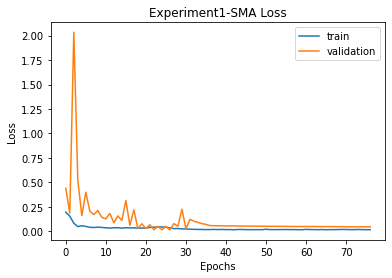


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.54 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.16 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.86 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.29

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.15300, saving model to LSTM1.h5
16/16 - 2s - loss: 0.5670 - val_loss: 0.1530 - lr: 0.0010 - 2s/epoch - 130ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.15300
16/16 - 0s - loss: 0.1440 - val_loss: 0.8880 - lr: 0.0010 - 236ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.15300 to 0.06431, saving model to LSTM1.h5
16/16 - 0s - loss: 0.0660 - val_loss: 0.0643 - lr: 0.0010 - 247ms/epoch - 15ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.06431
16/16 - 0s - loss: 0.0494 - val_loss: 0.1855 - lr: 0.0010 - 219ms/epoch - 14ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.06431
16/16 - 0s - loss: 0.0438 - val_loss: 0.1460 - lr: 0.0010 - 219ms/epoch - 14ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.06431
16/16 - 0s - loss: 0.0443 - val_loss: 0.0735 - lr: 0.0010 - 192ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.

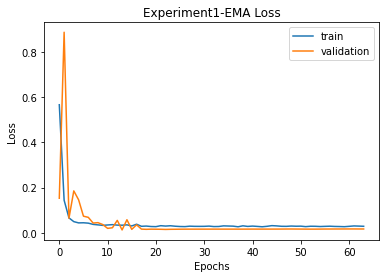


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 71.66249742365495 
RMSE:	 8.465370483543822 
MAPE:	 6.945165499596413
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.05 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.11 sec
 ARIMA(3,3,1)(0,0,0)[0]   

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03032, saving model to LSTM1.h5
17/17 - 2s - loss: 0.1845 - val_loss: 0.0303 - lr: 0.0010 - 2s/epoch - 122ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.03032
17/17 - 0s - loss: 0.1137 - val_loss: 0.0971 - lr: 0.0010 - 242ms/epoch - 14ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03032
17/17 - 0s - loss: 0.0670 - val_loss: 0.2708 - lr: 0.0010 - 258ms/epoch - 15ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.03032 to 0.00696, saving model to LSTM1.h5
17/17 - 0s - loss: 0.0519 - val_loss: 0.0070 - lr: 0.0010 - 276ms/epoch - 16ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00696
17/17 - 0s - loss: 0.0421 - val_loss: 0.0272 - lr: 0.0010 - 237ms/epoch - 14ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.00696
17/17 - 0s - loss: 0.0333 - val_loss: 0.0647 - lr: 0.0010 - 229ms/epoch - 13ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.

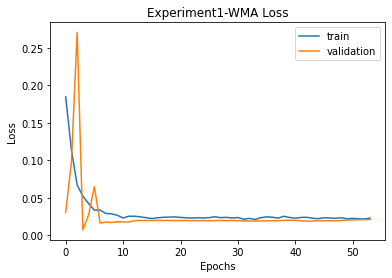


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 71.66249742365495 
RMSE:	 8.465370483543822 
MAPE:	 6.945165499596413

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 54.1687035256009 
RMSE:	 7.359939097954609 
MAPE:	 6.023882427496638
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, 

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.13774, saving model to LSTM1.h5
10/10 - 2s - loss: 1.0801 - val_loss: 0.1377 - lr: 0.0010 - 2s/epoch - 201ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.13774
10/10 - 0s - loss: 0.4486 - val_loss: 0.2985 - lr: 0.0010 - 147ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.13774
10/10 - 0s - loss: 0.1941 - val_loss: 0.1863 - lr: 0.0010 - 138ms/epoch - 14ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.13774 to 0.08194, saving model to LSTM1.h5
10/10 - 0s - loss: 0.1112 - val_loss: 0.0819 - lr: 0.0010 - 184ms/epoch - 18ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.08194 to 0.02441, saving model to LSTM1.h5
10/10 - 0s - loss: 0.0727 - val_loss: 0.0244 - lr: 0.0010 - 167ms/epoch - 17ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.02441 to 0.01265, saving model to LSTM1.h5
10/10 - 0s - loss: 0.0702 - val_loss: 0.0126 - lr: 0.0010 - 188ms/epoch - 19ms/ste

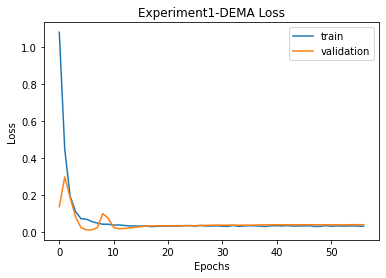


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 71.66249742365495 
RMSE:	 8.465370483543822 
MAPE:	 6.945165499596413

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 54.1687035256009 
RMSE:	 7.359939097954609 
MAPE:	 6.023882427496638

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.04043856386052 
RMSE:	 11.047191433294731 
MAPE:	 9.094033094452044
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(0,3,0)(0,0

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.19193, saving model to LSTM1.h5
45/45 - 2s - loss: 0.2960 - val_loss: 0.1919 - lr: 0.0010 - 2s/epoch - 53ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.19193
45/45 - 1s - loss: 0.2009 - val_loss: 0.6974 - lr: 0.0010 - 607ms/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.19193
45/45 - 1s - loss: 0.0824 - val_loss: 1.4587 - lr: 0.0010 - 560ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.19193
45/45 - 1s - loss: 0.0402 - val_loss: 0.3100 - lr: 0.0010 - 564ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.19193 to 0.14815, saving model to LSTM1.h5
45/45 - 1s - loss: 0.0362 - val_loss: 0.1482 - lr: 0.0010 - 610ms/epoch - 14ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.14815 to 0.11783, saving model to LSTM1.h5
45/45 - 1s - loss: 0.0326 - val_loss: 0.1178 - lr: 0.0010 - 541ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: val

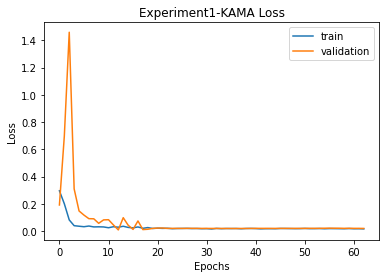


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 71.66249742365495 
RMSE:	 8.465370483543822 
MAPE:	 6.945165499596413

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 54.1687035256009 
RMSE:	 7.359939097954609 
MAPE:	 6.023882427496638

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.04043856386052 
RMSE:	 11.047191433294731 
MAPE:	 9.094033094452044

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 45.6842728316542 
RMSE:	 6.759014190816157 
MAPE:	 5.403969846039035
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDPOIN

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.06465, saving model to LSTM1.h5
58/58 - 3s - loss: 0.4628 - val_loss: 0.0646 - lr: 0.0010 - 3s/epoch - 45ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.06465
58/58 - 1s - loss: 0.1285 - val_loss: 0.0952 - lr: 0.0010 - 700ms/epoch - 12ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.06465
58/58 - 1s - loss: 0.0685 - val_loss: 0.8589 - lr: 0.0010 - 690ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.06465 to 0.05724, saving model to LSTM1.h5
58/58 - 1s - loss: 0.0662 - val_loss: 0.0572 - lr: 0.0010 - 748ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.05724 to 0.00650, saving model to LSTM1.h5
58/58 - 1s - loss: 0.0514 - val_loss: 0.0065 - lr: 0.0010 - 750ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.00650
58/58 - 1s - loss: 0.0382 - val_loss: 0.3004 - lr: 0.0010 - 686ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: val

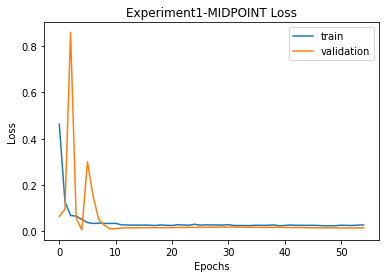


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 71.66249742365495 
RMSE:	 8.465370483543822 
MAPE:	 6.945165499596413

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 54.1687035256009 
RMSE:	 7.359939097954609 
MAPE:	 6.023882427496638

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.04043856386052 
RMSE:	 11.047191433294731 
MAPE:	 9.094033094452044

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 45.6842728316542 
RMSE:	 6.759014190816157 
MAPE:	 5.403969846039035

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 48.516945521896595 
RMSE:	 6.965410649911217 
MAPE:	 5.700028346794376
T3
T3([input_arrays], [timeper

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03019, saving model to LSTM1.h5
43/43 - 2s - loss: 0.2376 - val_loss: 0.0302 - lr: 0.0010 - 2s/epoch - 55ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.03019
43/43 - 1s - loss: 0.0957 - val_loss: 0.0381 - lr: 0.0010 - 556ms/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03019
43/43 - 1s - loss: 0.0784 - val_loss: 0.4512 - lr: 0.0010 - 519ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03019
43/43 - 1s - loss: 0.0599 - val_loss: 0.0439 - lr: 0.0010 - 569ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03019
43/43 - 0s - loss: 0.0478 - val_loss: 0.1065 - lr: 0.0010 - 490ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.03019
43/43 - 1s - loss: 0.0452 - val_loss: 0.0366 - lr: 0.0010 - 534ms/epoch - 12ms/step
Epoch 7

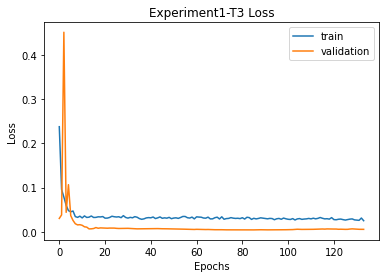


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 71.66249742365495 
RMSE:	 8.465370483543822 
MAPE:	 6.945165499596413

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 54.1687035256009 
RMSE:	 7.359939097954609 
MAPE:	 6.023882427496638

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.04043856386052 
RMSE:	 11.047191433294731 
MAPE:	 9.094033094452044

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 45.6842728316542 
RMSE:	 6.759014190816157 
MAPE:	 5.403969846039035

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 48.516945521896595 
RMSE:	 6.965410649911217 
MAPE:	 5.700028346794376

T3
Prediction vs Close:		55.6

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.00776, saving model to LSTM1.h5
90/90 - 3s - loss: 0.1544 - val_loss: 0.0078 - lr: 0.0010 - 3s/epoch - 32ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.00776
90/90 - 1s - loss: 0.1043 - val_loss: 0.1798 - lr: 0.0010 - 1s/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00776
90/90 - 1s - loss: 0.0682 - val_loss: 0.3403 - lr: 0.0010 - 1s/epoch - 13ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.00776 to 0.00637, saving model to LSTM1.h5
90/90 - 1s - loss: 0.0693 - val_loss: 0.0064 - lr: 0.0010 - 1s/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00637
90/90 - 1s - loss: 0.0427 - val_loss: 0.1361 - lr: 0.0010 - 1s/epoch - 12ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.00637 to 0.00614, saving model to LSTM1.h5
90/90 - 1s - loss: 0.0318 - val_loss: 0.0061 - lr: 0.0010 - 1s/epoch - 12ms/step
Epoch 7/500

Epoch 00007: val_loss did not i

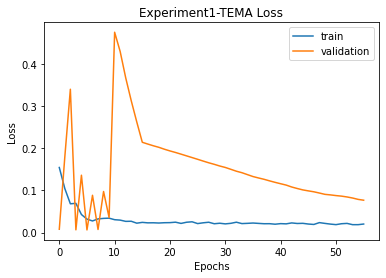


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.8316918621851 
RMSE:	 6.068911917484476 
MAPE:	 5.0566072358251795

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 71.66249742365495 
RMSE:	 8.465370483543822 
MAPE:	 6.945165499596413

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 54.1687035256009 
RMSE:	 7.359939097954609 
MAPE:	 6.023882427496638

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.04043856386052 
RMSE:	 11.047191433294731 
MAPE:	 9.094033094452044

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 45.6842728316542 
RMSE:	 6.759014190816157 
MAPE:	 5.403969846039035

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 48.516945521896595 
RMSE:	 6.965410649911217 
MAPE:	 5.700028346794376

T3
Prediction vs Close:		55.6

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation1 = {}
    imgfile = 'Experiment1'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation1[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation1_data.json', 'w') as fp:
                  json.dump(simulation1, fp)

              for ma in simulation1.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation1[ma]['final']['mse'],
                        '\nRMSE:\t', simulation1[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation1[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
            # code you want to evaluate
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment1.png to Experiment1 (1).png


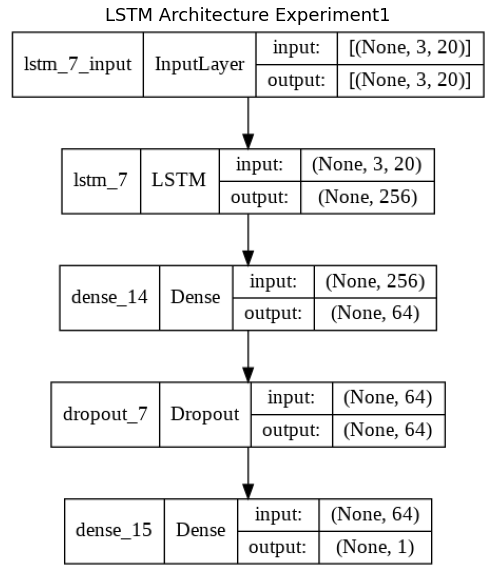

In [ ]:
img = cv2.imread('Experiment1.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

Excess kurtosis is a metric that compares the kurtosis of a distribution against the kurtosis of a normal distribution. The kurtosis of a normal distribution equals 3. Therefore, the excess kurtosis is found using the formula below:

Excess Kurtosis = Kurtosis – 3

### Model Plots

In [ ]:
np.save("X_train_appl.npy", X_train)
np.save("y_train_appl.npy", y_train)
np.save("X_test_appl.npy", X_test)
np.save("y_test_appl.npy", y_test)
np.save("yc_train_appl.npy", yc_train)
np.save("yc_test_appl.npy", yc_test)
np.save('index_train_appl.npy', index_train)
np.save('index_test_appl.npy', index_test)

In [ ]:
list(simulation1.keys())

['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'T3', 'TEMA']

In [149]:
cd Baseline/

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/Baseline


In [150]:
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)
fileimg = 'Experiment1'

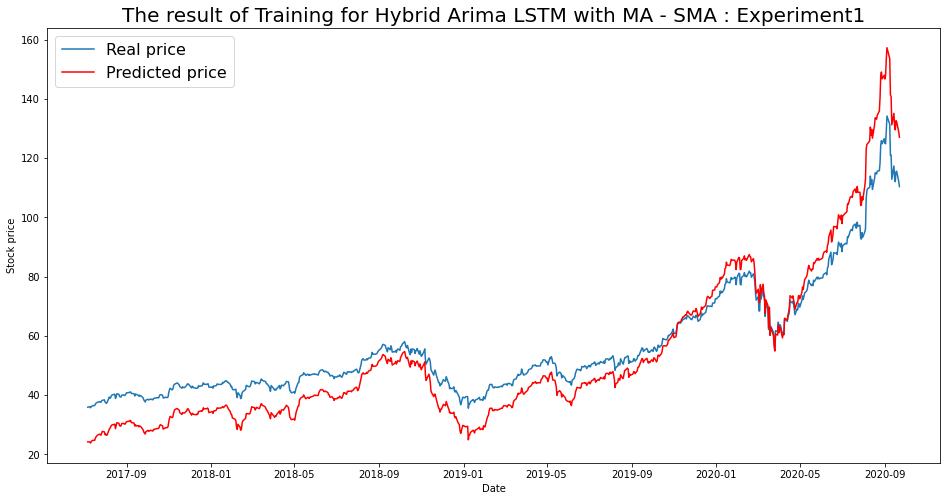

----- Train RMSE for SMA ----- 8.101384407635955
----- Train_MSE_LSTM for SMA ----- 65.63242932028696
----- Train MAE LSTM for SMA ----- 7.12864265033611


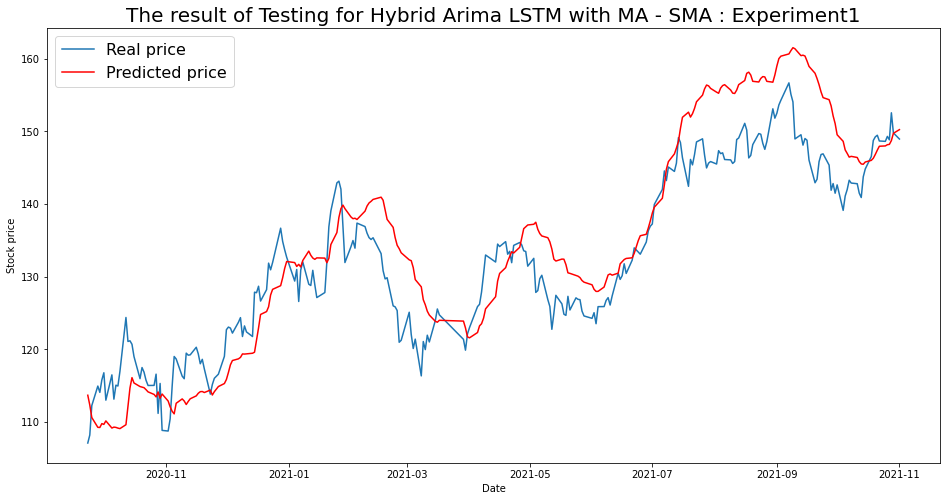

----- Test RMSE for SMA----- 6.068911917484476
----- Test_MSE_LSTM for SMA----- 36.8316918621851
----- Test_MAE_LSTM for SMA----- 5.0566072358251795


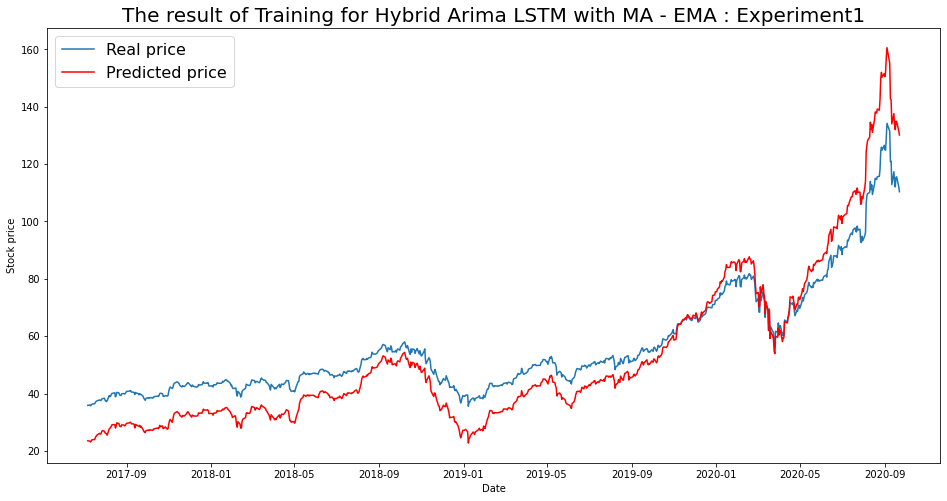

----- Train RMSE for EMA ----- 9.261011933284287
----- Train_MSE_LSTM for EMA ----- 85.76634202843398
----- Train MAE LSTM for EMA ----- 8.125450484877646


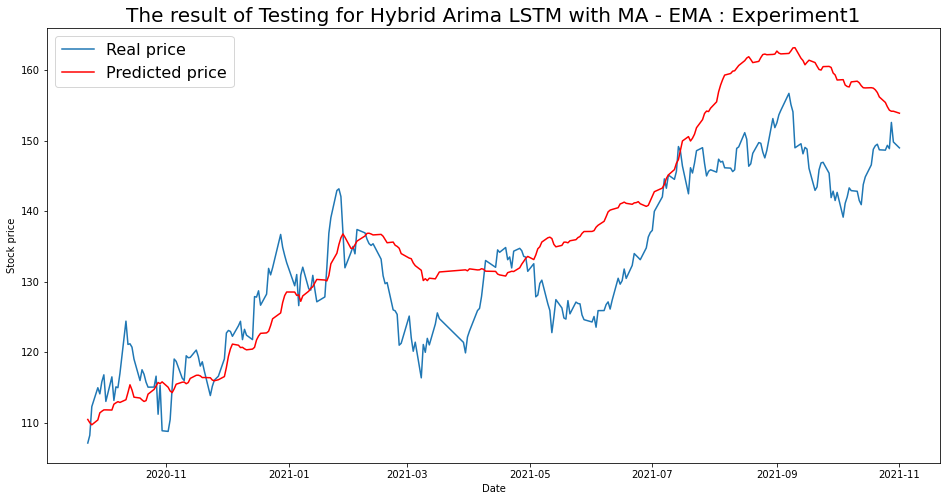

----- Test RMSE for EMA----- 8.465370483543822
----- Test_MSE_LSTM for EMA----- 71.66249742365495
----- Test_MAE_LSTM for EMA----- 6.945165499596413


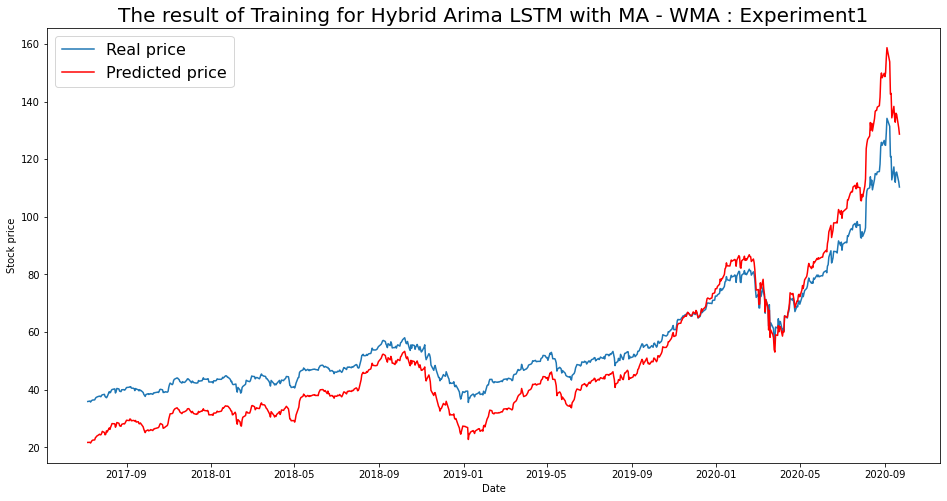

----- Train RMSE for WMA ----- 9.680943385400116
----- Train_MSE_LSTM for WMA ----- 93.72066483132228
----- Train MAE LSTM for WMA ----- 8.624995489295866


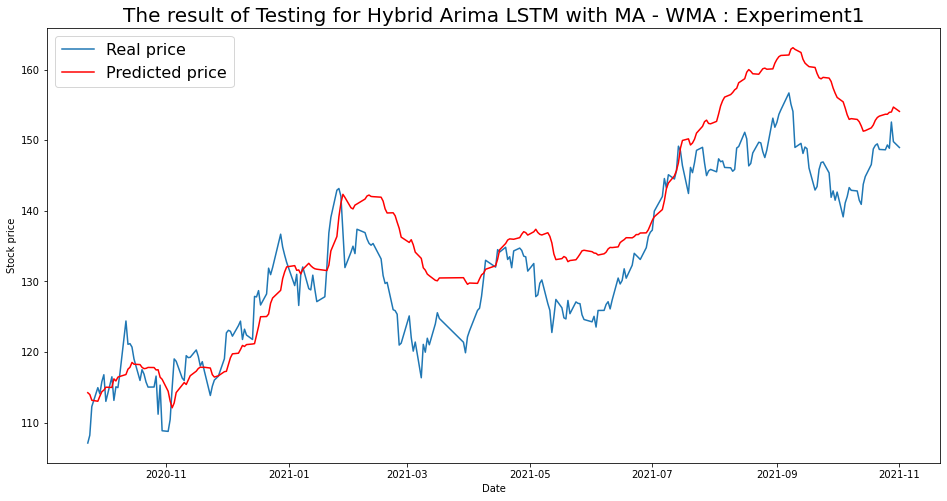

----- Test RMSE for WMA----- 7.359939097954609
----- Test_MSE_LSTM for WMA----- 54.1687035256009
----- Test_MAE_LSTM for WMA----- 6.023882427496638


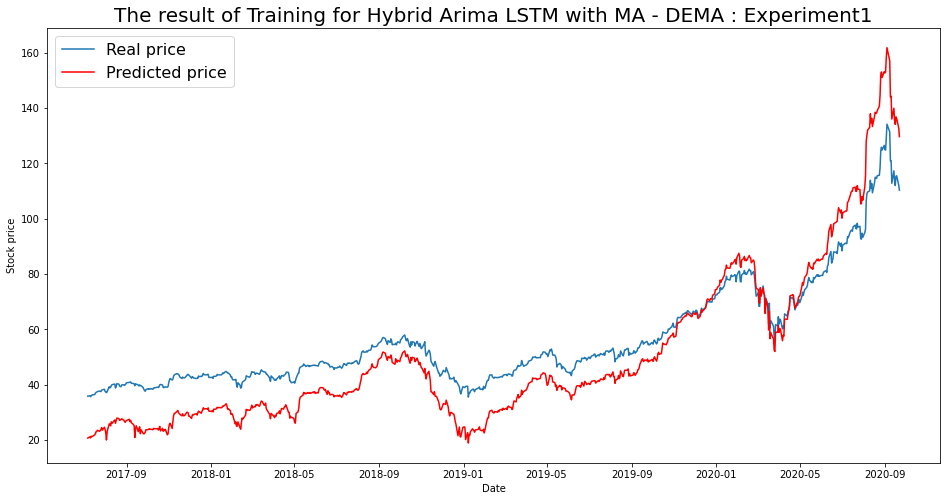

----- Train RMSE for DEMA ----- 11.21130086144242
----- Train_MSE_LSTM for DEMA ----- 125.69326700577953
----- Train MAE LSTM for DEMA ----- 9.93110792796441


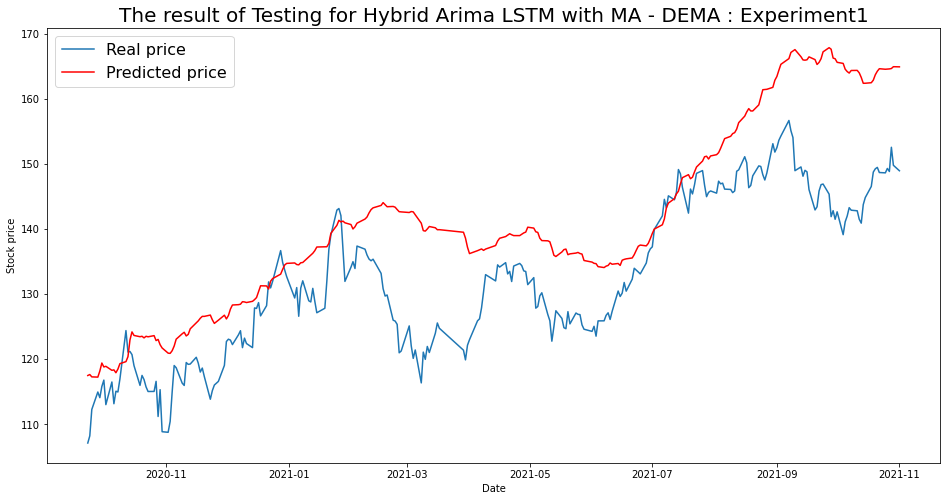

----- Test RMSE for DEMA----- 11.047191433294731
----- Test_MSE_LSTM for DEMA----- 122.04043856386052
----- Test_MAE_LSTM for DEMA----- 9.094033094452044


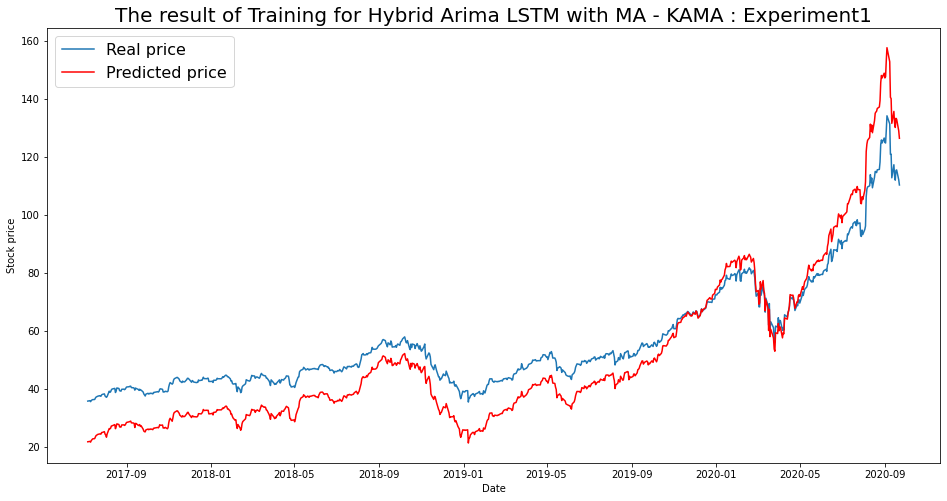

----- Train RMSE for KAMA ----- 9.898156197601981
----- Train_MSE_LSTM for KAMA ----- 97.97349611212653
----- Train MAE LSTM for KAMA ----- 8.903435802045117


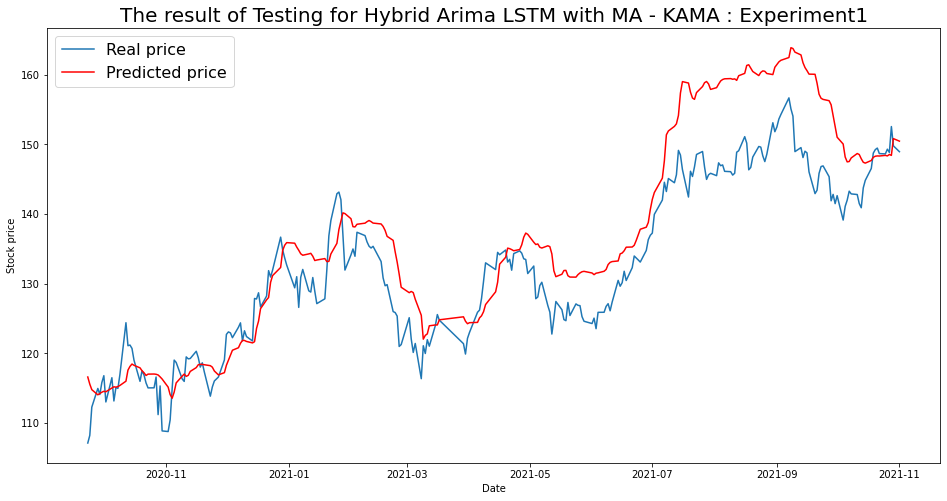

----- Test RMSE for KAMA----- 6.759014190816157
----- Test_MSE_LSTM for KAMA----- 45.6842728316542
----- Test_MAE_LSTM for KAMA----- 5.403969846039035


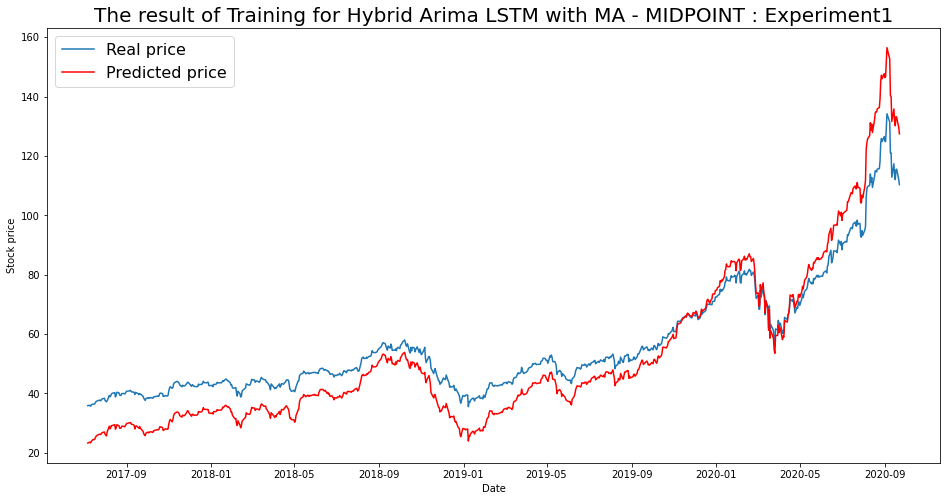

----- Train RMSE for MIDPOINT ----- 8.590477476695101
----- Train_MSE_LSTM for MIDPOINT ----- 73.79630327760584
----- Train MAE LSTM for MIDPOINT ----- 7.599525995487992


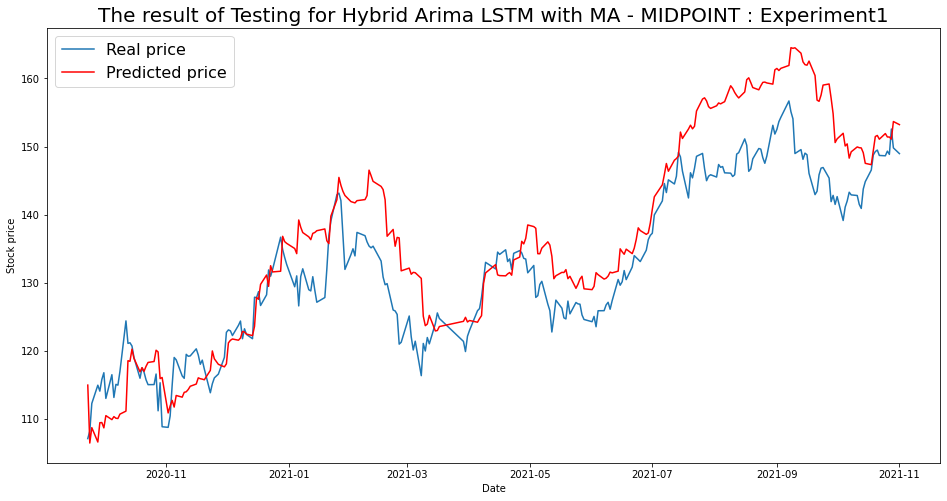

----- Test RMSE for MIDPOINT----- 6.965410649911217
----- Test_MSE_LSTM for MIDPOINT----- 48.516945521896595
----- Test_MAE_LSTM for MIDPOINT----- 5.700028346794376


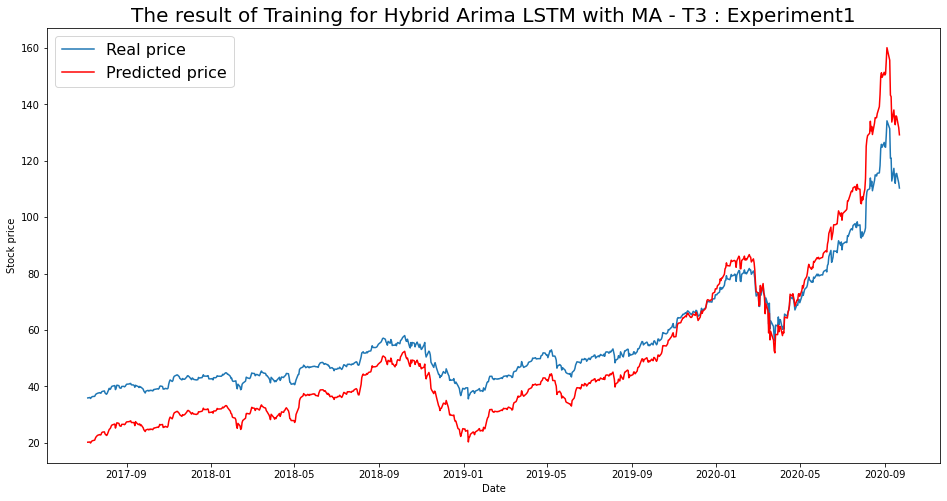

----- Train RMSE for T3 ----- 10.725412576084105
----- Train_MSE_LSTM for T3 ----- 115.03447492722309
----- Train MAE LSTM for T3 ----- 9.62275313761657


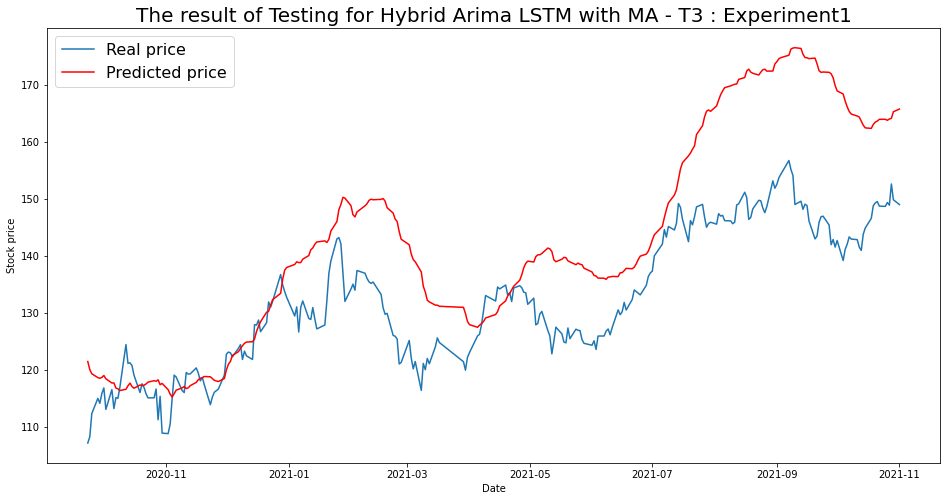

----- Test RMSE for T3----- 14.019217214863545
----- Test_MSE_LSTM for T3----- 196.53845131752638
----- Test_MAE_LSTM for T3----- 11.19411588232732


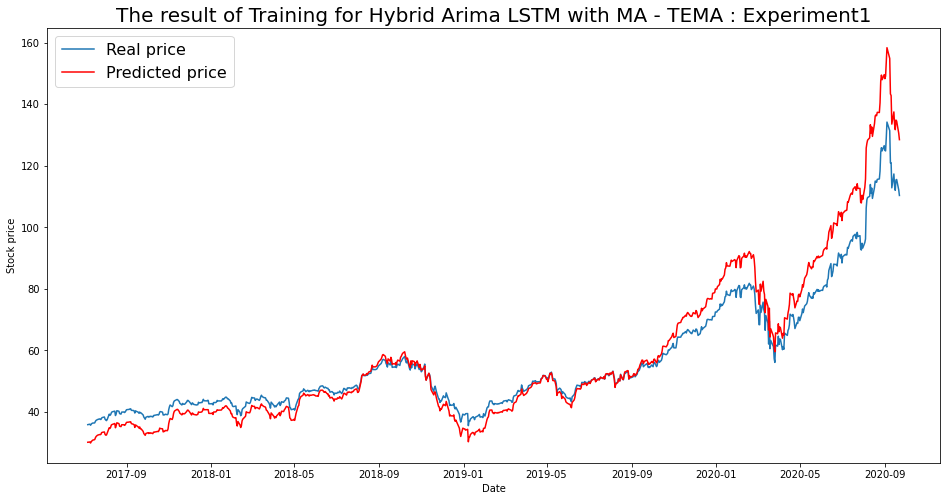

----- Train RMSE for TEMA ----- 6.8065683514131345
----- Train_MSE_LSTM for TEMA ----- 46.32937272245892
----- Train MAE LSTM for TEMA ----- 4.696228411463596


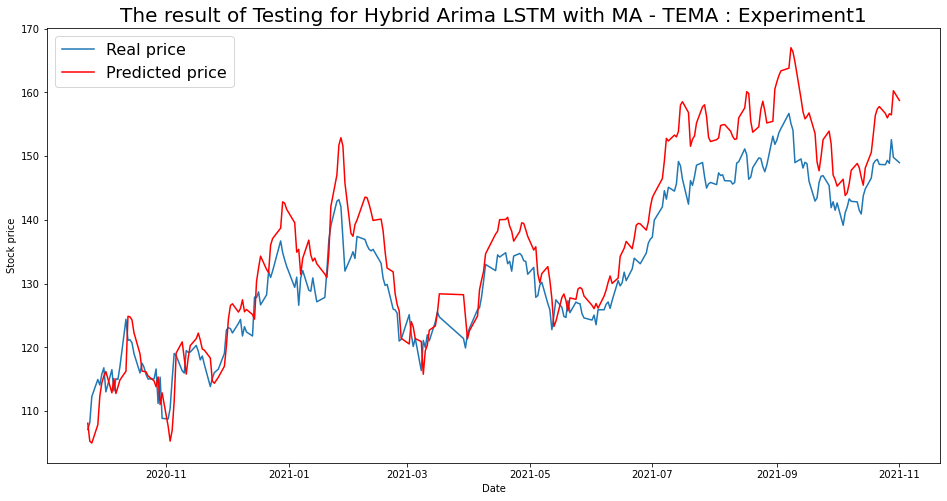

----- Test RMSE for TEMA----- 5.763100377621866
----- Test_MSE_LSTM for TEMA----- 33.21332596254529
----- Test_MAE_LSTM for TEMA----- 4.8410208542529105


In [157]:
for i in range(len(list(simulation1.keys()))):
  SIM = list(simulation1.keys())[i]
  plot_train(simulation1,SIM)
  plot_test(simulation1,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 2

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM2.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()




    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.63 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.07 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.97 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=1.06 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.26 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 3.547 seconds
                               SARIMAX Results                                
Dep.

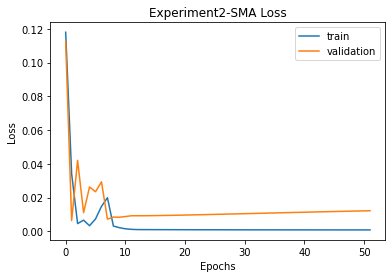


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.07 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.13 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.16 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.87 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.2

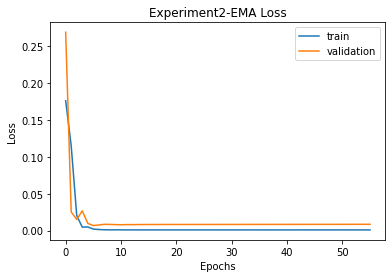


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 55.817061136968896 
RMSE:	 7.4710816577634125 
MAPE:	 6.256840285842
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.10 sec
 ARIMA(3,3,1)(0,0,0)[0]  

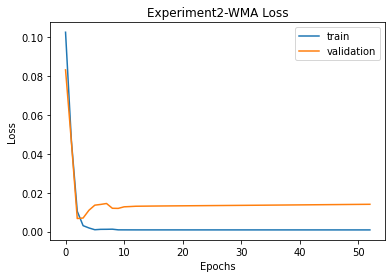


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 55.817061136968896 
RMSE:	 7.4710816577634125 
MAPE:	 6.256840285842

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 59.16871259968053 
RMSE:	 7.692120162847206 
MAPE:	 6.209776446209727
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.59 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf

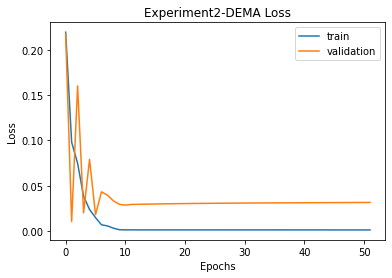


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 55.817061136968896 
RMSE:	 7.4710816577634125 
MAPE:	 6.256840285842

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 59.16871259968053 
RMSE:	 7.692120162847206 
MAPE:	 6.209776446209727

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 121.68296982011337 
RMSE:	 11.031000399787564 
MAPE:	 9.966678894256134
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(0,3,0)(0

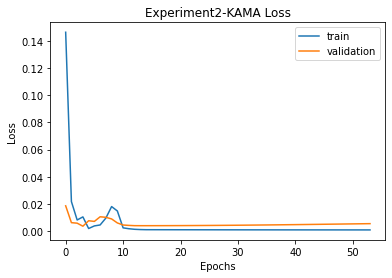


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 55.817061136968896 
RMSE:	 7.4710816577634125 
MAPE:	 6.256840285842

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 59.16871259968053 
RMSE:	 7.692120162847206 
MAPE:	 6.209776446209727

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 121.68296982011337 
RMSE:	 11.031000399787564 
MAPE:	 9.966678894256134

KAMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.818484868395416 
RMSE:	 7.669321017430123 
MAPE:	 6.375419548070835
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

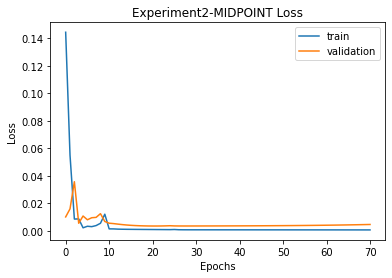


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 55.817061136968896 
RMSE:	 7.4710816577634125 
MAPE:	 6.256840285842

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 59.16871259968053 
RMSE:	 7.692120162847206 
MAPE:	 6.209776446209727

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 121.68296982011337 
RMSE:	 11.031000399787564 
MAPE:	 9.966678894256134

KAMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.818484868395416 
RMSE:	 7.669321017430123 
MAPE:	 6.375419548070835

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 65.76580507888394 
RMSE:	 8.109611894467204 
MAPE:	 6.6791438644890375
T3
T3([input_arrays], [tim

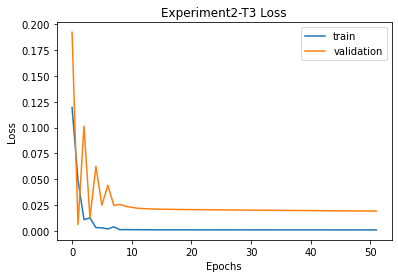


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 55.817061136968896 
RMSE:	 7.4710816577634125 
MAPE:	 6.256840285842

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 59.16871259968053 
RMSE:	 7.692120162847206 
MAPE:	 6.209776446209727

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 121.68296982011337 
RMSE:	 11.031000399787564 
MAPE:	 9.966678894256134

KAMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.818484868395416 
RMSE:	 7.669321017430123 
MAPE:	 6.375419548070835

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 65.76580507888394 
RMSE:	 8.109611894467204 
MAPE:	 6.6791438644890375

T3
Prediction vs Close:		

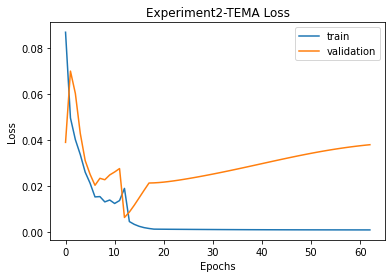


SMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.7298089742155 
RMSE:	 7.330062003435954 
MAPE:	 5.9334980672321835

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 55.817061136968896 
RMSE:	 7.4710816577634125 
MAPE:	 6.256840285842

WMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 59.16871259968053 
RMSE:	 7.692120162847206 
MAPE:	 6.209776446209727

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 121.68296982011337 
RMSE:	 11.031000399787564 
MAPE:	 9.966678894256134

KAMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.818484868395416 
RMSE:	 7.669321017430123 
MAPE:	 6.375419548070835

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 65.76580507888394 
RMSE:	 8.109611894467204 
MAPE:	 6.6791438644890375

T3
Prediction vs Close:		

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation2 = {}
    imgfile = 'Experiment2'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation2[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation2_data.json', 'w') as fp:
                  json.dump(simulation2, fp)                 

              for ma in simulation2.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation2[ma]['final']['mse'],
                        '\nRMSE:\t', simulation2[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation2[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment2.png to Experiment2 (2).png


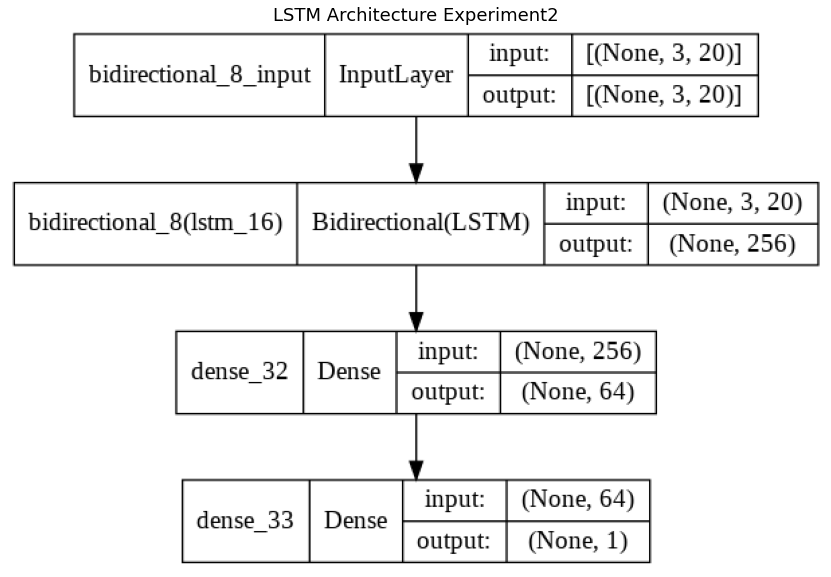

In [ ]:
img = cv2.imread('Experiment2.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [159]:
with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)
fileimg = 'Experiment2'

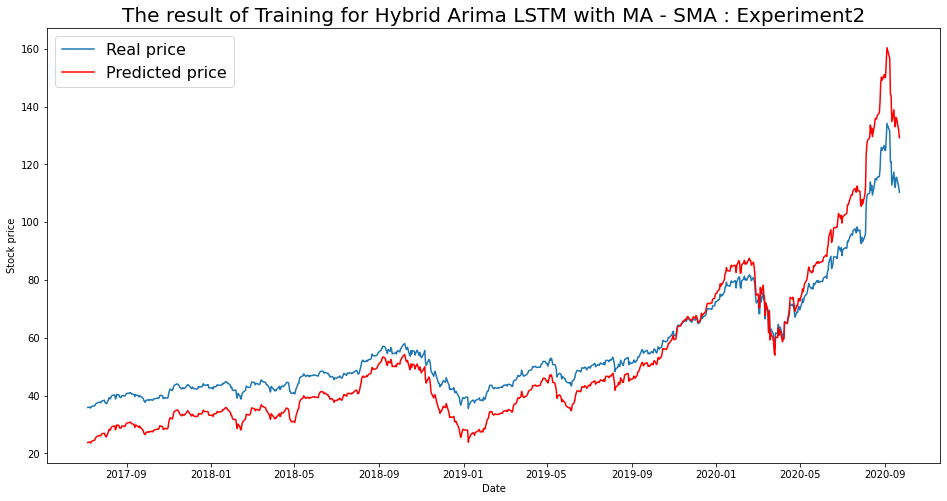

----- Train RMSE for SMA ----- 8.883824208650845
----- Train_MSE_LSTM for SMA ----- 78.92233257021081
----- Train MAE LSTM for SMA ----- 7.759502069503622


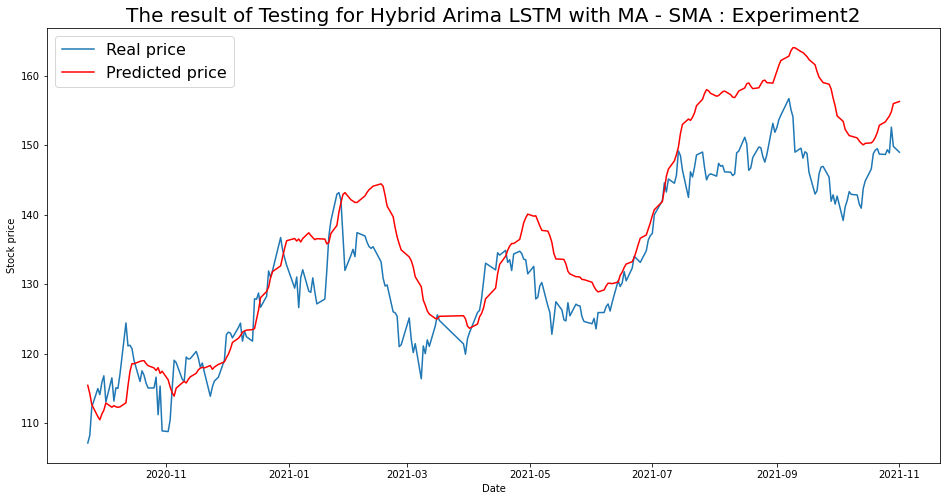

----- Test RMSE for SMA----- 7.330062003435954
----- Test_MSE_LSTM for SMA----- 53.7298089742155
----- Test_MAE_LSTM for SMA----- 5.9334980672321835


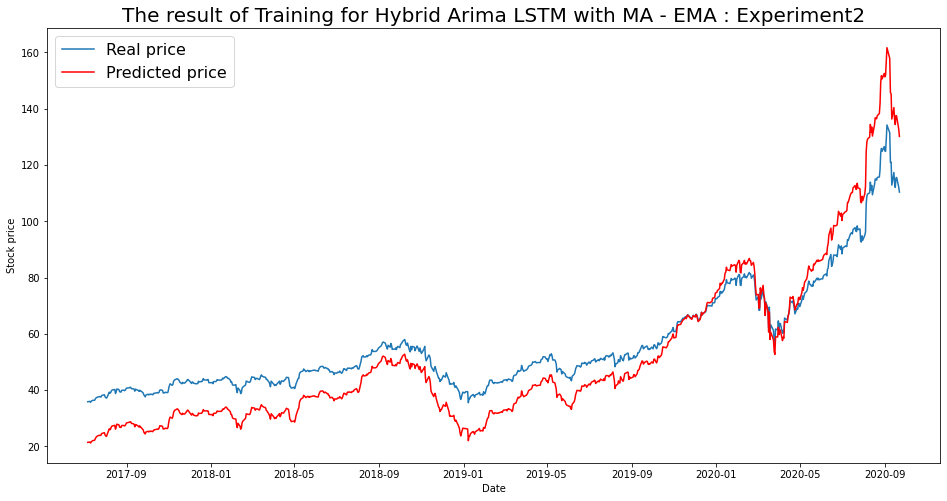

----- Train RMSE for EMA ----- 10.178751115321669
----- Train_MSE_LSTM for EMA ----- 103.60697426766212
----- Train MAE LSTM for EMA ----- 8.999046714729769


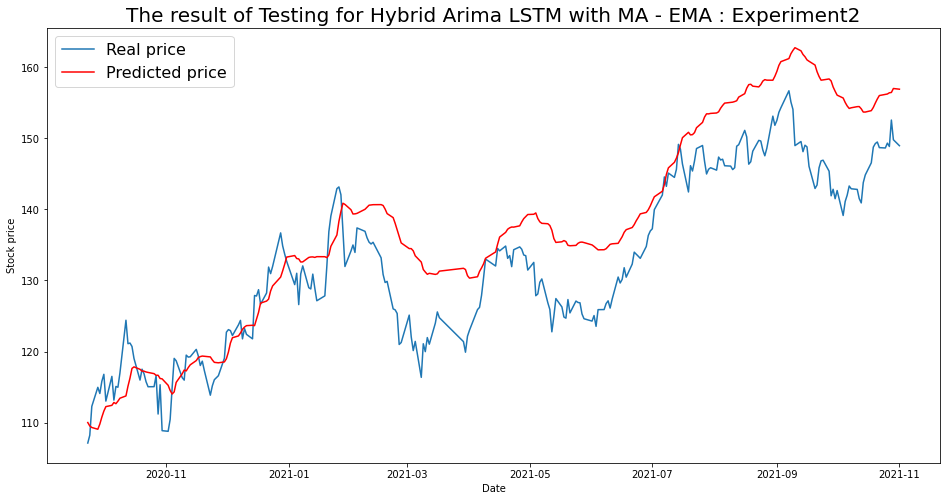

----- Test RMSE for EMA----- 7.4710816577634125
----- Test_MSE_LSTM for EMA----- 55.817061136968896
----- Test_MAE_LSTM for EMA----- 6.256840285842


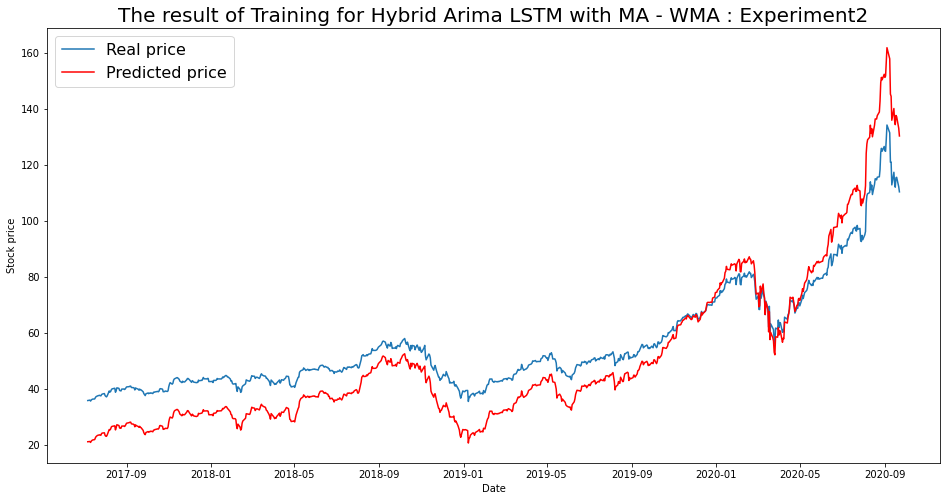

----- Train RMSE for WMA ----- 10.488755425217372
----- Train_MSE_LSTM for WMA ----- 110.01399037002683
----- Train MAE LSTM for WMA ----- 9.340163706061846


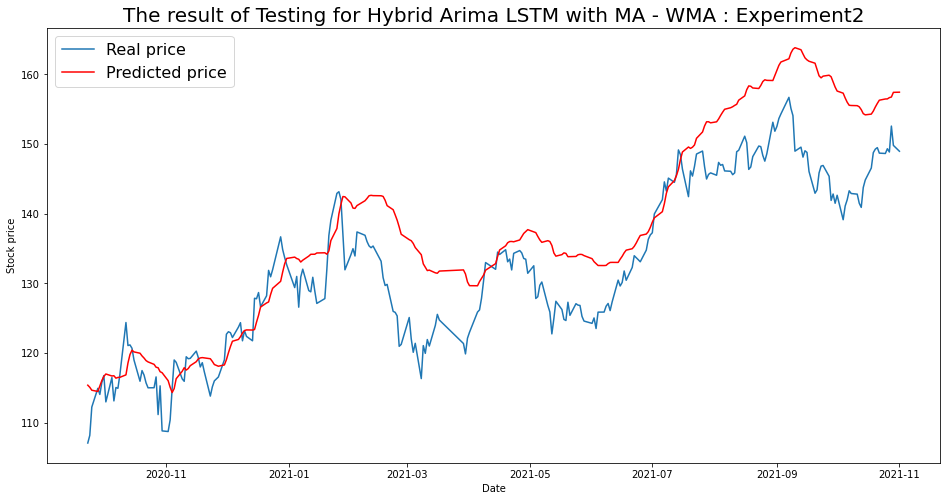

----- Test RMSE for WMA----- 7.692120162847206
----- Test_MSE_LSTM for WMA----- 59.16871259968053
----- Test_MAE_LSTM for WMA----- 6.209776446209727


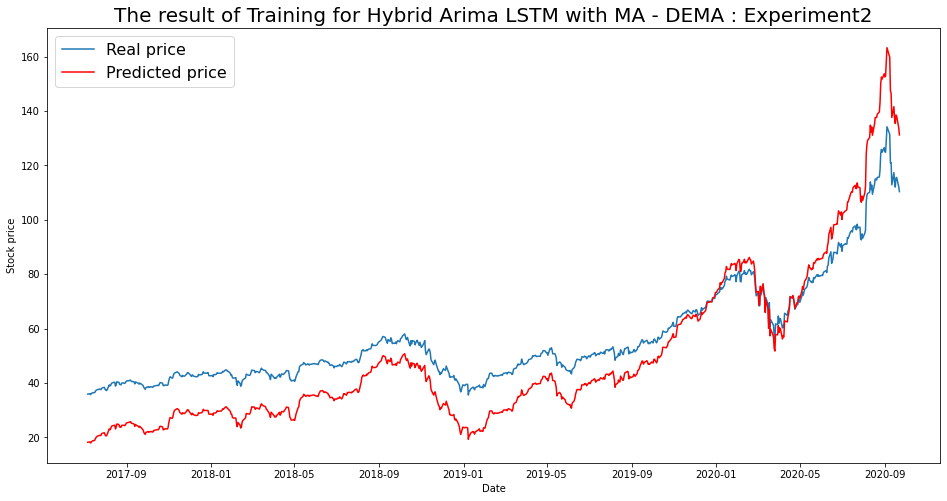

----- Train RMSE for DEMA ----- 12.116814300802416
----- Train_MSE_LSTM for DEMA ----- 146.8171888001299
----- Train MAE LSTM for DEMA ----- 10.890864077063352


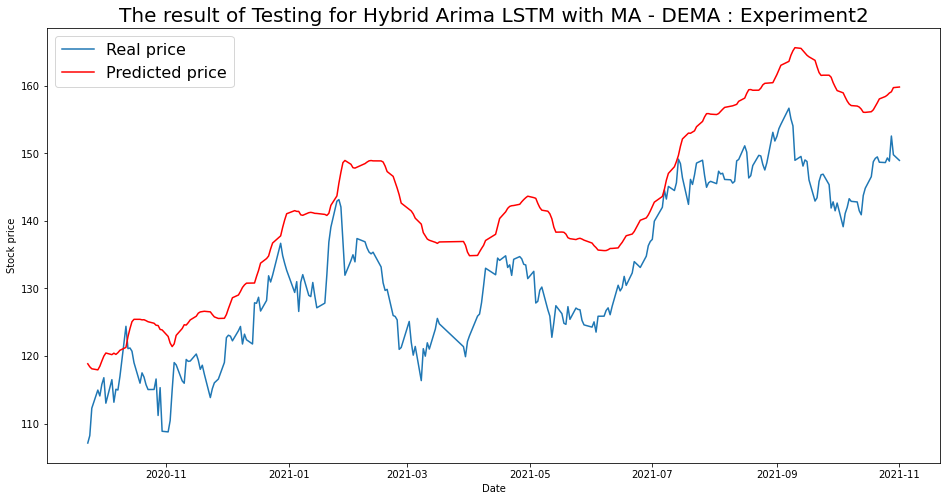

----- Test RMSE for DEMA----- 11.031000399787564
----- Test_MSE_LSTM for DEMA----- 121.68296982011337
----- Test_MAE_LSTM for DEMA----- 9.966678894256134


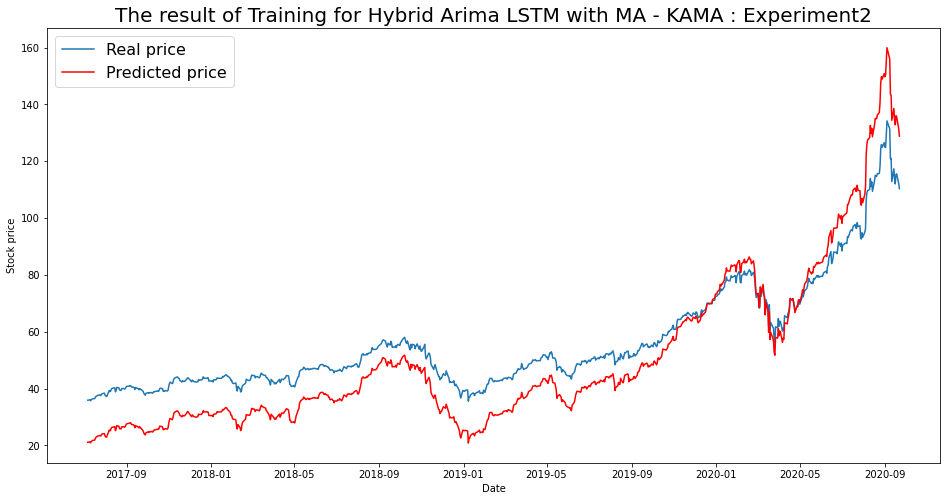

----- Train RMSE for KAMA ----- 10.567068166180624
----- Train_MSE_LSTM for KAMA ----- 111.66292962870791
----- Train MAE LSTM for KAMA ----- 9.505079388517037


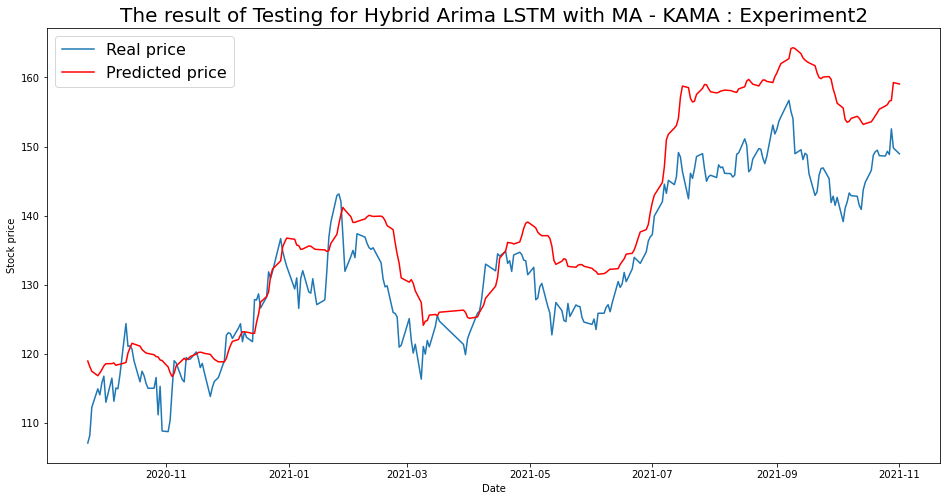

----- Test RMSE for KAMA----- 7.669321017430123
----- Test_MSE_LSTM for KAMA----- 58.818484868395416
----- Test_MAE_LSTM for KAMA----- 6.375419548070835


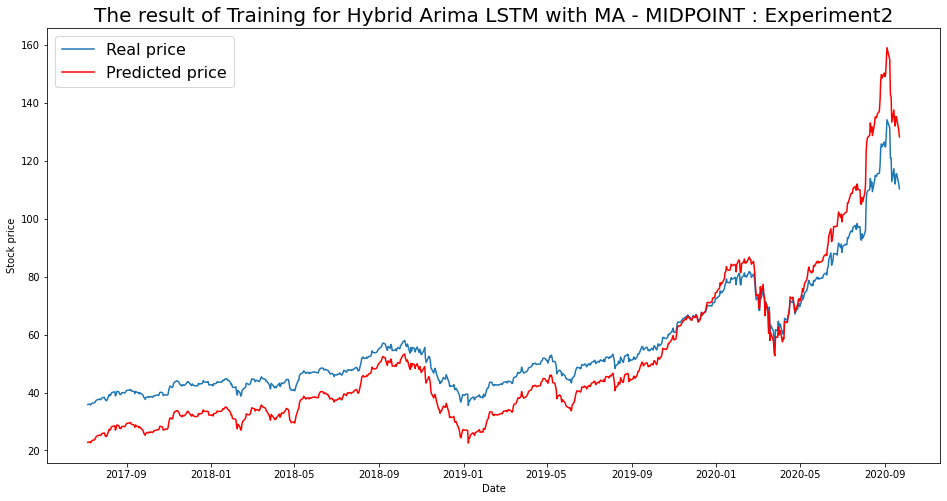

----- Train RMSE for MIDPOINT ----- 9.436849912992995
----- Train_MSE_LSTM for MIDPOINT ----- 89.05413628035592
----- Train MAE LSTM for MIDPOINT ----- 8.38001328239812


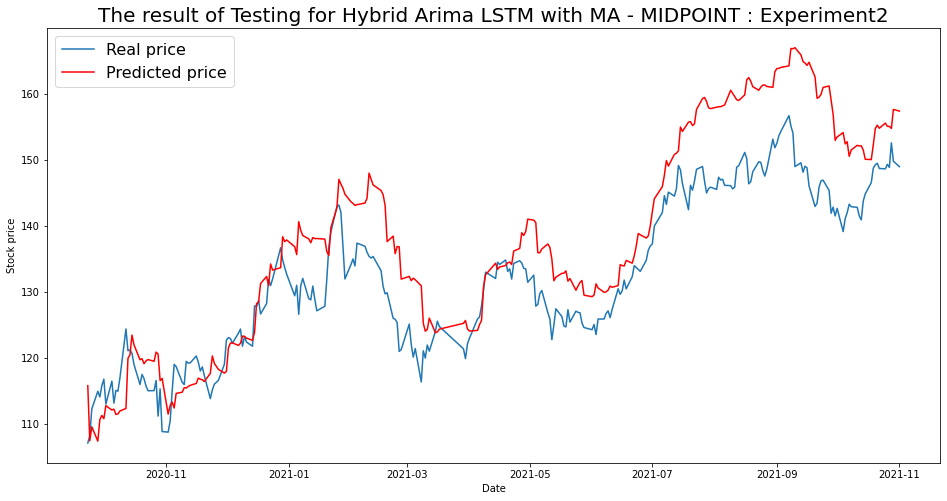

----- Test RMSE for MIDPOINT----- 8.109611894467204
----- Test_MSE_LSTM for MIDPOINT----- 65.76580507888394
----- Test_MAE_LSTM for MIDPOINT----- 6.6791438644890375


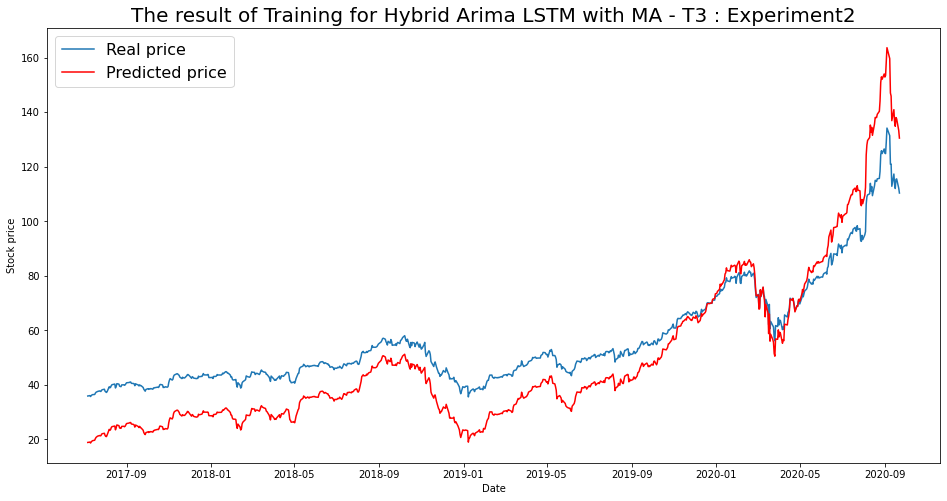

----- Train RMSE for T3 ----- 12.018635753983755
----- Train_MSE_LSTM for T3 ----- 144.44760538693666
----- Train MAE LSTM for T3 ----- 10.802987882431763


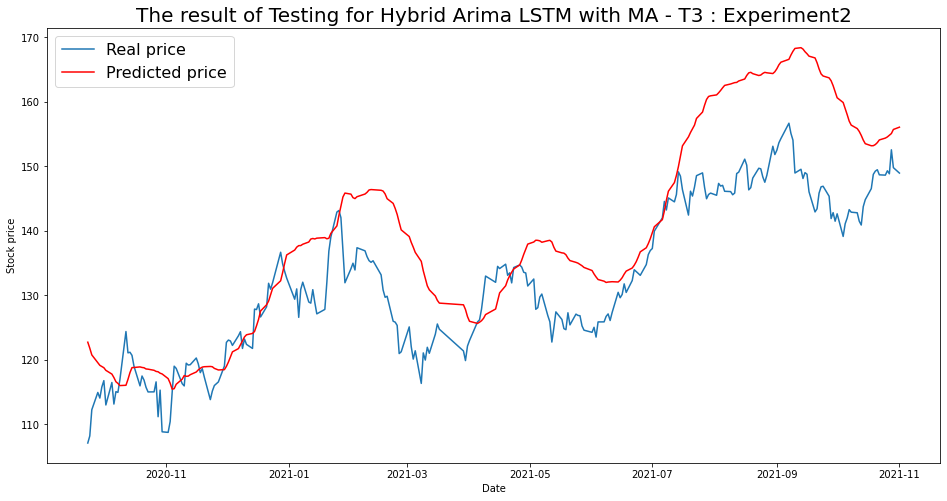

----- Test RMSE for T3----- 10.048465542477471
----- Test_MSE_LSTM for T3----- 100.97165975835705
----- Test_MAE_LSTM for T3----- 8.008063201476219


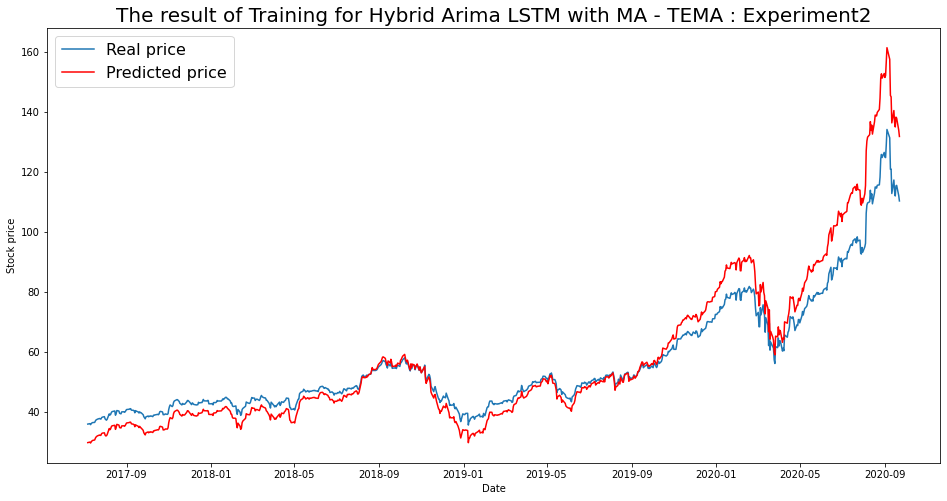

----- Train RMSE for TEMA ----- 7.4420039211189355
----- Train_MSE_LSTM for TEMA ----- 55.383422361949606
----- Train MAE LSTM for TEMA ----- 5.1575921766510655


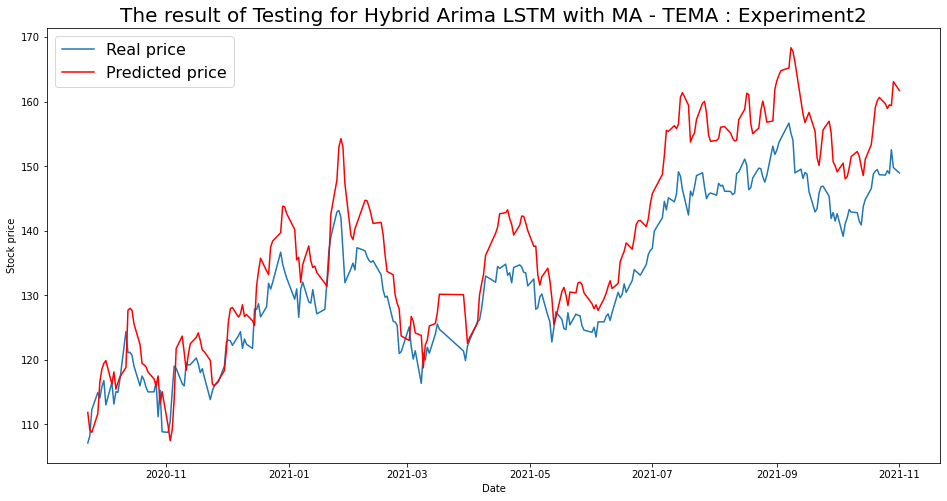

----- Test RMSE for TEMA----- 7.2769804555172035
----- Test_MSE_LSTM for TEMA----- 52.954444549979364
----- Test_MAE_LSTM for TEMA----- 6.363917319886005


In [160]:
for i in range(len(list(simulation2.keys()))):
  SIM = list(simulation2.keys())[i]
  plot_train(simulation2,SIM)
  plot_test(simulation2,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 3

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM3.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.67 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.00 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=1.07 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.27 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 3.647 seconds
                               SARIMAX Results                                
Dep.

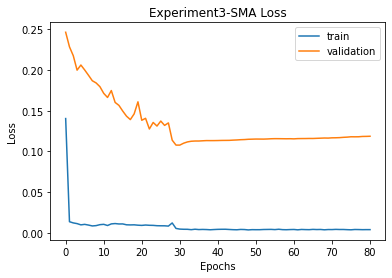


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.55 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.11 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.83 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.2

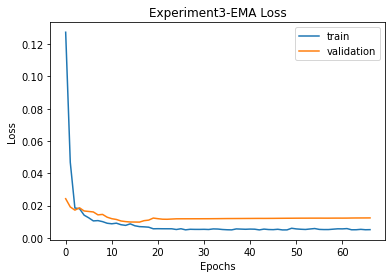


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 55.32374016164833 
RMSE:	 7.437993019736462 
MAPE:	 6.054411328729787
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0] 

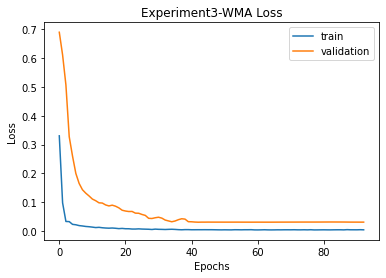


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 55.32374016164833 
RMSE:	 7.437993019736462 
MAPE:	 6.054411328729787

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 50.84988253427031 
RMSE:	 7.1309103580307545 
MAPE:	 5.537694007766219
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=

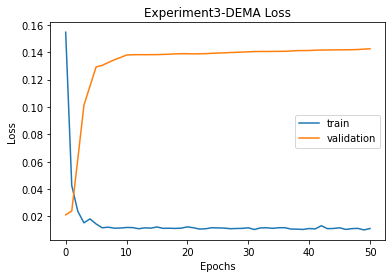


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 55.32374016164833 
RMSE:	 7.437993019736462 
MAPE:	 6.054411328729787

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 50.84988253427031 
RMSE:	 7.1309103580307545 
MAPE:	 5.537694007766219

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 37.751390897405116 
RMSE:	 6.144216052305218 
MAPE:	 4.610910381239713
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(0,3,0)

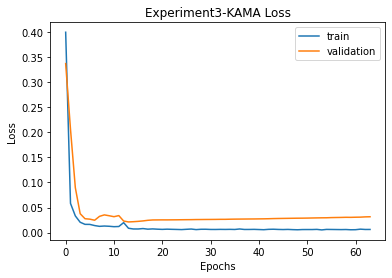


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 55.32374016164833 
RMSE:	 7.437993019736462 
MAPE:	 6.054411328729787

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 50.84988253427031 
RMSE:	 7.1309103580307545 
MAPE:	 5.537694007766219

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 37.751390897405116 
RMSE:	 6.144216052305218 
MAPE:	 4.610910381239713

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	51.12% Accuracy
MSE:	 36.41651471411913 
RMSE:	 6.034609740001348 
MAPE:	 4.797119170641582
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MI

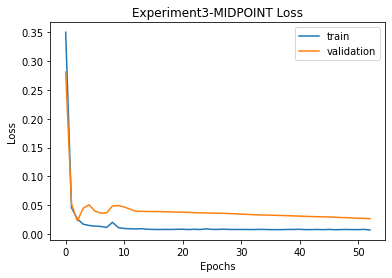


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 55.32374016164833 
RMSE:	 7.437993019736462 
MAPE:	 6.054411328729787

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 50.84988253427031 
RMSE:	 7.1309103580307545 
MAPE:	 5.537694007766219

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 37.751390897405116 
RMSE:	 6.144216052305218 
MAPE:	 4.610910381239713

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	51.12% Accuracy
MSE:	 36.41651471411913 
RMSE:	 6.034609740001348 
MAPE:	 4.797119170641582

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 142.27347883578213 
RMSE:	 11.927844685264063 
MAPE:	 10.30348805298139
T3
T3([input_arrays], [t

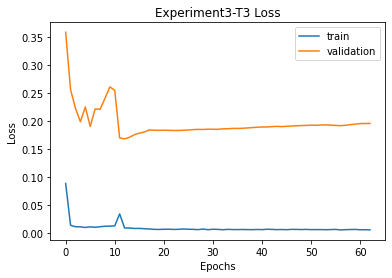


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 55.32374016164833 
RMSE:	 7.437993019736462 
MAPE:	 6.054411328729787

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 50.84988253427031 
RMSE:	 7.1309103580307545 
MAPE:	 5.537694007766219

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 37.751390897405116 
RMSE:	 6.144216052305218 
MAPE:	 4.610910381239713

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	51.12% Accuracy
MSE:	 36.41651471411913 
RMSE:	 6.034609740001348 
MAPE:	 4.797119170641582

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 142.27347883578213 
RMSE:	 11.927844685264063 
MAPE:	 10.30348805298139

T3
Prediction vs Close:

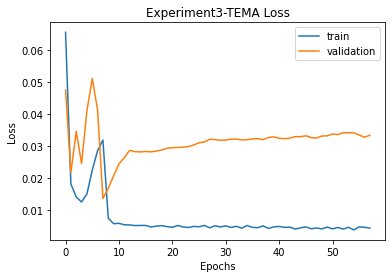


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 18.67415384478757 
RMSE:	 4.321360184570081 
MAPE:	 3.534296685764838

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 55.32374016164833 
RMSE:	 7.437993019736462 
MAPE:	 6.054411328729787

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 50.84988253427031 
RMSE:	 7.1309103580307545 
MAPE:	 5.537694007766219

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 37.751390897405116 
RMSE:	 6.144216052305218 
MAPE:	 4.610910381239713

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	51.12% Accuracy
MSE:	 36.41651471411913 
RMSE:	 6.034609740001348 
MAPE:	 4.797119170641582

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 142.27347883578213 
RMSE:	 11.927844685264063 
MAPE:	 10.30348805298139

T3
Prediction vs Close:

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation3 = {}
    imgfile = 'Experiment3'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation3[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation3_data.json', 'w') as fp:
                  json.dump(simulation3, fp)

              for ma in simulation3.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation3[ma]['final']['mse'],
                        '\nRMSE:\t', simulation3[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation3[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment3.png to Experiment3 (2).png


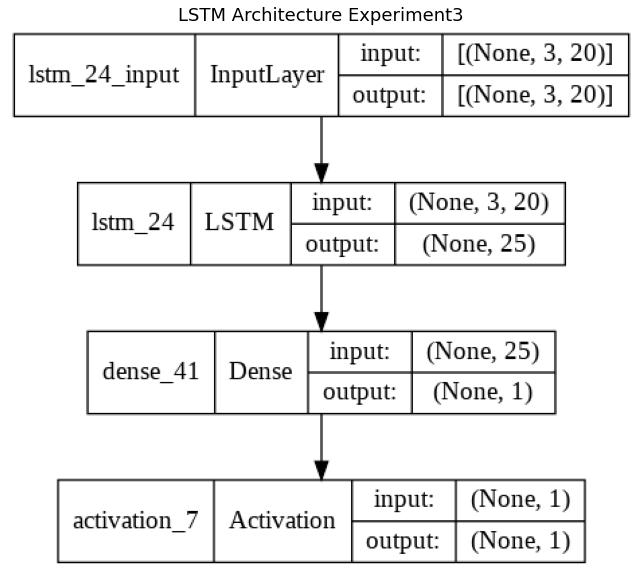

In [ ]:
img = cv2.imread('Experiment3.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [161]:
with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)
fileimg = 'Experiment3'

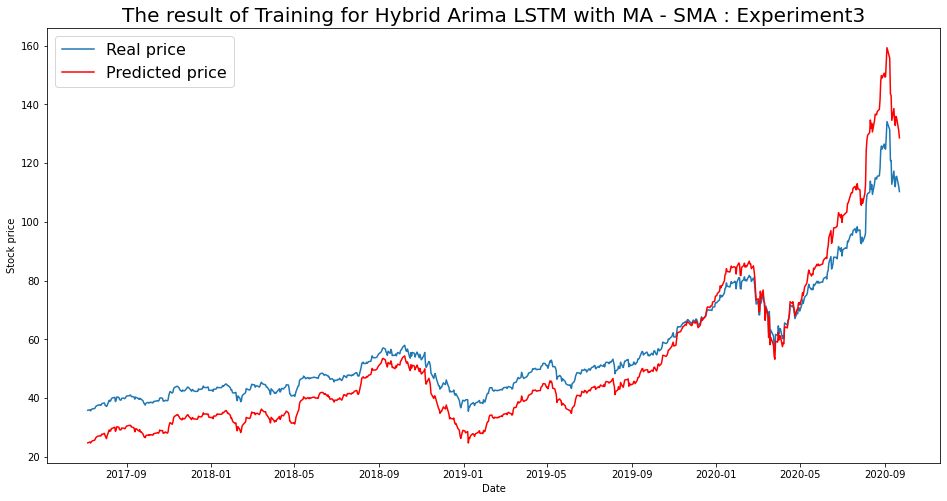

----- Train RMSE for SMA ----- 8.884133743304334
----- Train_MSE_LSTM for SMA ----- 78.92783236891867
----- Train MAE LSTM for SMA ----- 7.781090163518295


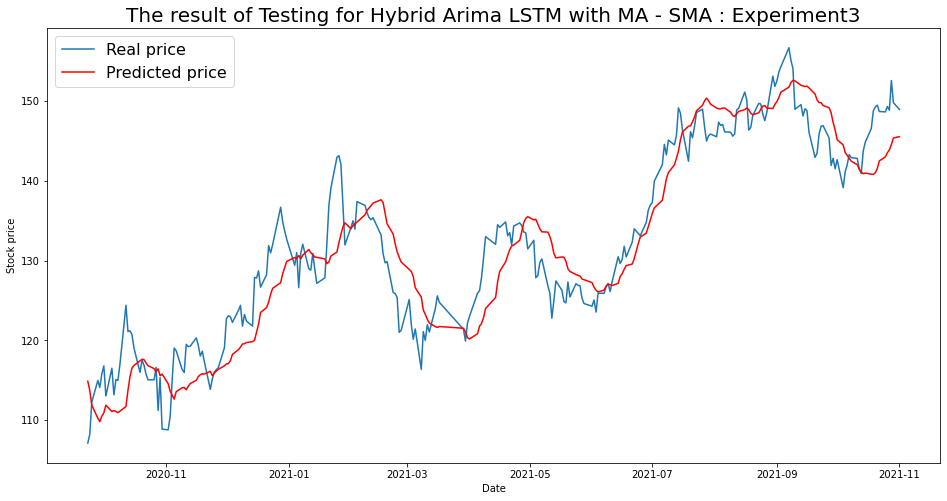

----- Test RMSE for SMA----- 4.321360184570081
----- Test_MSE_LSTM for SMA----- 18.67415384478757
----- Test_MAE_LSTM for SMA----- 3.534296685764838


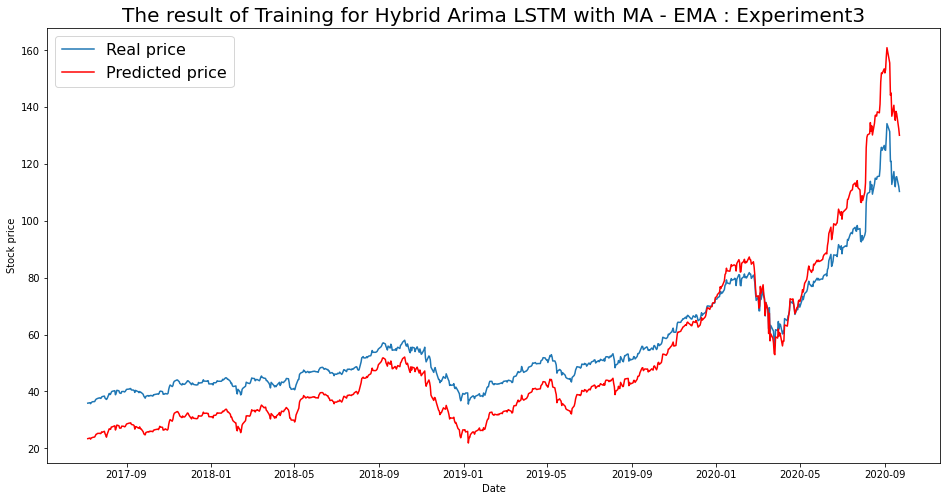

----- Train RMSE for EMA ----- 10.435802766835762
----- Train_MSE_LSTM for EMA ----- 108.90597938829693
----- Train MAE LSTM for EMA ----- 9.400510274555584


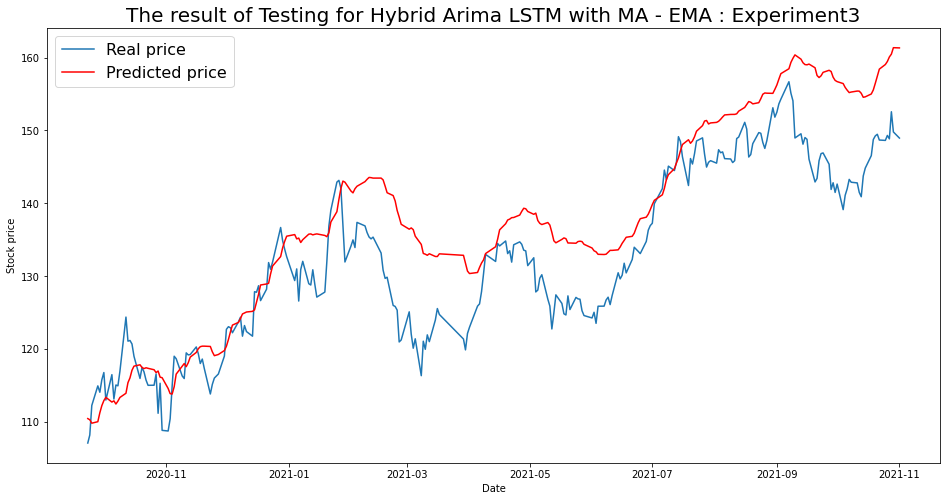

----- Test RMSE for EMA----- 7.437993019736462
----- Test_MSE_LSTM for EMA----- 55.32374016164833
----- Test_MAE_LSTM for EMA----- 6.054411328729787


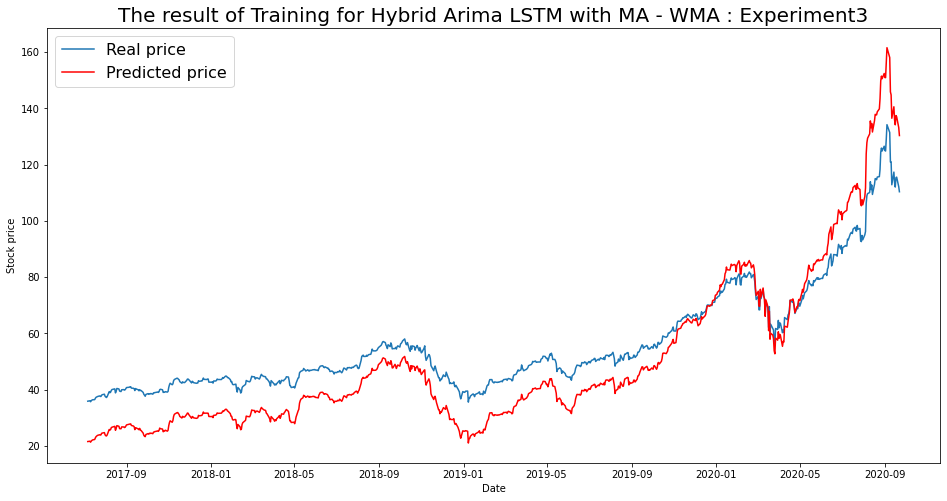

----- Train RMSE for WMA ----- 10.964398903404335
----- Train_MSE_LSTM for WMA ----- 120.21804331297417
----- Train MAE LSTM for WMA ----- 9.877309820725408


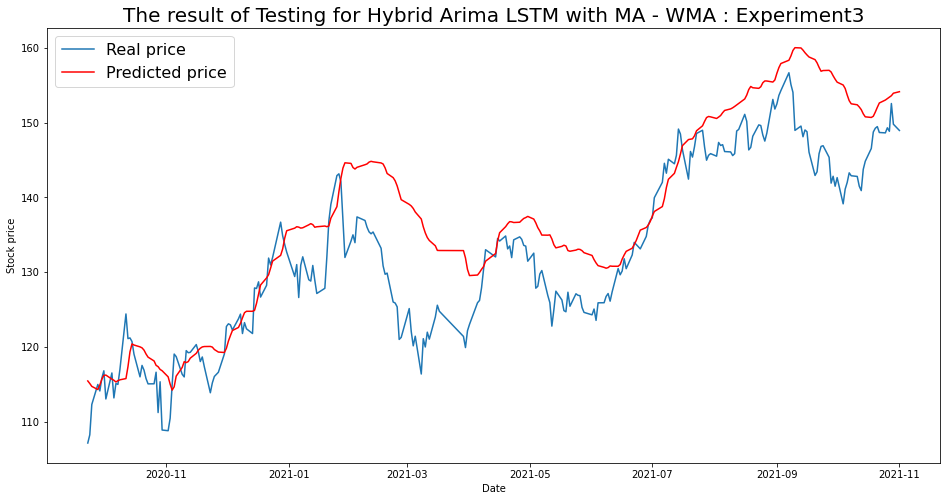

----- Test RMSE for WMA----- 7.1309103580307545
----- Test_MSE_LSTM for WMA----- 50.84988253427031
----- Test_MAE_LSTM for WMA----- 5.537694007766219


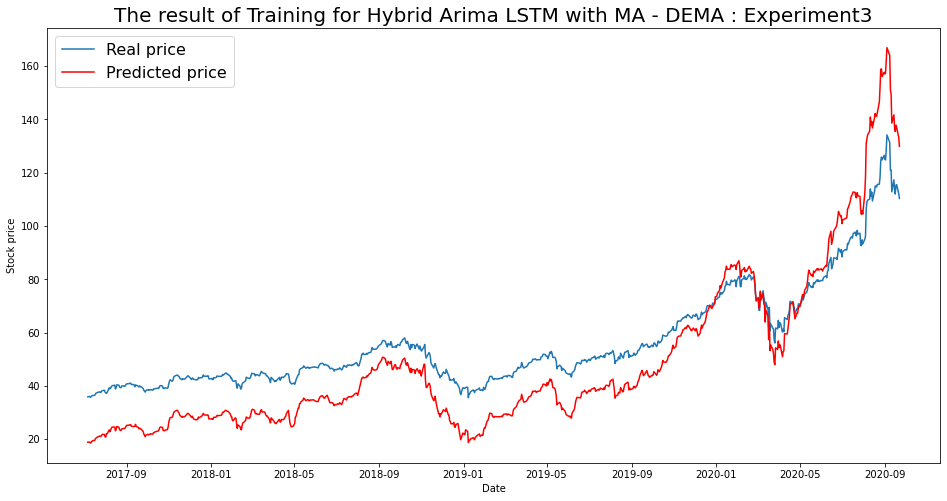

----- Train RMSE for DEMA ----- 13.217609293554304
----- Train_MSE_LSTM for DEMA ----- 174.7051954370531
----- Train MAE LSTM for DEMA ----- 12.005053275522988


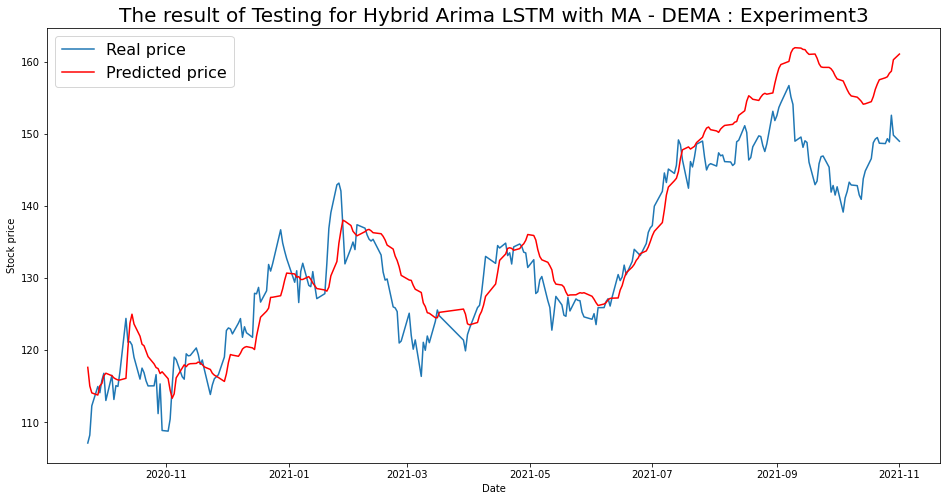

----- Test RMSE for DEMA----- 6.144216052305218
----- Test_MSE_LSTM for DEMA----- 37.751390897405116
----- Test_MAE_LSTM for DEMA----- 4.610910381239713


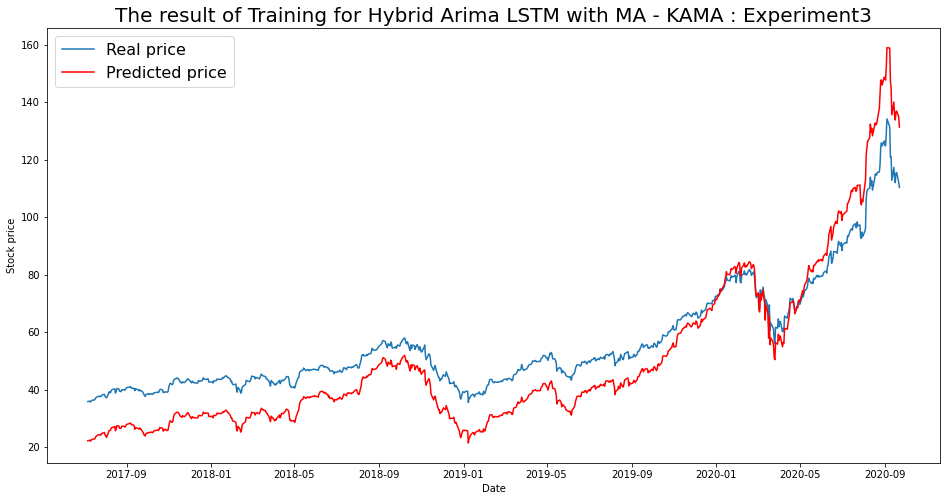

----- Train RMSE for KAMA ----- 10.684929530335653
----- Train_MSE_LSTM for KAMA ----- 114.16771906823887
----- Train MAE LSTM for KAMA ----- 9.754891158846936


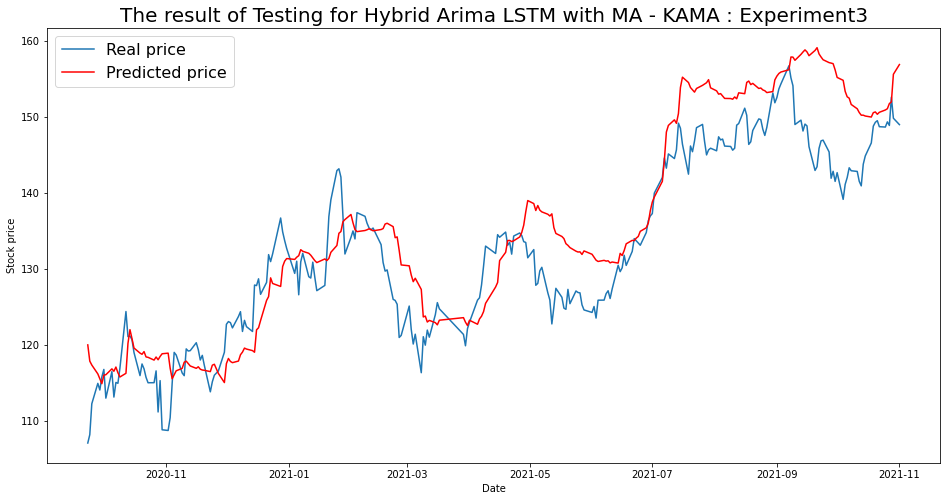

----- Test RMSE for KAMA----- 6.034609740001348
----- Test_MSE_LSTM for KAMA----- 36.41651471411913
----- Test_MAE_LSTM for KAMA----- 4.797119170641582


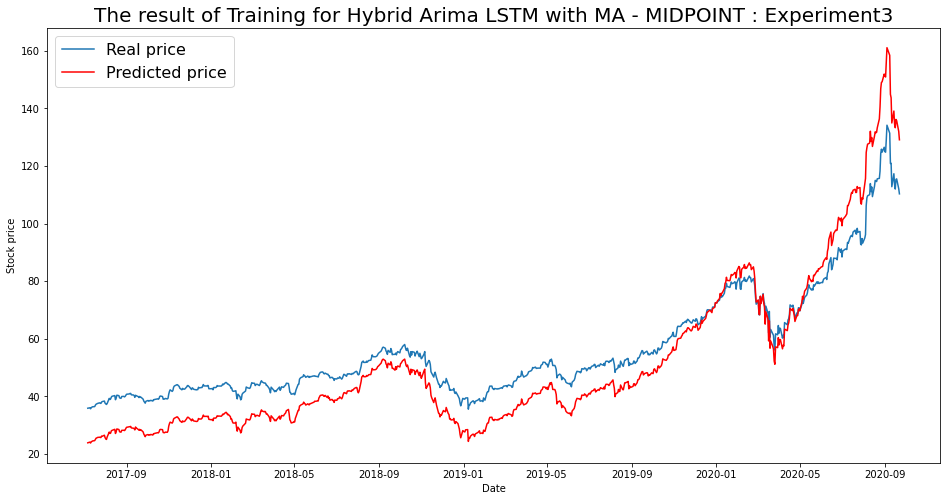

----- Train RMSE for MIDPOINT ----- 9.606108576890206
----- Train_MSE_LSTM for MIDPOINT ----- 92.27732199100357
----- Train MAE LSTM for MIDPOINT ----- 8.582213228909325


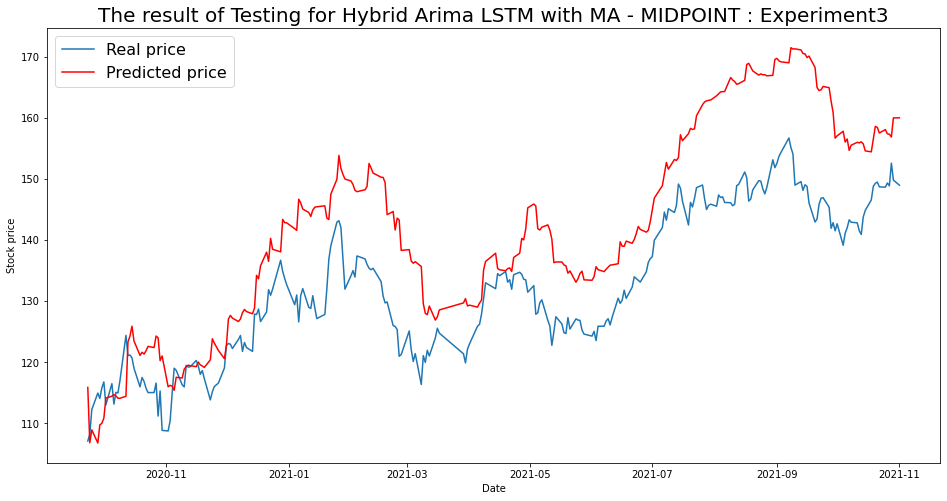

----- Test RMSE for MIDPOINT----- 11.927844685264063
----- Test_MSE_LSTM for MIDPOINT----- 142.27347883578213
----- Test_MAE_LSTM for MIDPOINT----- 10.30348805298139


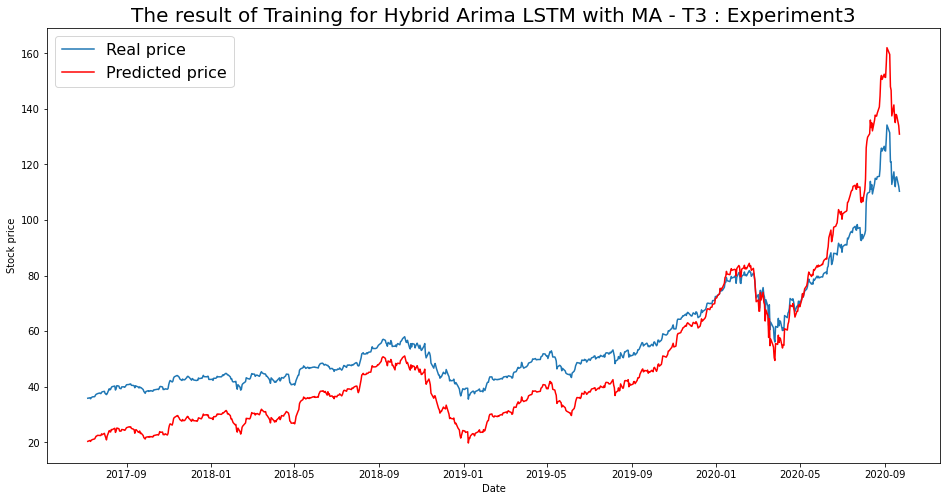

----- Train RMSE for T3 ----- 12.127978025318718
----- Train_MSE_LSTM for T3 ----- 147.0878509826137
----- Train MAE LSTM for T3 ----- 10.973312625555451


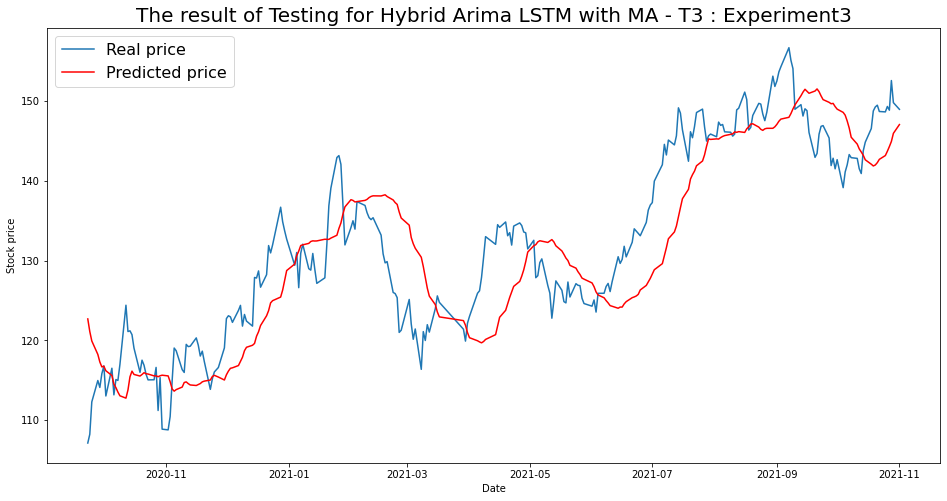

----- Test RMSE for T3----- 6.135206291200104
----- Test_MSE_LSTM for T3----- 37.64075623558134
----- Test_MAE_LSTM for T3----- 5.0145827751195515


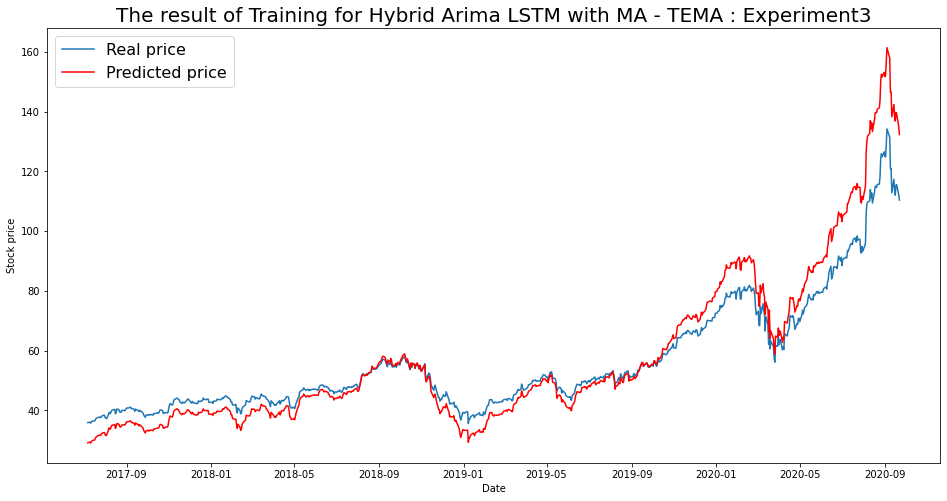

----- Train RMSE for TEMA ----- 7.4737545545252155
----- Train_MSE_LSTM for TEMA ----- 55.8570071412864
----- Train MAE LSTM for TEMA ----- 5.174422443364885


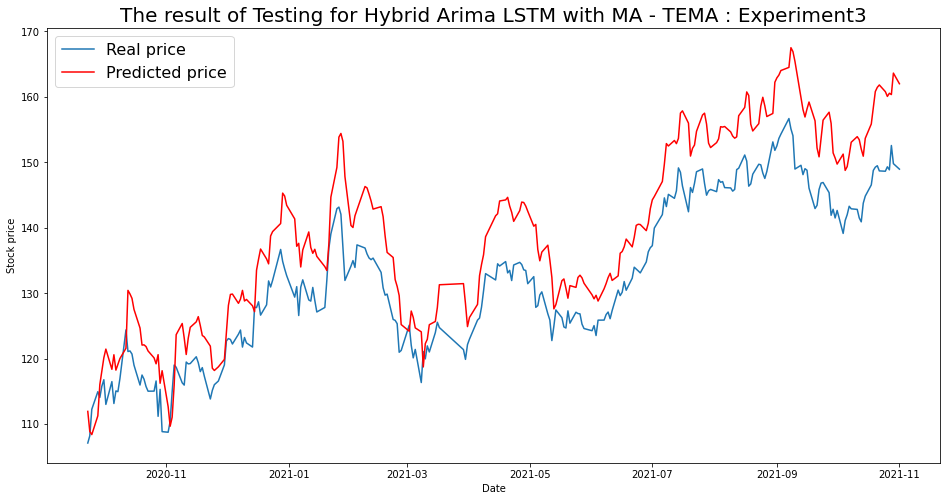

----- Test RMSE for TEMA----- 7.856451372427962
----- Test_MSE_LSTM for TEMA----- 61.72382816732521
----- Test_MAE_LSTM for TEMA----- 7.166001671992897


In [162]:
for i in range(len(list(simulation3.keys()))):
  SIM = list(simulation3.keys())[i]
  plot_train(simulation3,SIM)
  plot_test(simulation3,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 4

From  the above experiments it is evident that with Higher moving averages the loss plots show unreoresented data and underfitting, hence keeping only the MA's that have smaller periods like T3 OR TRIMA. Going forward EMA, WMA & DEMA will be ignored.

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # # Option 3
    # # define custom activation
    # # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM4.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = (y_scaler.inverse_transform(predictiontr)-det).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte =( y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.63 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.13 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.96 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=1.04 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.27 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 3.514 seconds
                               SARIMAX Results                                
Dep.

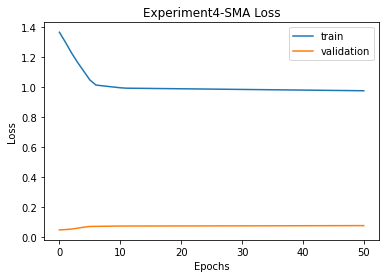


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.07 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.09 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.84 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.

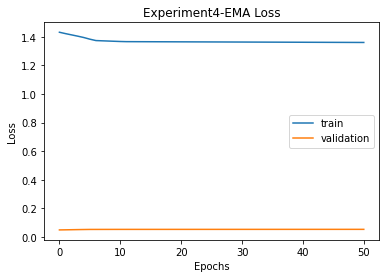


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 37.273178456615135 
RMSE:	 6.105176365725656 
MAPE:	 4.793024214680565
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.13 sec
 ARIMA(3,3,1)(0,0,0)[0

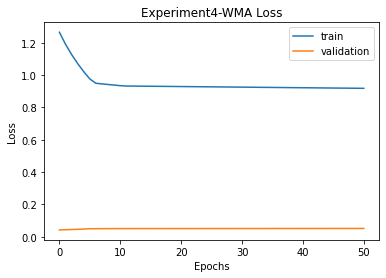


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 37.273178456615135 
RMSE:	 6.105176365725656 
MAPE:	 4.793024214680565

WMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 55.57385349960206 
RMSE:	 7.454787287347779 
MAPE:	 6.073522122630416
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC

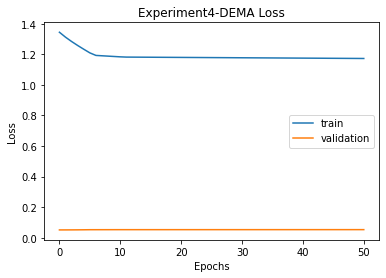


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 37.273178456615135 
RMSE:	 6.105176365725656 
MAPE:	 4.793024214680565

WMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 55.57385349960206 
RMSE:	 7.454787287347779 
MAPE:	 6.073522122630416

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 141.86028017408532 
RMSE:	 11.910511331344482 
MAPE:	 10.597824101027992
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(0,3

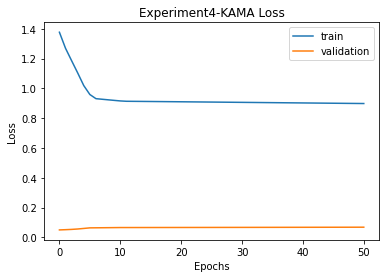


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 37.273178456615135 
RMSE:	 6.105176365725656 
MAPE:	 4.793024214680565

WMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 55.57385349960206 
RMSE:	 7.454787287347779 
MAPE:	 6.073522122630416

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 141.86028017408532 
RMSE:	 11.910511331344482 
MAPE:	 10.597824101027992

KAMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.996866158063977 
RMSE:	 4.795504786575025 
MAPE:	 3.79818199604115
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on 

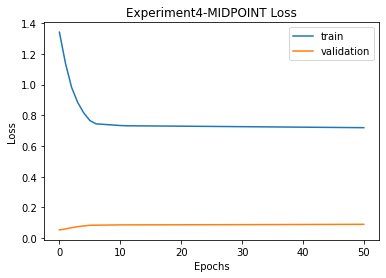


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 37.273178456615135 
RMSE:	 6.105176365725656 
MAPE:	 4.793024214680565

WMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 55.57385349960206 
RMSE:	 7.454787287347779 
MAPE:	 6.073522122630416

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 141.86028017408532 
RMSE:	 11.910511331344482 
MAPE:	 10.597824101027992

KAMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.996866158063977 
RMSE:	 4.795504786575025 
MAPE:	 3.79818199604115

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 16.742777096749265 
RMSE:	 4.091793872710265 
MAPE:	 3.2612983803063513
T3
T3([input_arrays],

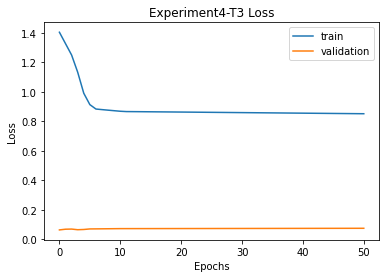


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 37.273178456615135 
RMSE:	 6.105176365725656 
MAPE:	 4.793024214680565

WMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 55.57385349960206 
RMSE:	 7.454787287347779 
MAPE:	 6.073522122630416

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 141.86028017408532 
RMSE:	 11.910511331344482 
MAPE:	 10.597824101027992

KAMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.996866158063977 
RMSE:	 4.795504786575025 
MAPE:	 3.79818199604115

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 16.742777096749265 
RMSE:	 4.091793872710265 
MAPE:	 3.2612983803063513

T3
Prediction vs Clo

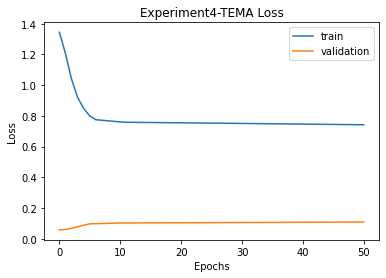


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 25.538190210858644 
RMSE:	 5.053532448778641 
MAPE:	 3.962093187177072

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 37.273178456615135 
RMSE:	 6.105176365725656 
MAPE:	 4.793024214680565

WMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 55.57385349960206 
RMSE:	 7.454787287347779 
MAPE:	 6.073522122630416

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 141.86028017408532 
RMSE:	 11.910511331344482 
MAPE:	 10.597824101027992

KAMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.996866158063977 
RMSE:	 4.795504786575025 
MAPE:	 3.79818199604115

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 16.742777096749265 
RMSE:	 4.091793872710265 
MAPE:	 3.2612983803063513

T3
Prediction vs Clo

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation4 = {}
    imgfile = 'Experiment4'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation4[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation4_data.json', 'w') as fp:
                  json.dump(simulation4, fp)

              for ma in simulation4.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation4[ma]['final']['mse'],
                        '\nRMSE:\t', simulation4[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation4[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment4.png to Experiment4 (2).png


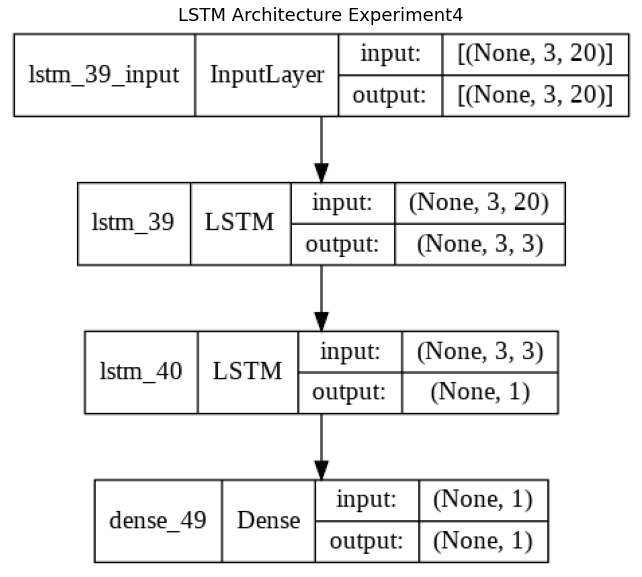

In [ ]:
img = cv2.imread('Experiment4.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [163]:
with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)
fileimg = 'Experiment4'

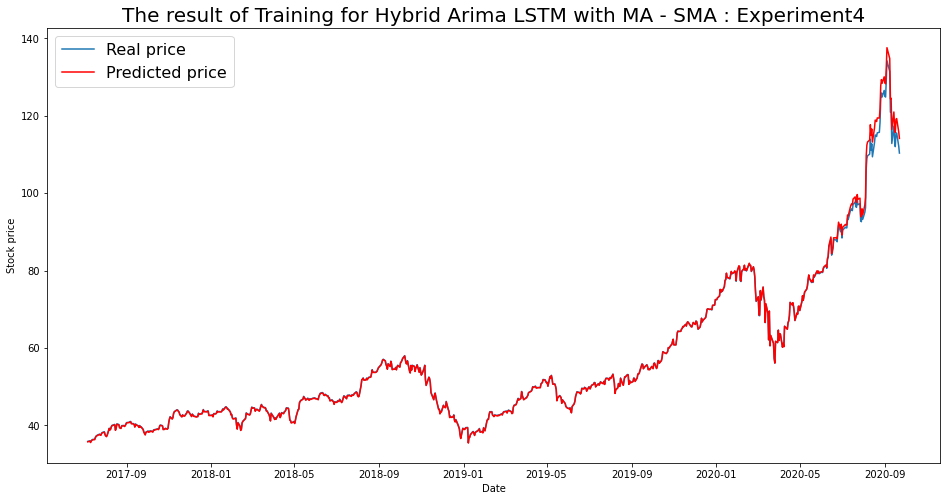

----- Train RMSE for SMA ----- 0.784831471471416
----- Train_MSE_LSTM for SMA ----- 0.615960438611988
----- Train MAE LSTM for SMA ----- 0.27441401292782014


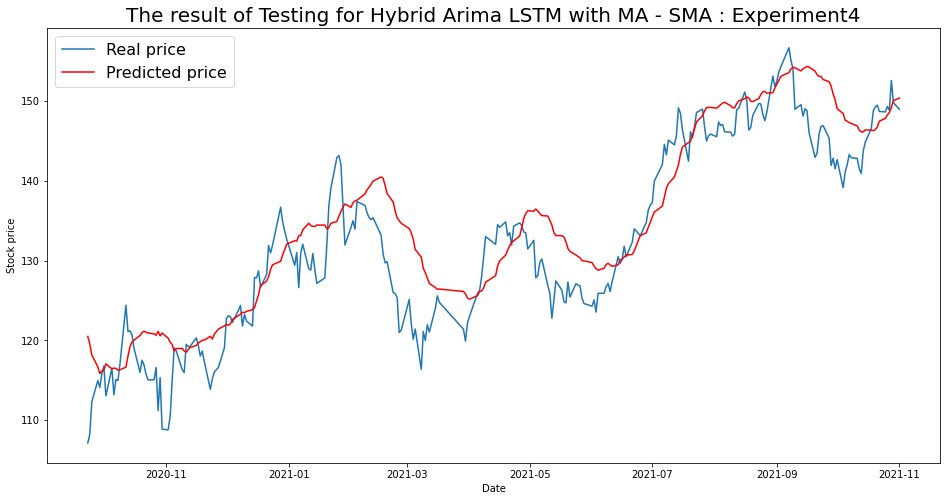

----- Test RMSE for SMA----- 5.053532448778641
----- Test_MSE_LSTM for SMA----- 25.538190210858644
----- Test_MAE_LSTM for SMA----- 3.962093187177072


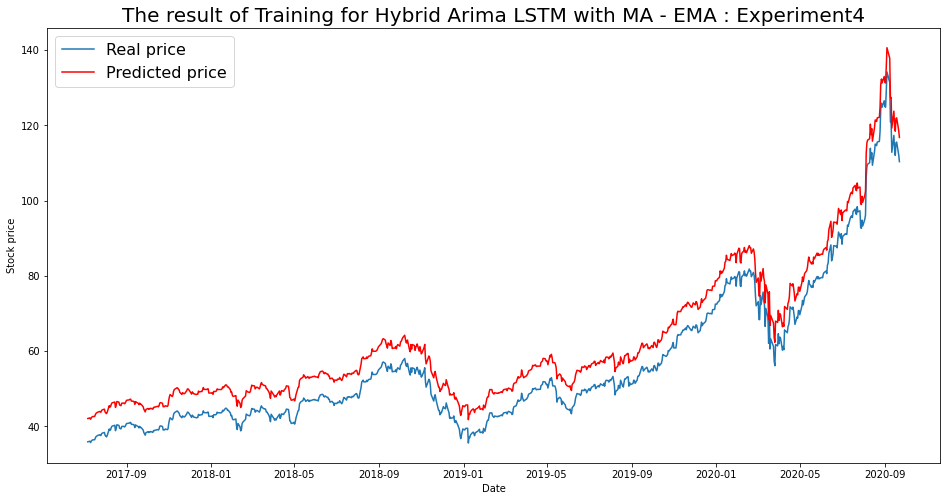

----- Train RMSE for EMA ----- 6.211147747647157
----- Train_MSE_LSTM for EMA ----- 38.57835634310235
----- Train MAE LSTM for EMA ----- 6.2109213394693805


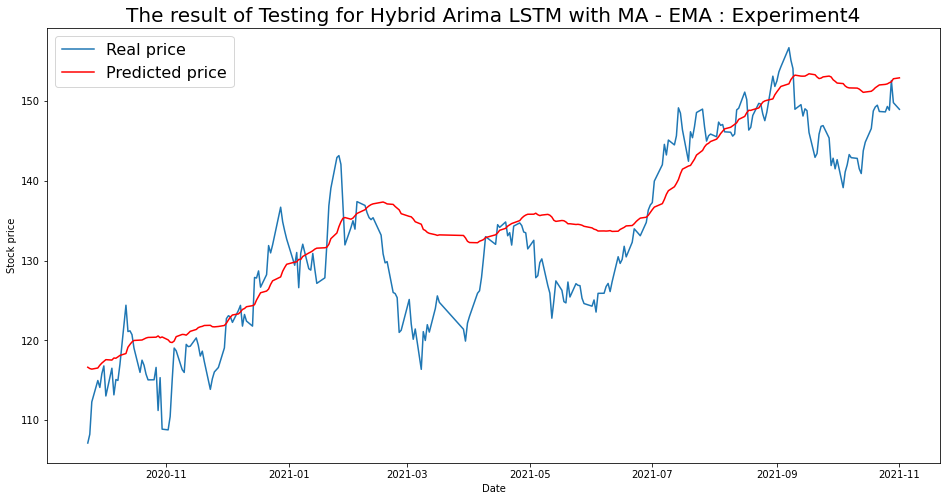

----- Test RMSE for EMA----- 6.105176365725656
----- Test_MSE_LSTM for EMA----- 37.273178456615135
----- Test_MAE_LSTM for EMA----- 4.793024214680565


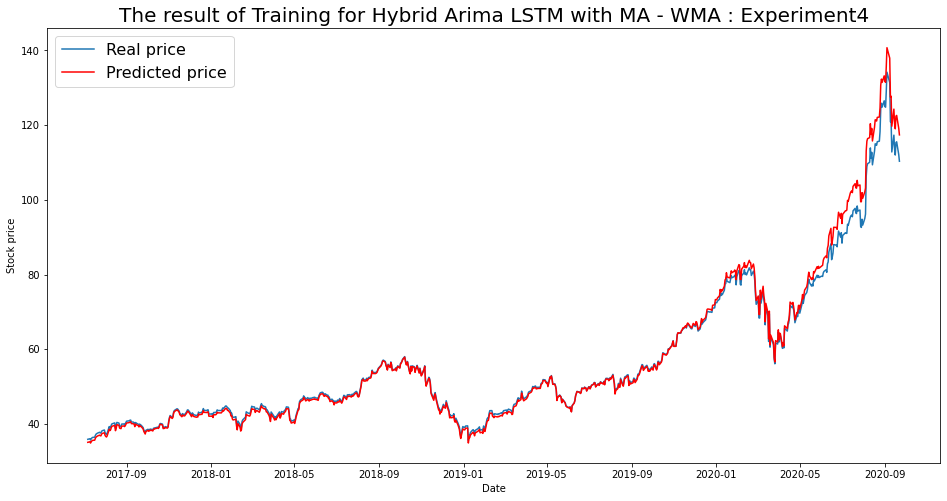

----- Train RMSE for WMA ----- 2.002139604905498
----- Train_MSE_LSTM for WMA ----- 4.0085629975311425
----- Train MAE LSTM for WMA ----- 1.0573712433918867


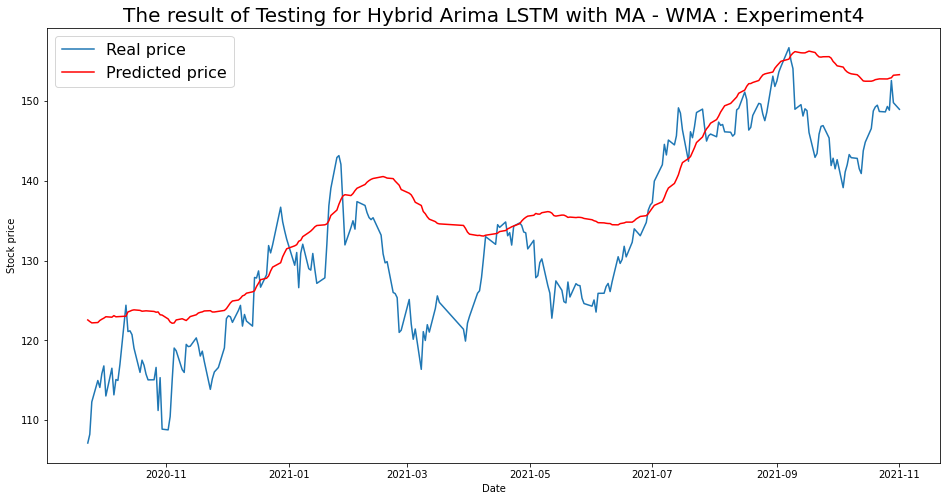

----- Test RMSE for WMA----- 7.454787287347779
----- Test_MSE_LSTM for WMA----- 55.57385349960206
----- Test_MAE_LSTM for WMA----- 6.073522122630416


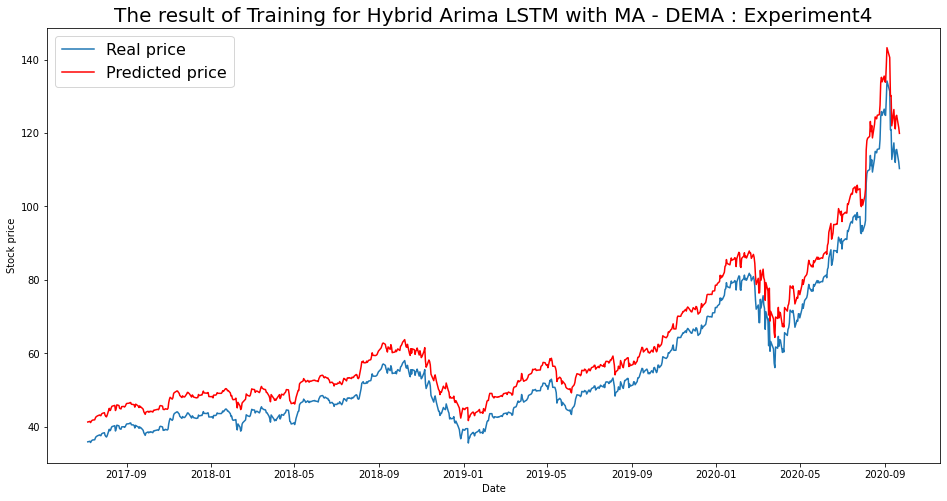

----- Train RMSE for DEMA ----- 6.0909201621097
----- Train_MSE_LSTM for DEMA ----- 37.099308421194465
----- Train MAE LSTM for DEMA ----- 6.026646866656766


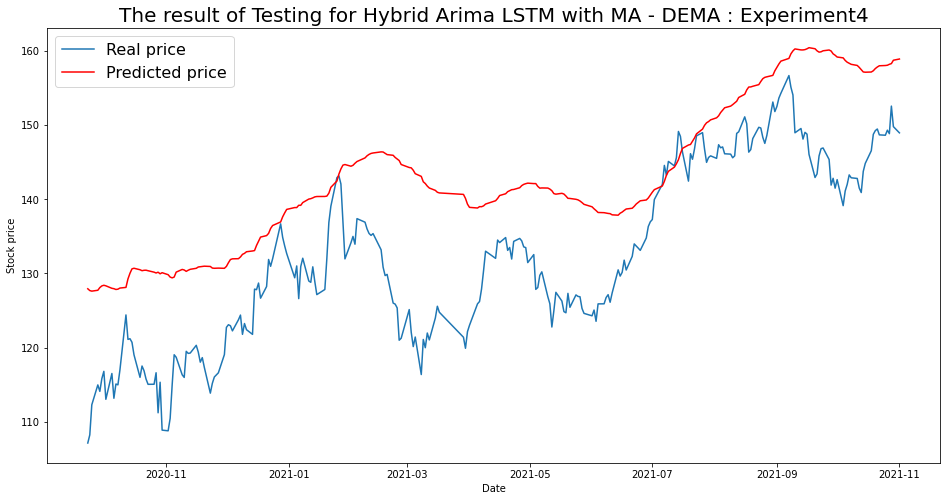

----- Test RMSE for DEMA----- 11.910511331344482
----- Test_MSE_LSTM for DEMA----- 141.86028017408532
----- Test_MAE_LSTM for DEMA----- 10.597824101027992


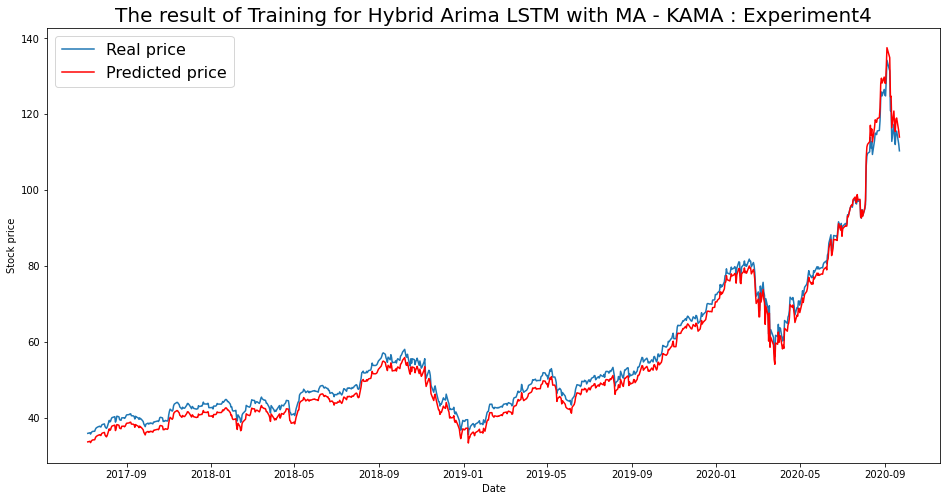

----- Train RMSE for KAMA ----- 2.1585215730508303
----- Train_MSE_LSTM for KAMA ----- 4.65921538132583
----- Train MAE LSTM for KAMA ----- 2.1121947434869144


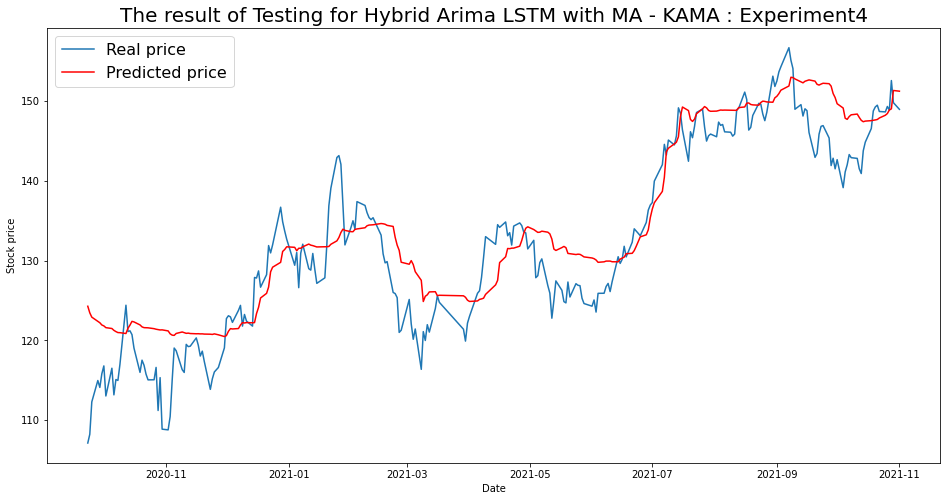

----- Test RMSE for KAMA----- 4.795504786575025
----- Test_MSE_LSTM for KAMA----- 22.996866158063977
----- Test_MAE_LSTM for KAMA----- 3.79818199604115


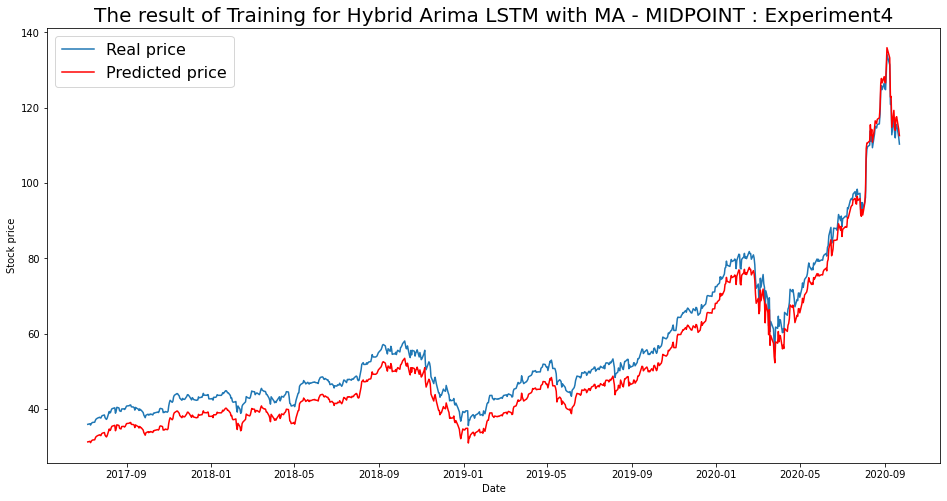

----- Train RMSE for MIDPOINT ----- 4.3843958002580745
----- Train_MSE_LSTM for MIDPOINT ----- 19.222926533320642
----- Train MAE LSTM for MIDPOINT ----- 4.316875709165441


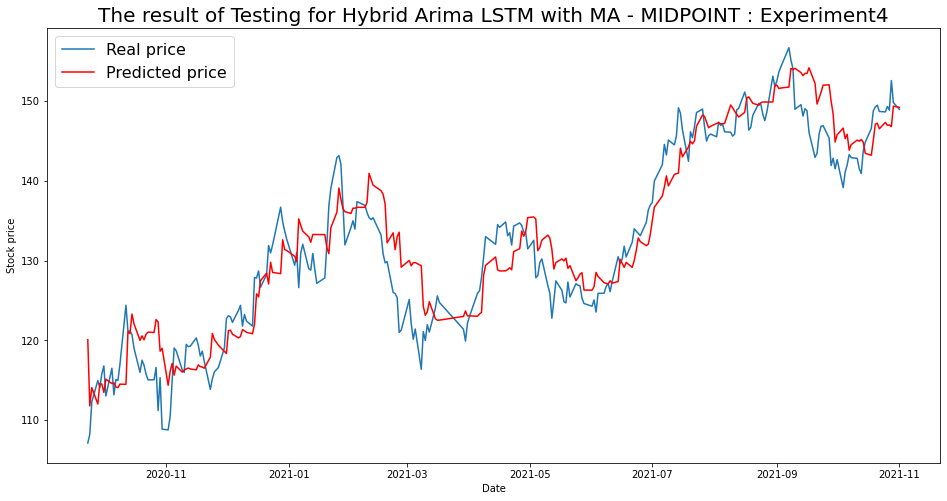

----- Test RMSE for MIDPOINT----- 4.091793872710265
----- Test_MSE_LSTM for MIDPOINT----- 16.742777096749265
----- Test_MAE_LSTM for MIDPOINT----- 3.2612983803063513


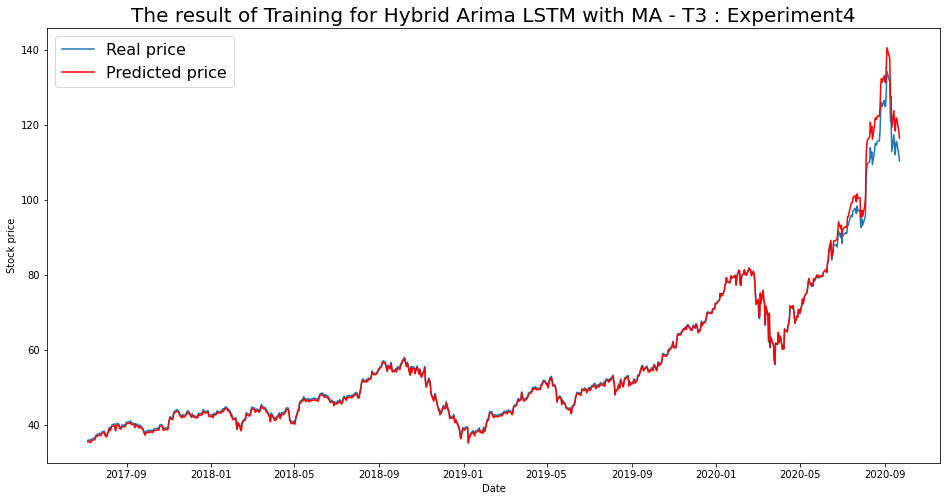

----- Train RMSE for T3 ----- 1.472725970486685
----- Train_MSE_LSTM for T3 ----- 2.1689217841459487
----- Train MAE LSTM for T3 ----- 0.6889241237451534


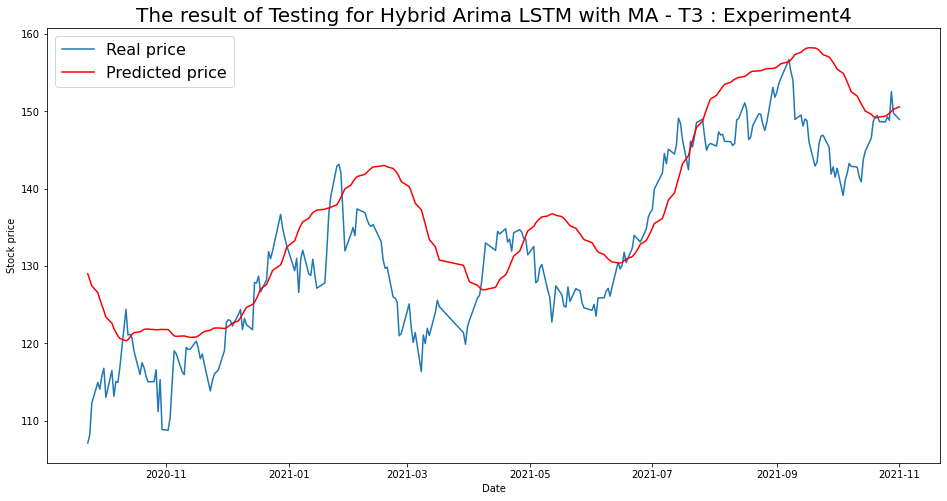

----- Test RMSE for T3----- 7.788120756826606
----- Test_MSE_LSTM for T3----- 60.65482492291343
----- Test_MAE_LSTM for T3----- 6.228183408991355


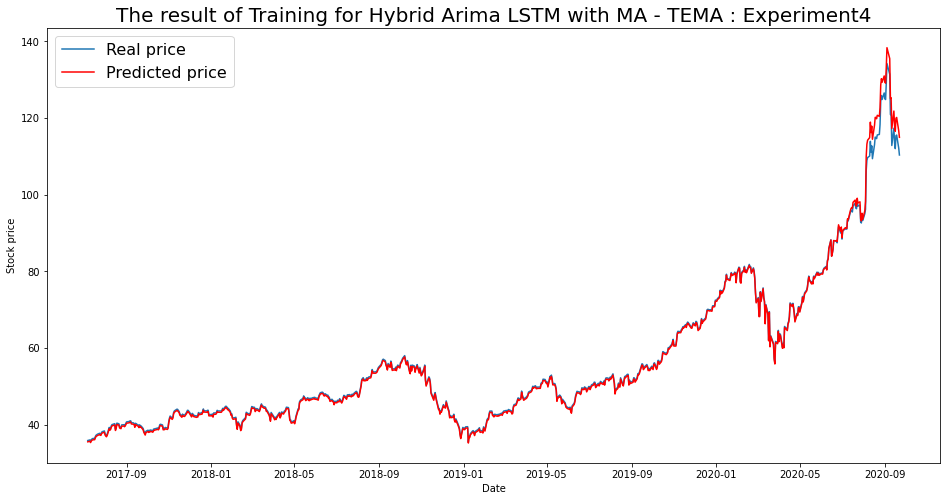

----- Train RMSE for TEMA ----- 1.001048964655797
----- Train_MSE_LSTM for TEMA ----- 1.002099029638443
----- Train MAE LSTM for TEMA ----- 0.5068751042432124


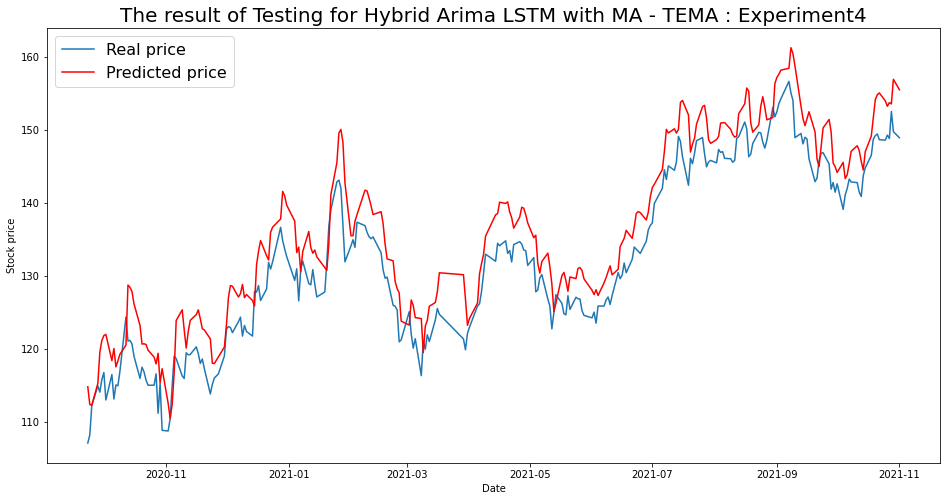

----- Test RMSE for TEMA----- 4.733500926626645
----- Test_MSE_LSTM for TEMA----- 22.406031022375306
----- Test_MAE_LSTM for TEMA----- 4.170481392757424


In [164]:
for i in range(len(list(simulation4.keys()))):
  SIM = list(simulation4.keys())[i]
  plot_train(simulation4,SIM)
  plot_test(simulation4,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 5

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15057.252, Time=5.23 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13616.841, Time=2.94 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15177.809, Time=11.07 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14725.568, Time=11.58 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15511.840, Time=16.61 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-15663.563, Time=17.81 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=-15093.498, Time=7.72 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15194.504, Time=11.11 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=-14885.340, Time=20.76 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 104.854 seconds
                               SARIMA

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.09855, saving model to LSTM5.h5
48/48 - 3s - loss: 0.3499 - val_loss: 0.0985 - lr: 0.0010 - 3s/epoch - 53ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.09855
48/48 - 1s - loss: 0.1193 - val_loss: 0.9455 - lr: 0.0010 - 605ms/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.09855
48/48 - 1s - loss: 0.1690 - val_loss: 0.5143 - lr: 0.0010 - 596ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.09855
48/48 - 1s - loss: 0.0709 - val_loss: 0.4796 - lr: 0.0010 - 637ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.09855
48/48 - 1s - loss: 0.0580 - val_loss: 0.1613 - lr: 0.0010 - 629ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.09855 to 0.00964, saving model to LSTM5.h5
48/48 - 1s - loss: 0.0543 - val_loss: 0.0096 - lr: 0.0010 - 656ms/epoch - 14ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.0

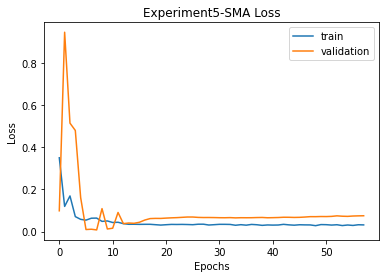


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.807, Time=3.40 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.11 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15585.734, Time=9.61 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14574.593, Time=7.79 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15458.426, Time=11.39 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15621.247, Time=13.82 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17231.605, Time=21.73 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14570.593, Time=10.25 sec
 ARIMA(1,3,3)(0,0,

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.09288, saving model to LSTM5.h5
16/16 - 2s - loss: 0.6781 - val_loss: 0.0929 - lr: 0.0010 - 2s/epoch - 135ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.09288
16/16 - 0s - loss: 0.1891 - val_loss: 0.3751 - lr: 0.0010 - 241ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.09288
16/16 - 0s - loss: 0.0797 - val_loss: 0.2141 - lr: 0.0010 - 237ms/epoch - 15ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.09288 to 0.00951, saving model to LSTM5.h5
16/16 - 0s - loss: 0.0587 - val_loss: 0.0095 - lr: 0.0010 - 245ms/epoch - 15ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.00951 to 0.00796, saving model to LSTM5.h5
16/16 - 0s - loss: 0.0464 - val_loss: 0.0080 - lr: 0.0010 - 251ms/epoch - 16ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.00796
16/16 - 0s - loss: 0.0495 - val_loss: 0.0137 - lr: 0.0010 - 215ms/epoch - 13ms/step
Epoch 7/500

Epoch 00007: va

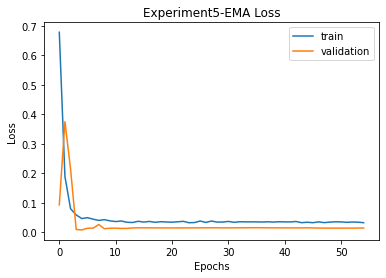


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 55.80809642994332 
RMSE:	 7.470481673221836 
MAPE:	 6.155377787606487
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15462.744, Time=15.09 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13144.103, Time=2.97 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16179.868, Time=7.21 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14670.350, Time=14.74 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15643.233, Time=21.32 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15673.437, Time=18.04 s

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.02747, saving model to LSTM5.h5
17/17 - 2s - loss: 0.6197 - val_loss: 0.0275 - lr: 0.0010 - 2s/epoch - 127ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.1453 - val_loss: 0.1472 - lr: 0.0010 - 231ms/epoch - 14ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0795 - val_loss: 0.5646 - lr: 0.0010 - 240ms/epoch - 14ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0568 - val_loss: 0.0331 - lr: 0.0010 - 230ms/epoch - 14ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0417 - val_loss: 0.2752 - lr: 0.0010 - 267ms/epoch - 16ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0361 - val_loss: 0.1259 - lr: 0.0010 - 235ms/epoch - 14ms/step
Epoch 

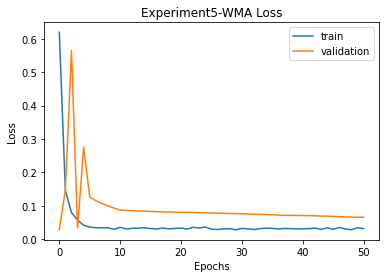


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 55.80809642994332 
RMSE:	 7.470481673221836 
MAPE:	 6.155377787606487

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 29.732679793069057 
RMSE:	 5.452768085391956 
MAPE:	 4.481765047502752
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.773, Time=3.46 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.09 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16293.727, Time=8.60 sec
 ARIMA(0,3,1)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17005.977, Time=3.84 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17000.665, Time=4.75 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 104.458 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Sun, 12 Dec 2021   AIC                         -17089.440
Time:                        20:22:27   BIC                         -16972.169
Sample:                             0   HQIC                        -17044.403
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.23110, saving model to LSTM5.h5
10/10 - 2s - loss: 0.2732 - val_loss: 0.2311 - lr: 0.0010 - 2s/epoch - 205ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.23110
10/10 - 0s - loss: 0.1170 - val_loss: 0.5030 - lr: 0.0010 - 151ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.23110 to 0.07328, saving model to LSTM5.h5
10/10 - 0s - loss: 0.1450 - val_loss: 0.0733 - lr: 0.0010 - 178ms/epoch - 18ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.07328 to 0.03480, saving model to LSTM5.h5
10/10 - 0s - loss: 0.1125 - val_loss: 0.0348 - lr: 0.0010 - 208ms/epoch - 21ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.03480 to 0.03006, saving model to LSTM5.h5
10/10 - 0s - loss: 0.1034 - val_loss: 0.0301 - lr: 0.0010 - 183ms/epoch - 18ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.03006 to 0.01055, saving model to LSTM5.h5
10/10 - 0s - loss: 0.0709 - val_loss: 0.0105 - lr: 0

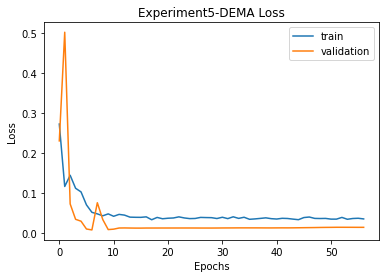


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 55.80809642994332 
RMSE:	 7.470481673221836 
MAPE:	 6.155377787606487

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 29.732679793069057 
RMSE:	 5.452768085391956 
MAPE:	 4.481765047502752

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 217.77293515692304 
RMSE:	 14.757131671057321 
MAPE:	 12.98122268289883
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.733, Time=3.41 sec
 ARI

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.05525, saving model to LSTM5.h5
45/45 - 2s - loss: 0.3542 - val_loss: 0.0553 - lr: 0.0010 - 2s/epoch - 55ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.05525
45/45 - 1s - loss: 0.1076 - val_loss: 0.5800 - lr: 0.0010 - 594ms/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.05525
45/45 - 1s - loss: 0.0674 - val_loss: 0.3613 - lr: 0.0010 - 524ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.05525
45/45 - 1s - loss: 0.0581 - val_loss: 0.0805 - lr: 0.0010 - 598ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.05525 to 0.00993, saving model to LSTM5.h5
45/45 - 1s - loss: 0.0501 - val_loss: 0.0099 - lr: 0.0010 - 587ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.00993
45/45 - 1s - loss: 0.0469 - val_loss: 0.0373 - lr: 0.0010 - 554ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.0

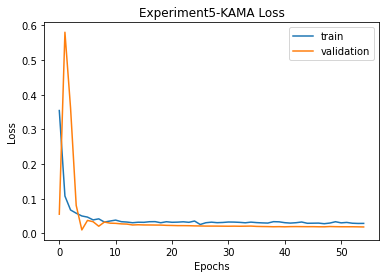


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 55.80809642994332 
RMSE:	 7.470481673221836 
MAPE:	 6.155377787606487

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 29.732679793069057 
RMSE:	 5.452768085391956 
MAPE:	 4.481765047502752

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 217.77293515692304 
RMSE:	 14.757131671057321 
MAPE:	 12.98122268289883

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 41.92542421552212 
RMSE:	 6.474984495388551 
MAPE:	 5.290774580380154
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on 

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03218, saving model to LSTM5.h5
58/58 - 3s - loss: 0.1718 - val_loss: 0.0322 - lr: 0.0010 - 3s/epoch - 45ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.03218 to 0.02423, saving model to LSTM5.h5
58/58 - 1s - loss: 0.1881 - val_loss: 0.0242 - lr: 0.0010 - 750ms/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02423
58/58 - 1s - loss: 0.0780 - val_loss: 1.0303 - lr: 0.0010 - 740ms/epoch - 13ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02423
58/58 - 1s - loss: 0.0542 - val_loss: 0.1516 - lr: 0.0010 - 709ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02423
58/58 - 1s - loss: 0.0474 - val_loss: 0.2665 - lr: 0.0010 - 750ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.02423
58/58 - 1s - loss: 0.0477 - val_loss: 0.1055 - lr: 0.0010 - 729ms/epoch - 13ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learni

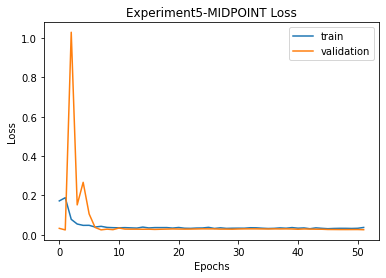


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 55.80809642994332 
RMSE:	 7.470481673221836 
MAPE:	 6.155377787606487

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 29.732679793069057 
RMSE:	 5.452768085391956 
MAPE:	 4.481765047502752

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 217.77293515692304 
RMSE:	 14.757131671057321 
MAPE:	 12.98122268289883

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 41.92542421552212 
RMSE:	 6.474984495388551 
MAPE:	 5.290774580380154

MIDPOINT
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 49.176657562881935 
RMSE:	 7.012607044664768 
MAPE:	 5.71406626958764
T3
T3([input_arrays], [

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17006.024, Time=4.12 sec
 ARIMA(3,3,3)(0,0,0)[0]             : AIC=-14720.521, Time=13.46 sec
 ARIMA(2,3,3)(0,0,0)[0]             : AIC=-16599.516, Time=14.80 sec
 ARIMA(3,3,2)(0,0,0)[0] intercept   : AIC=-13110.324, Time=18.60 sec

Best model:  ARIMA(3,3,2)(0,0,0)[0]          
Total fit time: 123.835 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 2)   Log Likelihood                8700.998
Date:                Sun, 12 Dec 2021   AIC                         -17349.997
Time:                        20:55:01   BIC                         -17228.035
Sample:                             0   HQIC                        -17303.158
                                - 808                                         
Covariance Type:                  opg                                         
              

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03428, saving model to LSTM5.h5
43/43 - 3s - loss: 0.3077 - val_loss: 0.0343 - lr: 0.0010 - 3s/epoch - 64ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.03428
43/43 - 1s - loss: 0.0935 - val_loss: 0.4037 - lr: 0.0010 - 581ms/epoch - 14ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03428
43/43 - 1s - loss: 0.0542 - val_loss: 0.2713 - lr: 0.0010 - 572ms/epoch - 13ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03428
43/43 - 1s - loss: 0.0455 - val_loss: 0.0906 - lr: 0.0010 - 555ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03428
43/43 - 1s - loss: 0.0431 - val_loss: 0.0394 - lr: 0.0010 - 575ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.03428 to 0.03000, saving model to LSTM5.h5
43/43 - 1s - loss: 0.0375 - val_loss: 0.0300 - lr: 0.0010 - 575ms/epoch - 13ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.0

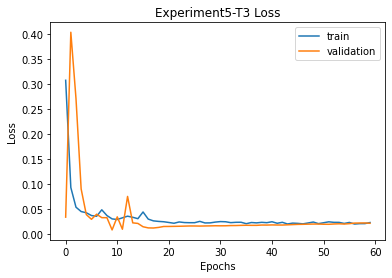


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 55.80809642994332 
RMSE:	 7.470481673221836 
MAPE:	 6.155377787606487

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 29.732679793069057 
RMSE:	 5.452768085391956 
MAPE:	 4.481765047502752

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 217.77293515692304 
RMSE:	 14.757131671057321 
MAPE:	 12.98122268289883

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 41.92542421552212 
RMSE:	 6.474984495388551 
MAPE:	 5.290774580380154

MIDPOINT
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 49.176657562881935 
RMSE:	 7.012607044664768 
MAPE:	 5.71406626958764

T3
Prediction vs Close

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03169, saving model to LSTM5.h5
90/90 - 3s - loss: 0.1177 - val_loss: 0.0317 - lr: 0.0010 - 3s/epoch - 36ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.03169
90/90 - 1s - loss: 0.0777 - val_loss: 0.5584 - lr: 0.0010 - 1s/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03169
90/90 - 1s - loss: 0.0567 - val_loss: 0.0987 - lr: 0.0010 - 1s/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03169
90/90 - 1s - loss: 0.0722 - val_loss: 0.0377 - lr: 0.0010 - 1s/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03169
90/90 - 1s - loss: 0.0542 - val_loss: 0.4369 - lr: 0.0010 - 1s/epoch - 13ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.03169
90/90 - 1s - loss: 0.0382 - val_loss: 0.1058 - lr: 0.0010 - 1s/epoch - 12ms/step
Epoch 7/500

Epoch 000

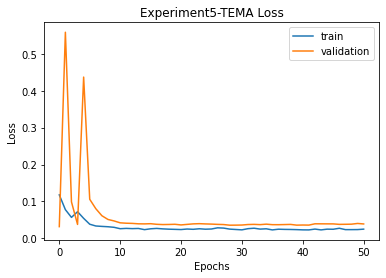


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 218.84742268028705 
RMSE:	 14.79349257884314 
MAPE:	 12.049823582857737

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 55.80809642994332 
RMSE:	 7.470481673221836 
MAPE:	 6.155377787606487

WMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 29.732679793069057 
RMSE:	 5.452768085391956 
MAPE:	 4.481765047502752

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 217.77293515692304 
RMSE:	 14.757131671057321 
MAPE:	 12.98122268289883

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 41.92542421552212 
RMSE:	 6.474984495388551 
MAPE:	 5.290774580380154

MIDPOINT
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 49.176657562881935 
RMSE:	 7.012607044664768 
MAPE:	 5.71406626958764

T3
Prediction vs Close

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation5 = {}
    imgfile = 'Experiment5'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation5[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation5_data.json', 'w') as fp:
                    json.dump(simulation5, fp)

                for ma in simulation5.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation5[ma]['final']['mse'],
                          '\nRMSE:\t', simulation5[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation5[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/3600)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment5.png to Experiment5 (3).png


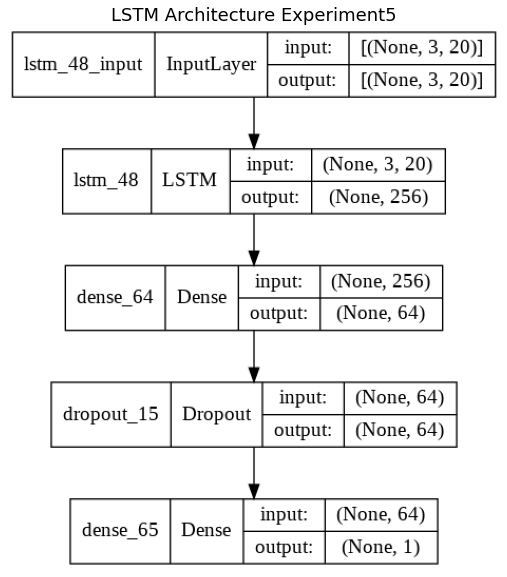

In [ ]:
img = cv2.imread('Experiment6.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [165]:
with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)
fileimg = 'Experiment5'

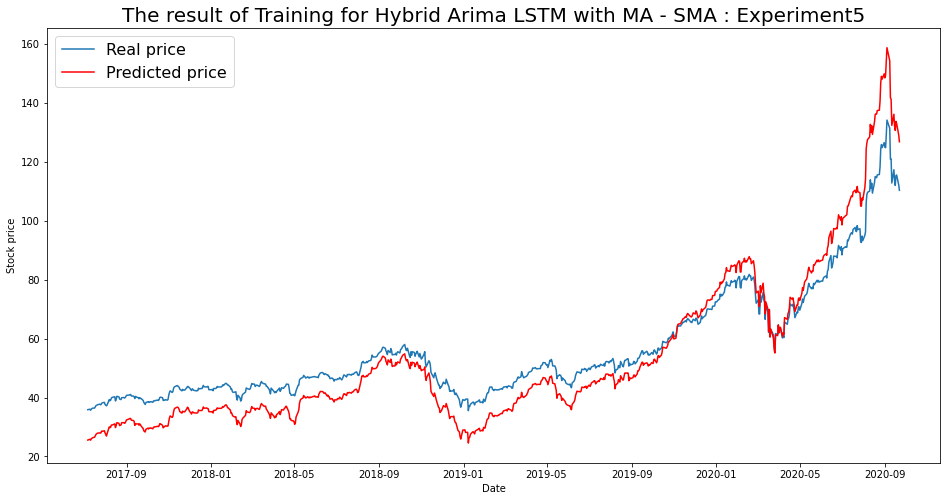

----- Train RMSE for SMA ----- 7.987564473981076
----- Train_MSE_LSTM for SMA ----- 63.801186226004575
----- Train MAE LSTM for SMA ----- 6.937391257458735


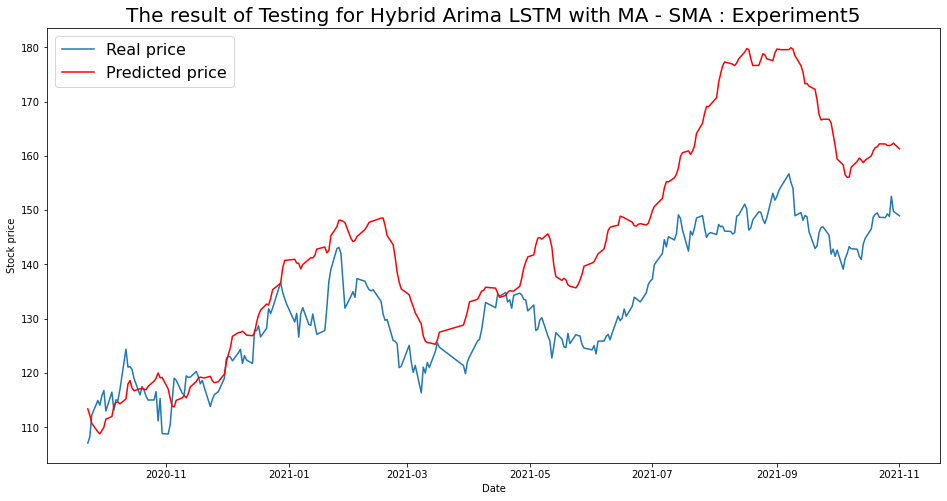

----- Test RMSE for SMA----- 14.79349257884314
----- Test_MSE_LSTM for SMA----- 218.84742268028705
----- Test_MAE_LSTM for SMA----- 12.049823582857737


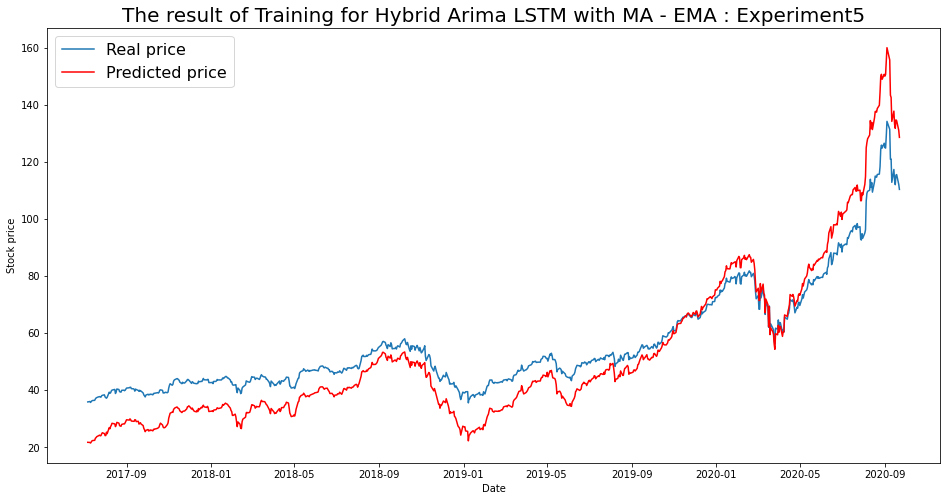

----- Train RMSE for EMA ----- 9.285313379771722
----- Train_MSE_LSTM for EMA ----- 86.21704456056776
----- Train MAE LSTM for EMA ----- 8.068863589743078


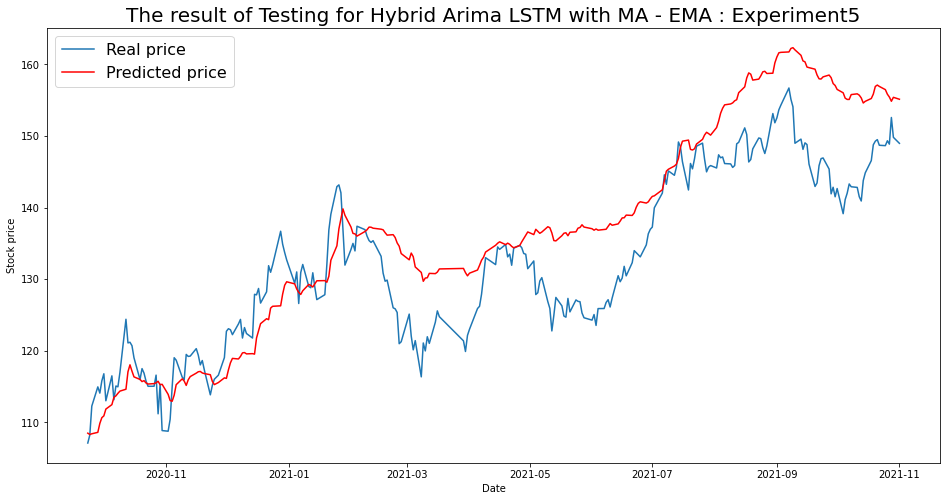

----- Test RMSE for EMA----- 7.470481673221836
----- Test_MSE_LSTM for EMA----- 55.80809642994332
----- Test_MAE_LSTM for EMA----- 6.155377787606487


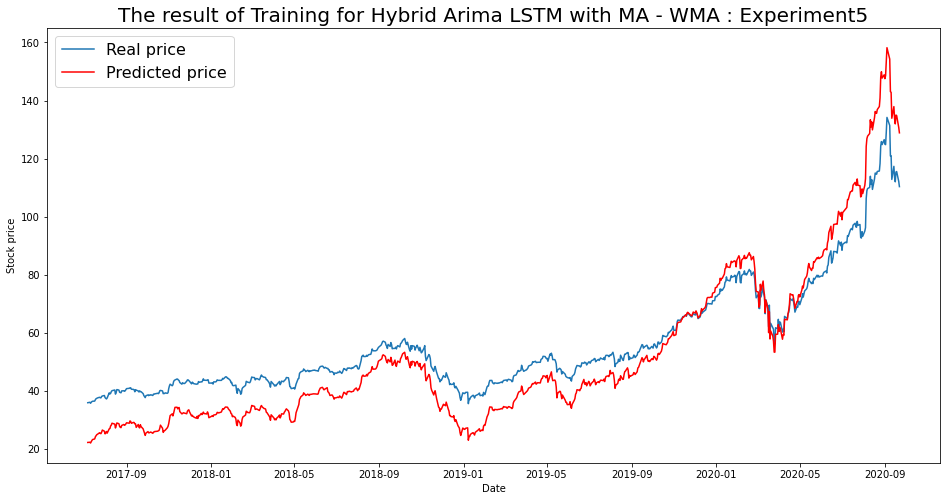

----- Train RMSE for WMA ----- 9.513866242248712
----- Train_MSE_LSTM for WMA ----- 90.51365087539962
----- Train MAE LSTM for WMA ----- 8.427476138172159


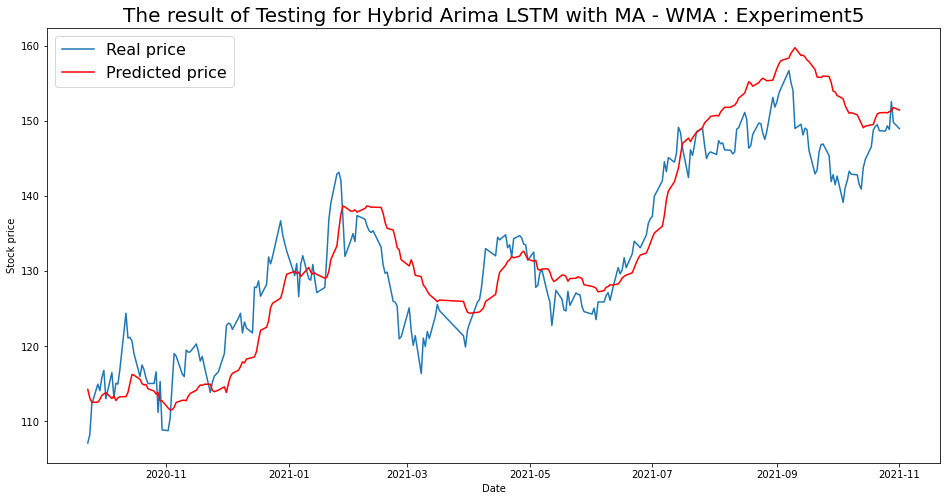

----- Test RMSE for WMA----- 5.452768085391956
----- Test_MSE_LSTM for WMA----- 29.732679793069057
----- Test_MAE_LSTM for WMA----- 4.481765047502752


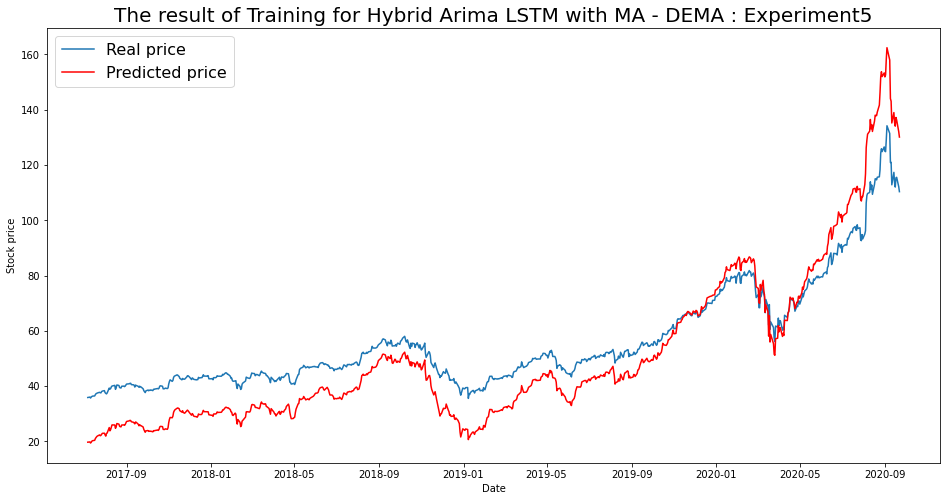

----- Train RMSE for DEMA ----- 10.930836950788706
----- Train_MSE_LSTM for DEMA ----- 119.48319644472774
----- Train MAE LSTM for DEMA ----- 9.670853995935332


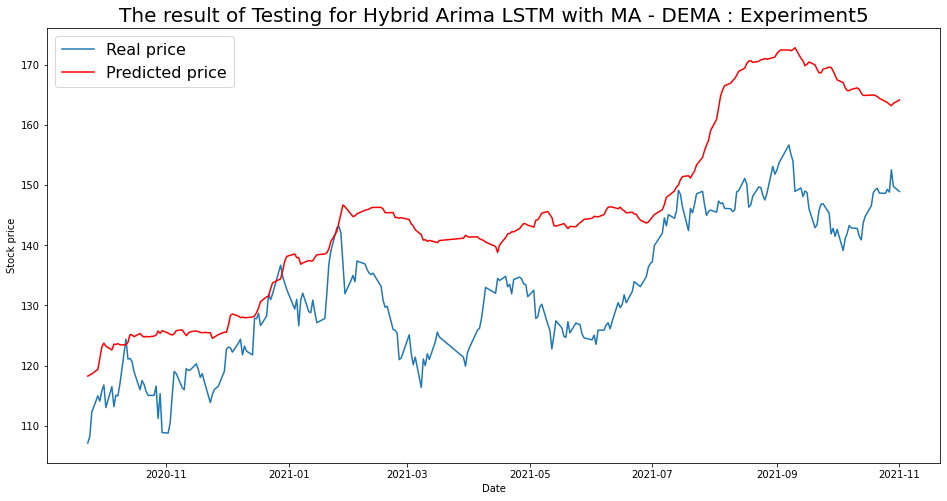

----- Test RMSE for DEMA----- 14.757131671057321
----- Test_MSE_LSTM for DEMA----- 217.77293515692304
----- Test_MAE_LSTM for DEMA----- 12.98122268289883


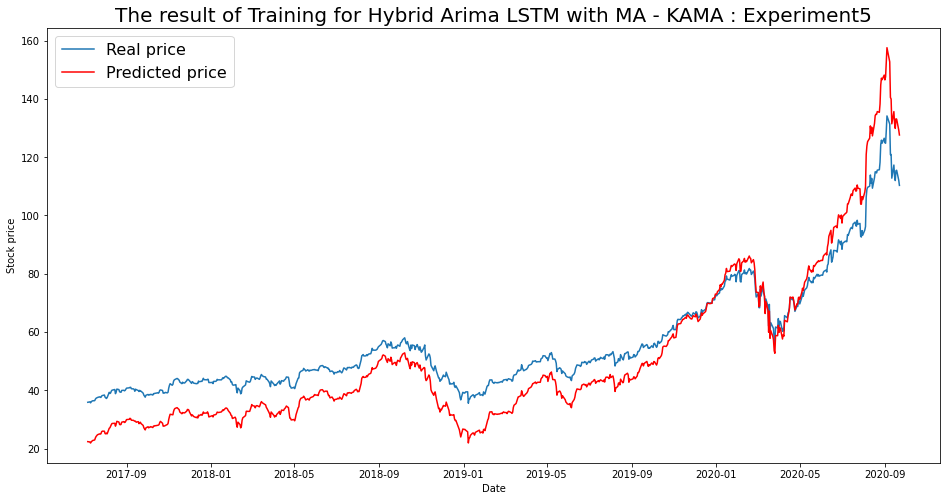

----- Train RMSE for KAMA ----- 9.334973586327665
----- Train_MSE_LSTM for KAMA ----- 87.14173185743519
----- Train MAE LSTM for KAMA ----- 8.362587355349287


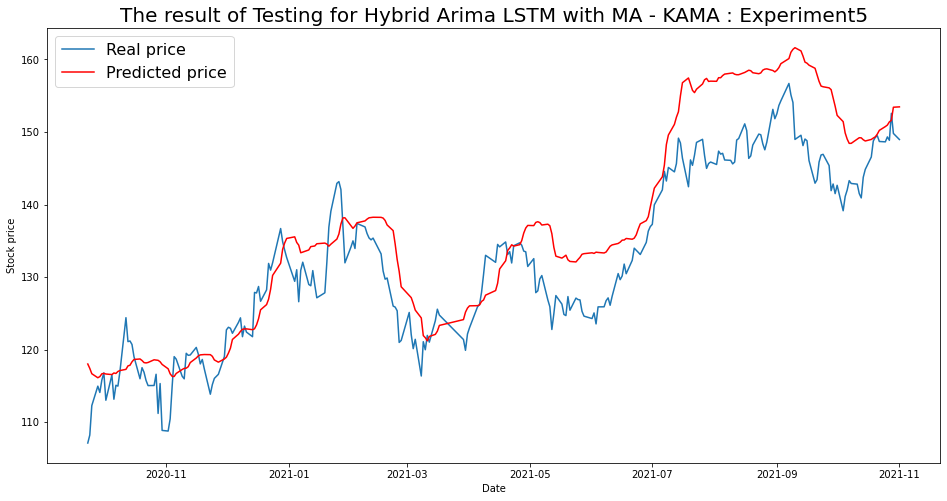

----- Test RMSE for KAMA----- 6.474984495388551
----- Test_MSE_LSTM for KAMA----- 41.92542421552212
----- Test_MAE_LSTM for KAMA----- 5.290774580380154


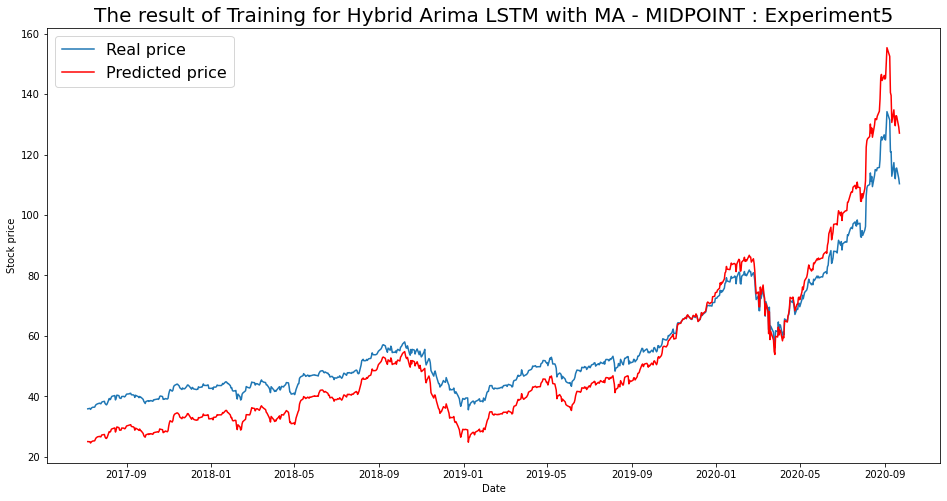

----- Train RMSE for MIDPOINT ----- 8.34973583868917
----- Train_MSE_LSTM for MIDPOINT ----- 69.71808857589033
----- Train MAE LSTM for MIDPOINT ----- 7.404580064337196


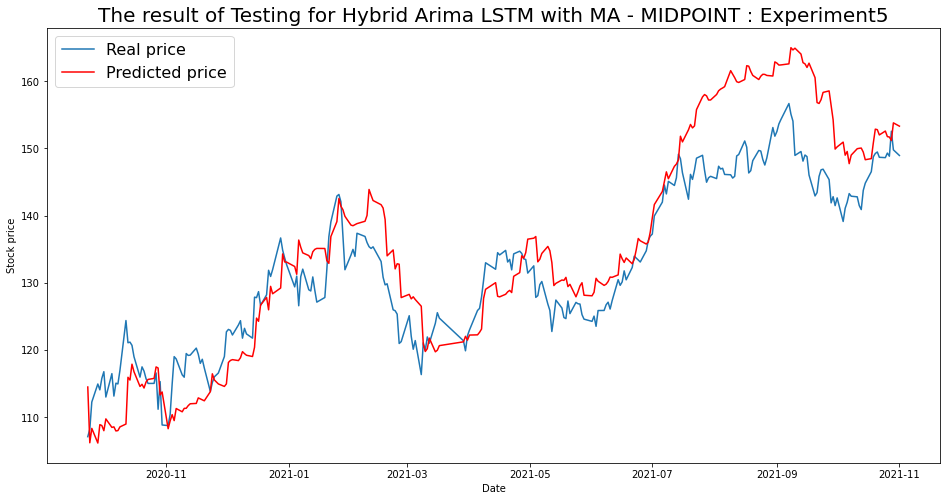

----- Test RMSE for MIDPOINT----- 7.012607044664768
----- Test_MSE_LSTM for MIDPOINT----- 49.176657562881935
----- Test_MAE_LSTM for MIDPOINT----- 5.71406626958764


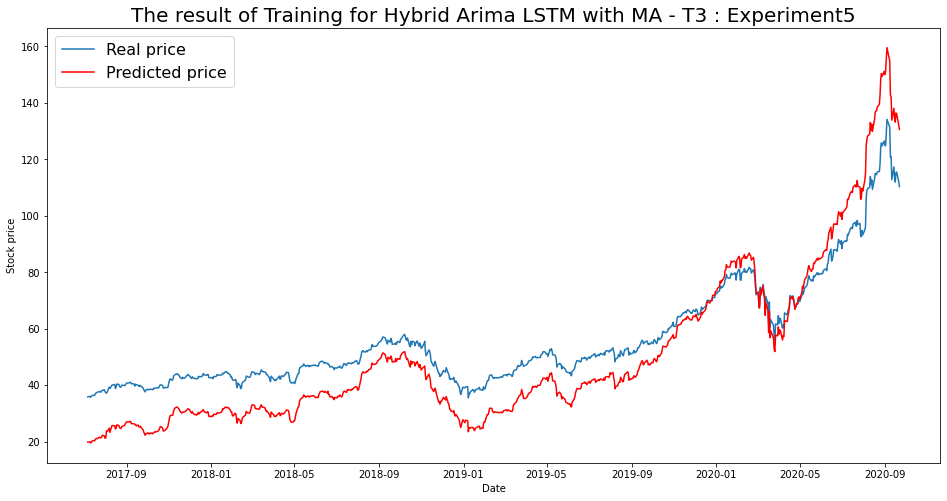

----- Train RMSE for T3 ----- 10.977729013572553
----- Train_MSE_LSTM for T3 ----- 120.51053429543263
----- Train MAE LSTM for T3 ----- 9.880825724747806


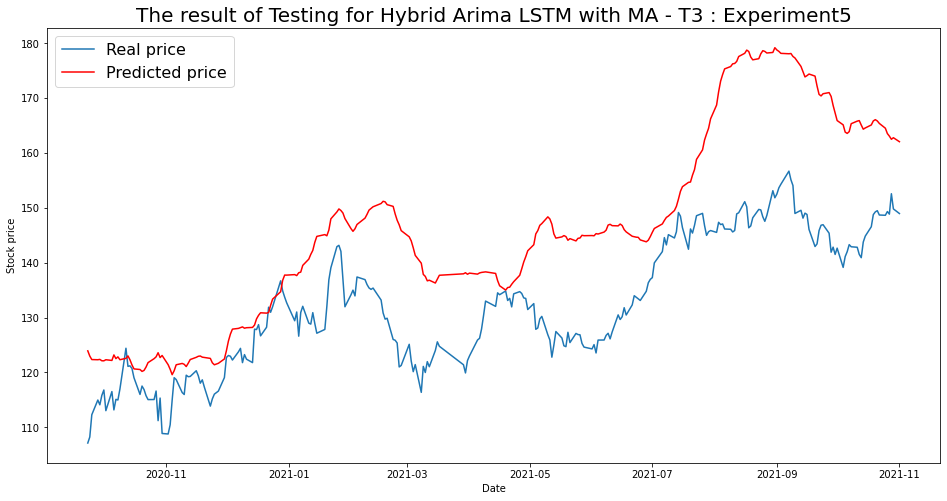

----- Test RMSE for T3----- 16.359580983596892
----- Test_MSE_LSTM for T3----- 267.63588995886505
----- Test_MAE_LSTM for T3----- 13.903459389418241


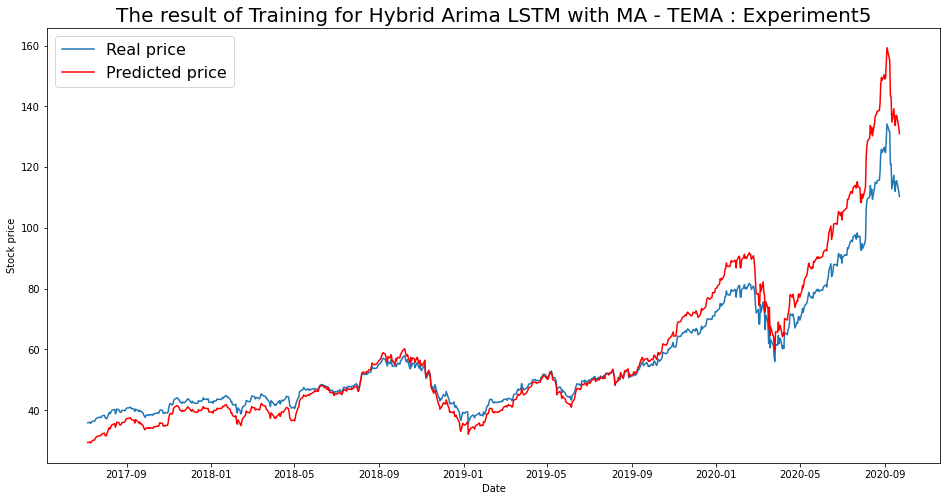

----- Train RMSE for TEMA ----- 6.910268535796713
----- Train_MSE_LSTM for TEMA ----- 47.75181123682204
----- Train MAE LSTM for TEMA ----- 4.726986691457281


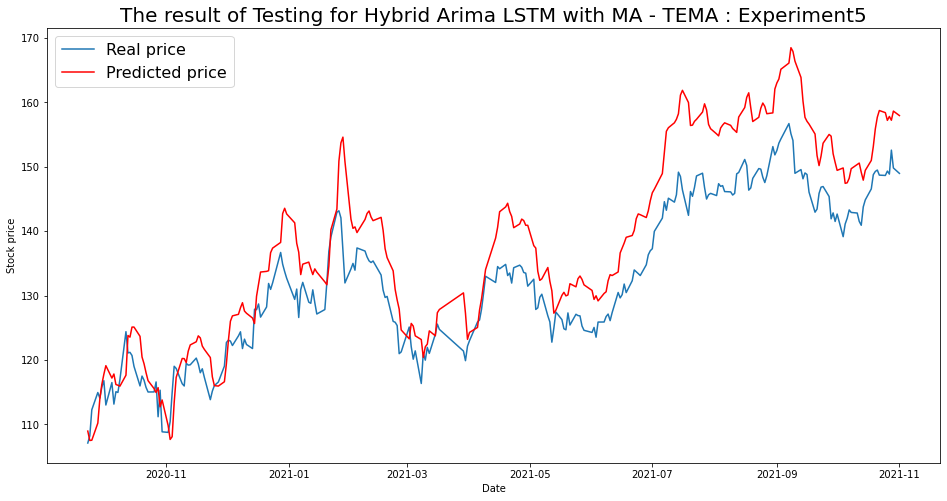

----- Test RMSE for TEMA----- 7.362060379565179
----- Test_MSE_LSTM for TEMA----- 54.19993303236338
----- Test_MAE_LSTM for TEMA----- 6.351731050288764


In [166]:
for i in range(len(list(simulation5.keys()))):
  SIM = list(simulation5.keys())[i]
  plot_train(simulation5,SIM)
  plot_test(simulation5,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 6

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM6.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15057.252, Time=5.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13616.841, Time=2.92 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15177.809, Time=11.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14725.568, Time=12.12 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15511.840, Time=16.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-15663.563, Time=16.95 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=-15093.498, Time=7.98 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15194.504, Time=11.90 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=-14885.340, Time=20.98 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 105.406 seconds
                               SARIMA

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.04653, saving model to LSTM6.h5
48/48 - 5s - loss: 0.1650 - accuracy: 0.0000e+00 - val_loss: 0.0465 - val_accuracy: 0.0037 - lr: 0.0010 - 5s/epoch - 105ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.04653 to 0.02488, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0246 - accuracy: 0.0000e+00 - val_loss: 0.0249 - val_accuracy: 0.0037 - lr: 0.0010 - 381ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02488
48/48 - 0s - loss: 0.0121 - accuracy: 0.0000e+00 - val_loss: 0.0330 - val_accuracy: 0.0037 - lr: 0.0010 - 378ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.02488 to 0.00434, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0090 - accuracy: 0.0000e+00 - val_loss: 0.0043 - val_accuracy: 0.0037 - lr: 0.0010 - 417ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00434
48/48 - 0s - loss: 0.0023 - accuracy: 0.0000e+00 - val_loss: 0.0167 - val_accur

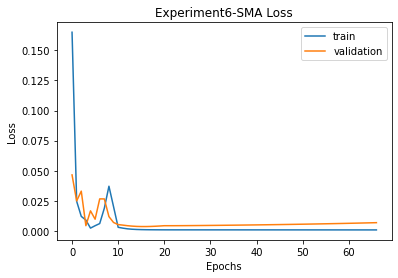


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.807, Time=3.36 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.07 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15585.734, Time=9.60 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14574.593, Time=8.22 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15458.426, Time=12.33 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15621.247, Time=13.62 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17231.605, Time=22.27 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14570.593, Time=10.31 sec
 ARIMA(1,3,3)(0,0,0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.22007, saving model to LSTM6.h5
16/16 - 5s - loss: 0.1719 - accuracy: 0.0000e+00 - val_loss: 0.2201 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 5s/epoch - 305ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.22007 to 0.00692, saving model to LSTM6.h5
16/16 - 0s - loss: 0.1083 - accuracy: 0.0000e+00 - val_loss: 0.0069 - val_accuracy: 0.0037 - lr: 0.0010 - 188ms/epoch - 12ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00692
16/16 - 0s - loss: 0.0348 - accuracy: 0.0000e+00 - val_loss: 0.0648 - val_accuracy: 0.0037 - lr: 0.0010 - 156ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00692
16/16 - 0s - loss: 0.0142 - accuracy: 0.0000e+00 - val_loss: 0.0105 - val_accuracy: 0.0037 - lr: 0.0010 - 144ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00692
16/16 - 0s - loss: 0.0020 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0037 - lr: 0.0010

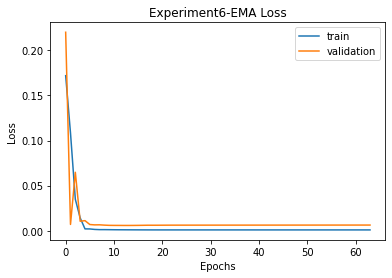


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 60.00625951694821 
RMSE:	 7.7463707319588195 
MAPE:	 6.477662803945572
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15462.744, Time=15.41 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13144.103, Time=2.94 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16179.868, Time=7.16 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14670.350, Time=14.73 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15643.233, Time=20.76 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15673.437, Time=18.87 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.17569, saving model to LSTM6.h5
17/17 - 5s - loss: 0.1233 - accuracy: 0.0000e+00 - val_loss: 0.1757 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 5s/epoch - 310ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.17569 to 0.04607, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0676 - accuracy: 0.0000e+00 - val_loss: 0.0461 - val_accuracy: 0.0037 - lr: 0.0010 - 177ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.04607 to 0.01079, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0091 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0037 - lr: 0.0010 - 171ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01079
17/17 - 0s - loss: 0.0063 - accuracy: 0.0000e+00 - val_loss: 0.0188 - val_accuracy: 0.0037 - lr: 0.0010 - 187ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01079
17/17 - 0s - loss: 0.0019 - accuracy: 0.0000e+00 - val_loss: 0.0168 - va

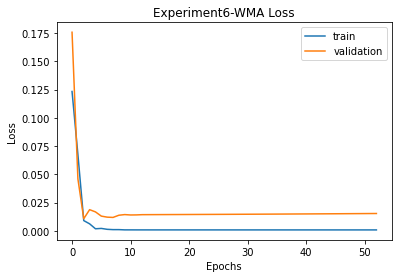


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 60.00625951694821 
RMSE:	 7.7463707319588195 
MAPE:	 6.477662803945572

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 56.69687583727807 
RMSE:	 7.529732786578689 
MAPE:	 6.079114892920341
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.773, Time=3.60 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.12 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16293.727, Time=8.77 sec
 ARIMA(0,3,1)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17005.977, Time=3.87 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17000.665, Time=4.53 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 103.787 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Sun, 12 Dec 2021   AIC                         -17089.440
Time:                        21:34:09   BIC                         -16972.169
Sample:                             0   HQIC                        -17044.403
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.05846, saving model to LSTM6.h5
10/10 - 5s - loss: 0.1879 - accuracy: 0.0000e+00 - val_loss: 0.0585 - val_accuracy: 0.0037 - lr: 0.0010 - 5s/epoch - 523ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.05846 to 0.01286, saving model to LSTM6.h5
10/10 - 0s - loss: 0.0721 - accuracy: 0.0000e+00 - val_loss: 0.0129 - val_accuracy: 0.0037 - lr: 0.0010 - 124ms/epoch - 12ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01286
10/10 - 0s - loss: 0.0232 - accuracy: 0.0000e+00 - val_loss: 0.0828 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 98ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01286
10/10 - 0s - loss: 0.0083 - accuracy: 0.0000e+00 - val_loss: 0.0383 - val_accuracy: 0.0037 - lr: 0.0010 - 95ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01286
10/10 - 0s - loss: 0.0043 - accuracy: 0.0000e+00 - val_loss: 0.0515 - val_accuracy: 0.0037 - lr: 0.0010 -

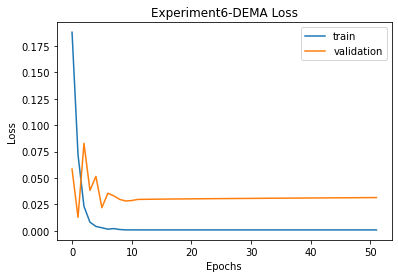


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 60.00625951694821 
RMSE:	 7.7463707319588195 
MAPE:	 6.477662803945572

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 56.69687583727807 
RMSE:	 7.529732786578689 
MAPE:	 6.079114892920341

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 115.62227637424353 
RMSE:	 10.752779937032262 
MAPE:	 9.572797111202712
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.733, Time=3.37 sec
 ARI

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.16046, saving model to LSTM6.h5
45/45 - 5s - loss: 0.1373 - accuracy: 0.0000e+00 - val_loss: 0.1605 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 5s/epoch - 110ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.16046 to 0.02408, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0606 - accuracy: 0.0000e+00 - val_loss: 0.0241 - val_accuracy: 0.0037 - lr: 0.0010 - 369ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02408
45/45 - 0s - loss: 0.0158 - accuracy: 0.0000e+00 - val_loss: 0.0451 - val_accuracy: 0.0037 - lr: 0.0010 - 339ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.02408 to 0.00695, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0101 - accuracy: 0.0000e+00 - val_loss: 0.0069 - val_accuracy: 0.0037 - lr: 0.0010 - 385ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00695
45/45 - 0s - loss: 0.0028 - accuracy: 0.0000e+00 - val_loss: 0.0210 - val_a

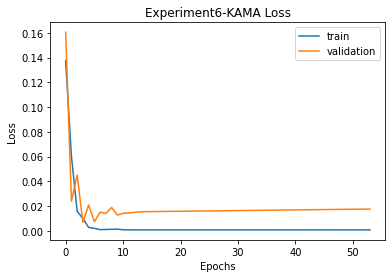


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 60.00625951694821 
RMSE:	 7.7463707319588195 
MAPE:	 6.477662803945572

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 56.69687583727807 
RMSE:	 7.529732786578689 
MAPE:	 6.079114892920341

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 115.62227637424353 
RMSE:	 10.752779937032262 
MAPE:	 9.572797111202712

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 37.71755854324582 
RMSE:	 6.141462247970415 
MAPE:	 4.988005540782208
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.10075, saving model to LSTM6.h5
58/58 - 5s - loss: 0.1317 - accuracy: 0.0000e+00 - val_loss: 0.1007 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 5s/epoch - 89ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.10075 to 0.01617, saving model to LSTM6.h5
58/58 - 0s - loss: 0.0317 - accuracy: 0.0000e+00 - val_loss: 0.0162 - val_accuracy: 0.0037 - lr: 0.0010 - 466ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01617
58/58 - 0s - loss: 0.0048 - accuracy: 0.0000e+00 - val_loss: 0.0227 - val_accuracy: 0.0037 - lr: 0.0010 - 442ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.01617 to 0.00905, saving model to LSTM6.h5
58/58 - 0s - loss: 0.0128 - accuracy: 0.0000e+00 - val_loss: 0.0091 - val_accuracy: 0.0037 - lr: 0.0010 - 473ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00905
58/58 - 0s - loss: 0.0176 - accuracy: 0.0000e+00 - val_loss: 0.0199 - val_ac

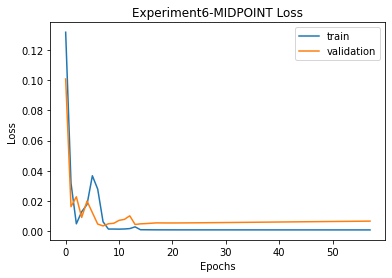


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 60.00625951694821 
RMSE:	 7.7463707319588195 
MAPE:	 6.477662803945572

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 56.69687583727807 
RMSE:	 7.529732786578689 
MAPE:	 6.079114892920341

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 115.62227637424353 
RMSE:	 10.752779937032262 
MAPE:	 9.572797111202712

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 37.71755854324582 
RMSE:	 6.141462247970415 
MAPE:	 4.988005540782208

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 58.98858807771727 
RMSE:	 7.680402859076942 
MAPE:	 6.28601448834674
T3
T3([input_arrays], [t

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17006.024, Time=4.10 sec
 ARIMA(3,3,3)(0,0,0)[0]             : AIC=-14720.521, Time=14.25 sec
 ARIMA(2,3,3)(0,0,0)[0]             : AIC=-16599.516, Time=14.92 sec
 ARIMA(3,3,2)(0,0,0)[0] intercept   : AIC=-13110.324, Time=18.84 sec

Best model:  ARIMA(3,3,2)(0,0,0)[0]          
Total fit time: 123.992 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 2)   Log Likelihood                8700.998
Date:                Sun, 12 Dec 2021   AIC                         -17349.997
Time:                        22:06:32   BIC                         -17228.035
Sample:                             0   HQIC                        -17303.158
                                - 808                                         
Covariance Type:                  opg                                         
              

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.10064, saving model to LSTM6.h5
43/43 - 6s - loss: 0.1186 - accuracy: 0.0000e+00 - val_loss: 0.1006 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 6s/epoch - 132ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.10064 to 0.01455, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0729 - accuracy: 0.0000e+00 - val_loss: 0.0145 - val_accuracy: 0.0037 - lr: 0.0010 - 363ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01455
43/43 - 0s - loss: 0.0163 - accuracy: 0.0000e+00 - val_loss: 0.0469 - val_accuracy: 0.0037 - lr: 0.0010 - 341ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.01455 to 0.00504, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0115 - accuracy: 0.0000e+00 - val_loss: 0.0050 - val_accuracy: 0.0037 - lr: 0.0010 - 382ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00504
43/43 - 0s - loss: 0.0034 - accuracy: 0.0000e+00 - val_loss: 0.0221 - val_a

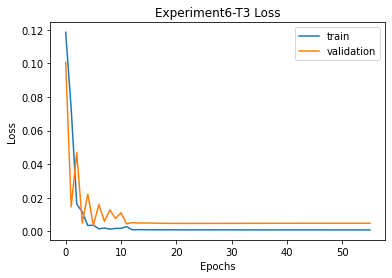


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 60.00625951694821 
RMSE:	 7.7463707319588195 
MAPE:	 6.477662803945572

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 56.69687583727807 
RMSE:	 7.529732786578689 
MAPE:	 6.079114892920341

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 115.62227637424353 
RMSE:	 10.752779937032262 
MAPE:	 9.572797111202712

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 37.71755854324582 
RMSE:	 6.141462247970415 
MAPE:	 4.988005540782208

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 58.98858807771727 
RMSE:	 7.680402859076942 
MAPE:	 6.28601448834674

T3
Prediction vs Close:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.04654, saving model to LSTM6.h5
90/90 - 6s - loss: 0.1165 - accuracy: 0.0000e+00 - val_loss: 0.0465 - val_accuracy: 0.0037 - lr: 0.0010 - 6s/epoch - 64ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.04654
90/90 - 1s - loss: 0.0619 - accuracy: 0.0000e+00 - val_loss: 0.1186 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 680ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.04654 to 0.01602, saving model to LSTM6.h5
90/90 - 1s - loss: 0.0430 - accuracy: 0.0000e+00 - val_loss: 0.0160 - val_accuracy: 0.0037 - lr: 0.0010 - 692ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.01602 to 0.01437, saving model to LSTM6.h5
90/90 - 1s - loss: 0.0415 - accuracy: 0.0000e+00 - val_loss: 0.0144 - val_accuracy: 0.0037 - lr: 0.0010 - 679ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.01437 to 0.01148, saving model to LSTM6.h5
90/90 - 1s - loss: 0.0272 - accuracy: 0.0000e+

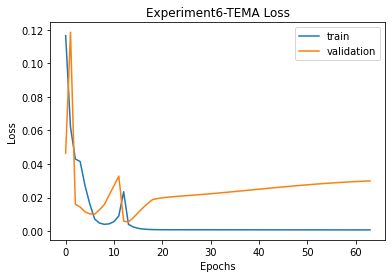


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 63.854129927017006 
RMSE:	 7.990877919666713 
MAPE:	 6.455960052106778

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 60.00625951694821 
RMSE:	 7.7463707319588195 
MAPE:	 6.477662803945572

WMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 56.69687583727807 
RMSE:	 7.529732786578689 
MAPE:	 6.079114892920341

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 115.62227637424353 
RMSE:	 10.752779937032262 
MAPE:	 9.572797111202712

KAMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 37.71755854324582 
RMSE:	 6.141462247970415 
MAPE:	 4.988005540782208

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 58.98858807771727 
RMSE:	 7.680402859076942 
MAPE:	 6.28601448834674

T3
Prediction vs Close:

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation6 = {}
    imgfile = 'Experiment6'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation6[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation6_data.json', 'w') as fp:
                    json.dump(simulation6, fp)

                for ma in simulation6.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation6[ma]['final']['mse'],
                          '\nRMSE:\t', simulation6[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation6[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/3600)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment6.png to Experiment6 (2).png


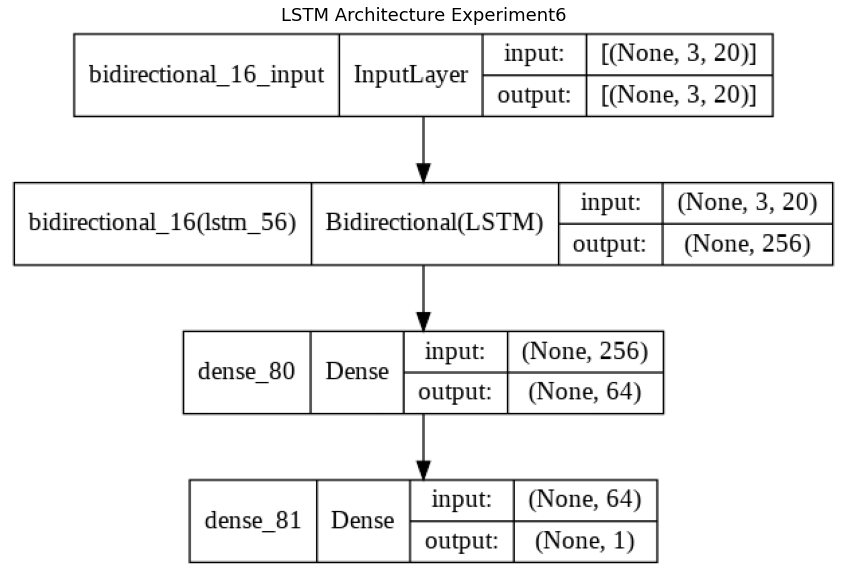

In [ ]:
img = cv2.imread('Experiment6.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [167]:
with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)
fileimg = 'Experiment6'

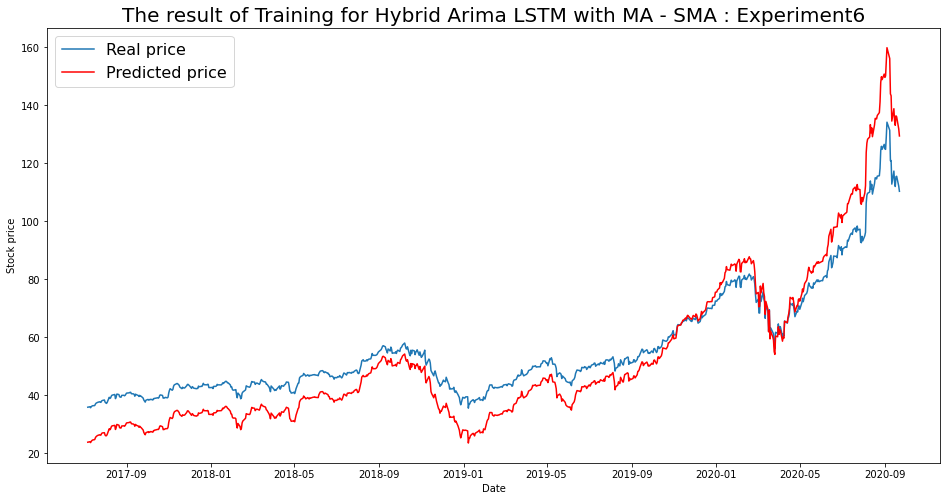

----- Train RMSE for SMA ----- 8.87101181703794
----- Train_MSE_LSTM for SMA ----- 78.6948506580268
----- Train MAE LSTM for SMA ----- 7.764835828601724


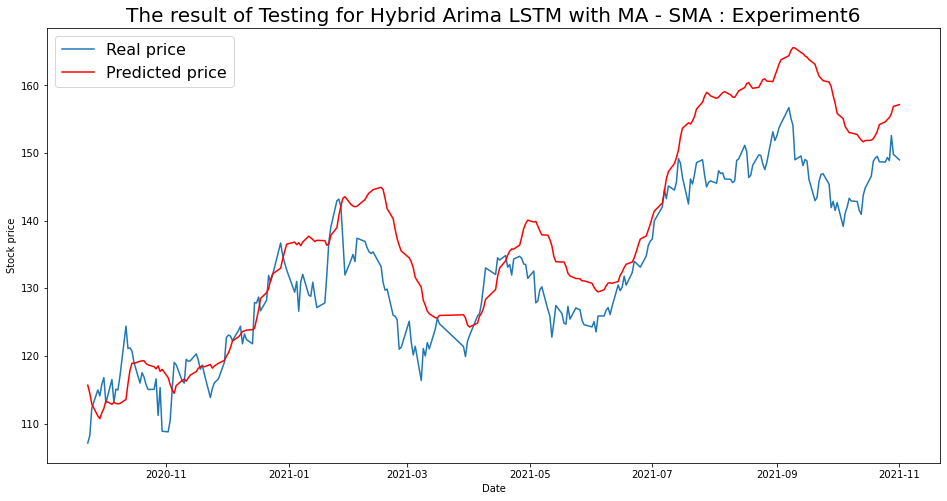

----- Test RMSE for SMA----- 7.990877919666713
----- Test_MSE_LSTM for SMA----- 63.854129927017006
----- Test_MAE_LSTM for SMA----- 6.455960052106778


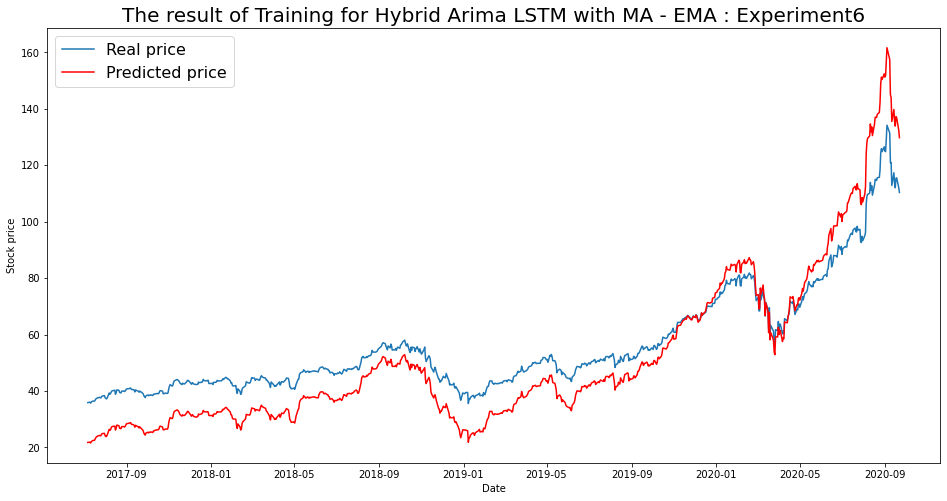

----- Train RMSE for EMA ----- 10.17937239908588
----- Train_MSE_LSTM for EMA ----- 103.61962243927141
----- Train MAE LSTM for EMA ----- 9.027416054918984


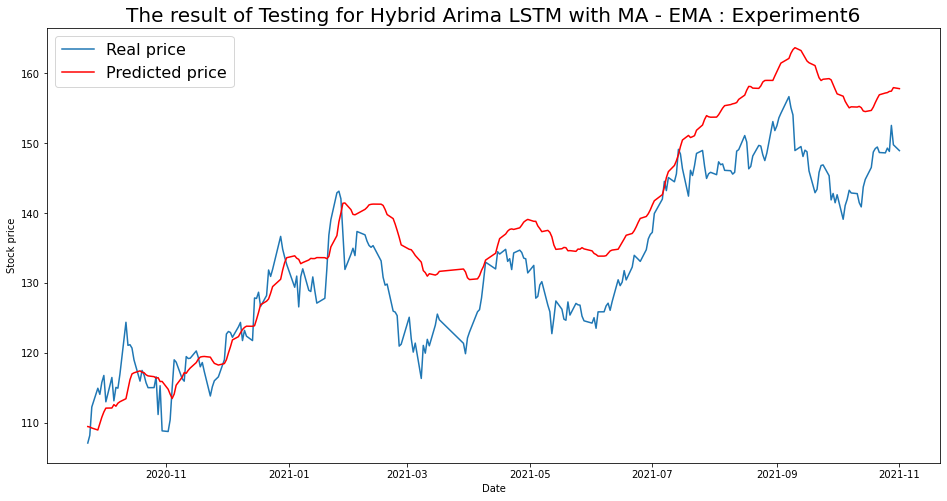

----- Test RMSE for EMA----- 7.7463707319588195
----- Test_MSE_LSTM for EMA----- 60.00625951694821
----- Test_MAE_LSTM for EMA----- 6.477662803945572


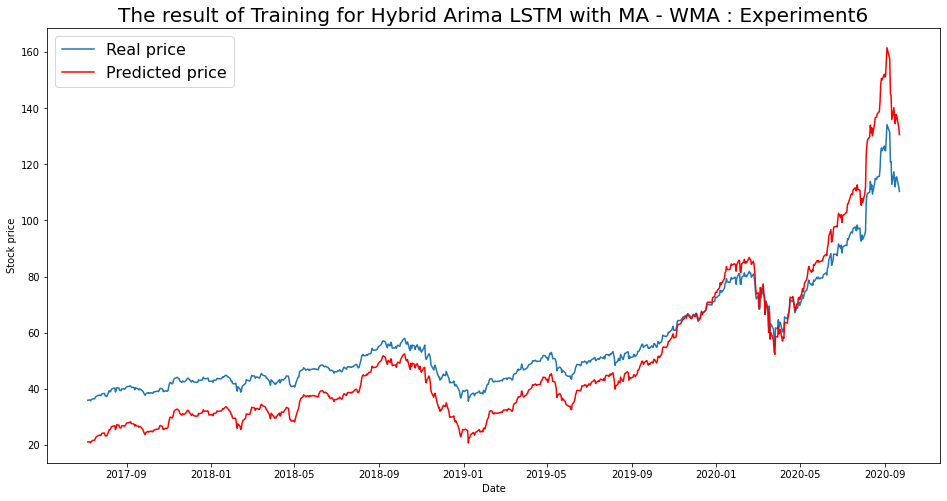

----- Train RMSE for WMA ----- 10.487371340854157
----- Train_MSE_LSTM for WMA ----- 109.98495764096911
----- Train MAE LSTM for WMA ----- 9.322647111386633


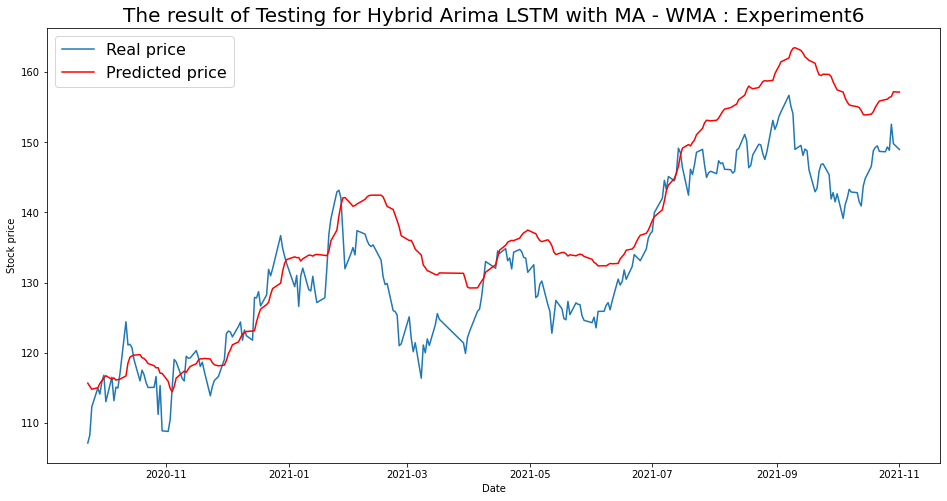

----- Test RMSE for WMA----- 7.529732786578689
----- Test_MSE_LSTM for WMA----- 56.69687583727807
----- Test_MAE_LSTM for WMA----- 6.079114892920341


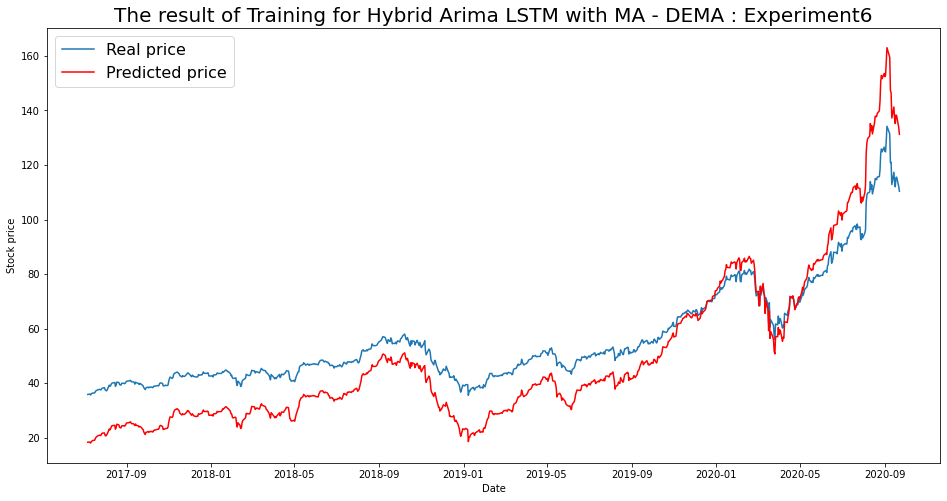

----- Train RMSE for DEMA ----- 12.130525100228542
----- Train_MSE_LSTM for DEMA ----- 147.14963920727467
----- Train MAE LSTM for DEMA ----- 10.904426826985949


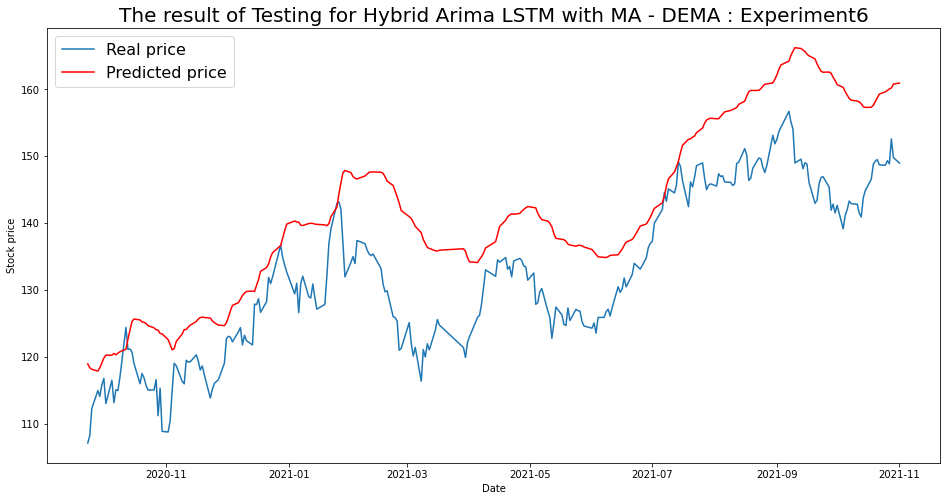

----- Test RMSE for DEMA----- 10.752779937032262
----- Test_MSE_LSTM for DEMA----- 115.62227637424353
----- Test_MAE_LSTM for DEMA----- 9.572797111202712


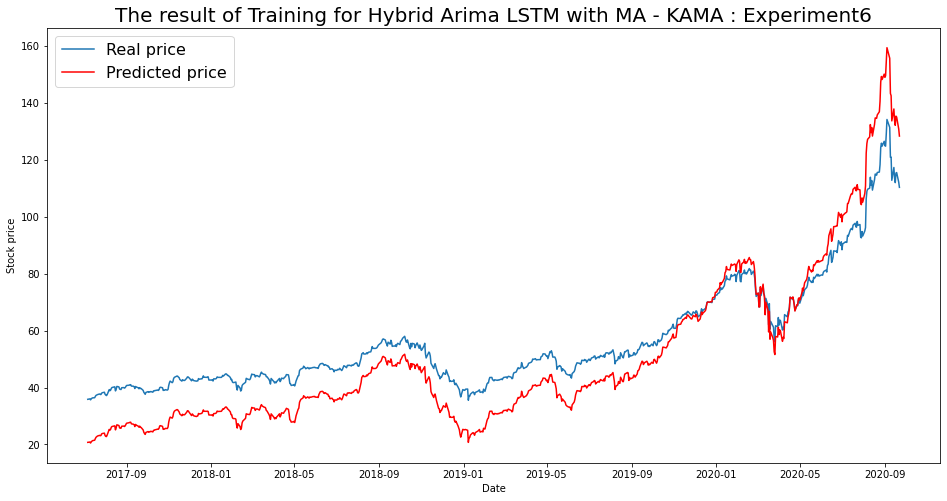

----- Train RMSE for KAMA ----- 10.55508436039303
----- Train_MSE_LSTM for KAMA ----- 111.40980585501353
----- Train MAE LSTM for KAMA ----- 9.485642571073708


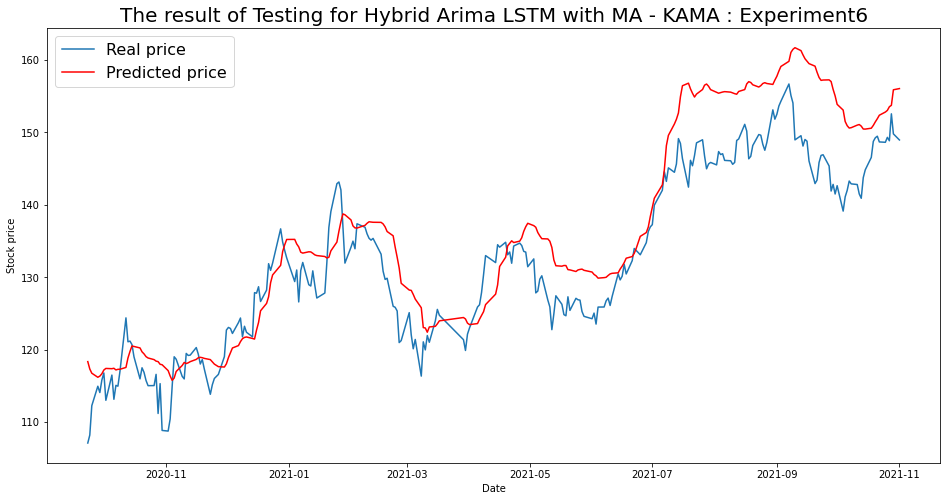

----- Test RMSE for KAMA----- 6.141462247970415
----- Test_MSE_LSTM for KAMA----- 37.71755854324582
----- Test_MAE_LSTM for KAMA----- 4.988005540782208


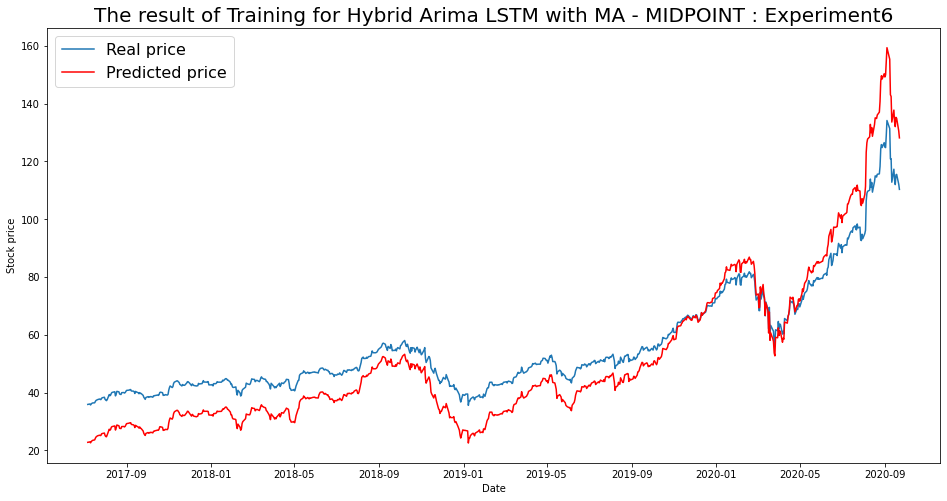

----- Train RMSE for MIDPOINT ----- 9.465450907632647
----- Train_MSE_LSTM for MIDPOINT ----- 89.59476088480369
----- Train MAE LSTM for MIDPOINT ----- 8.411639738797975


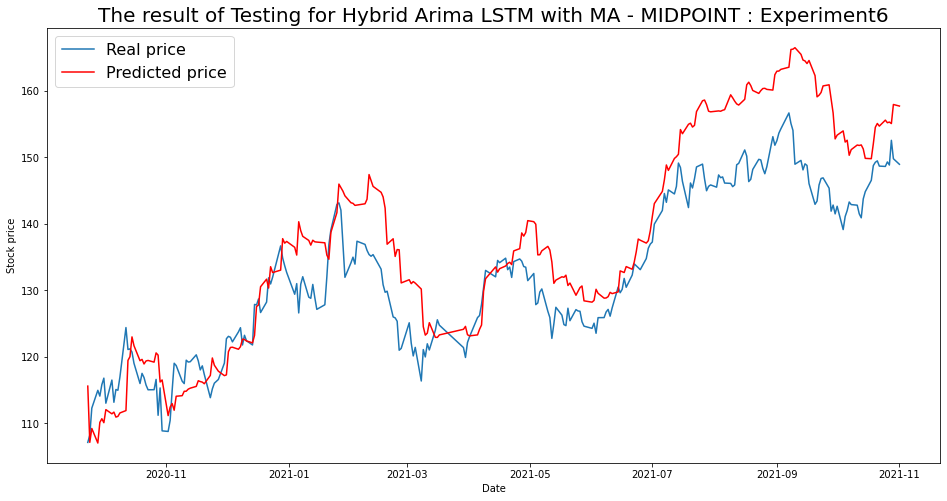

----- Test RMSE for MIDPOINT----- 7.680402859076942
----- Test_MSE_LSTM for MIDPOINT----- 58.98858807771727
----- Test_MAE_LSTM for MIDPOINT----- 6.28601448834674


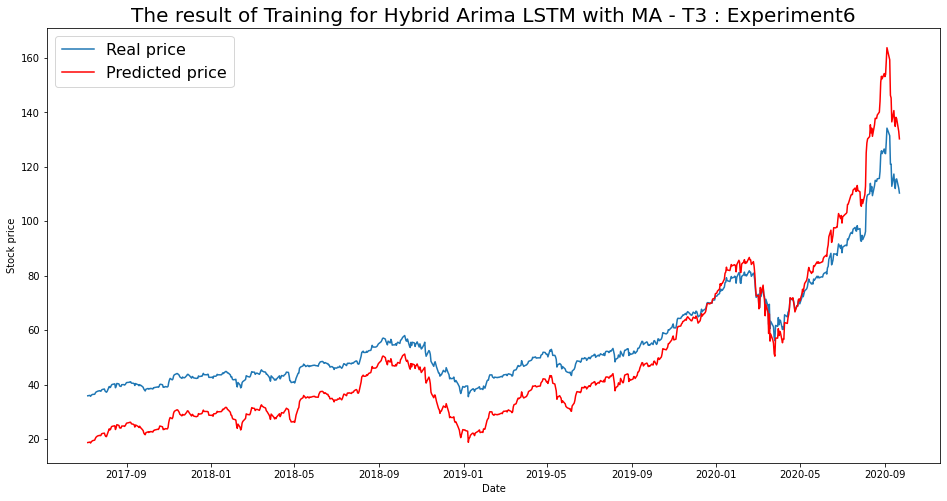

----- Train RMSE for T3 ----- 12.030459071540214
----- Train_MSE_LSTM for T3 ----- 144.7319454720042
----- Train MAE LSTM for T3 ----- 10.830626645936897


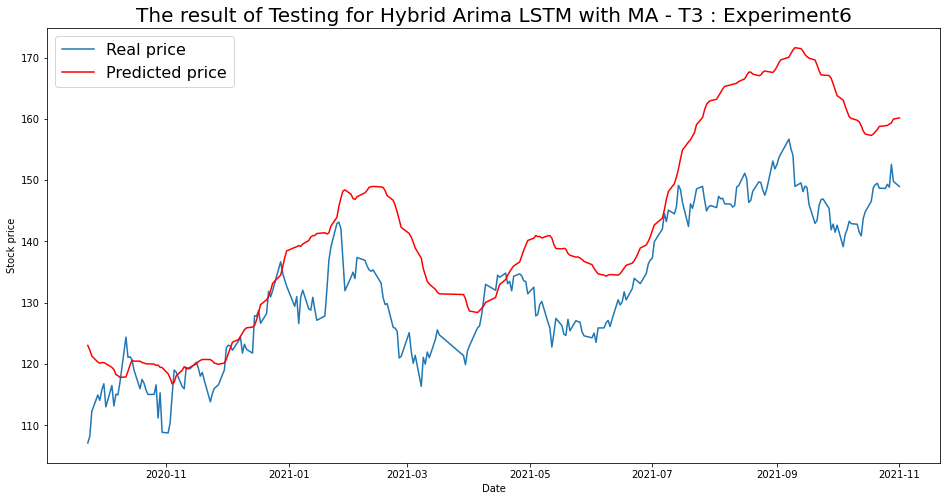

----- Test RMSE for T3----- 12.02585308012629
----- Test_MSE_LSTM for T3----- 144.62114230478295
----- Test_MAE_LSTM for T3----- 9.865104713742154


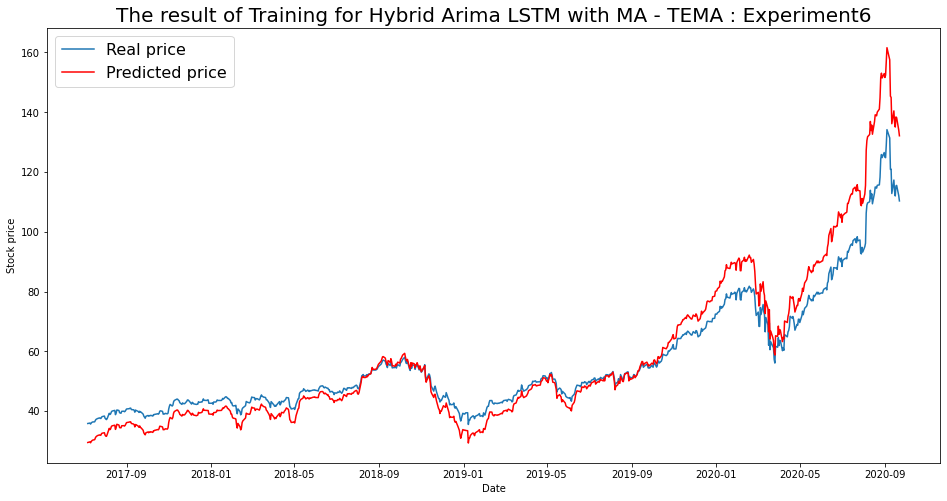

----- Train RMSE for TEMA ----- 7.4517243925140235
----- Train_MSE_LSTM for TEMA ----- 55.52819642198849
----- Train MAE LSTM for TEMA ----- 5.180568682312021


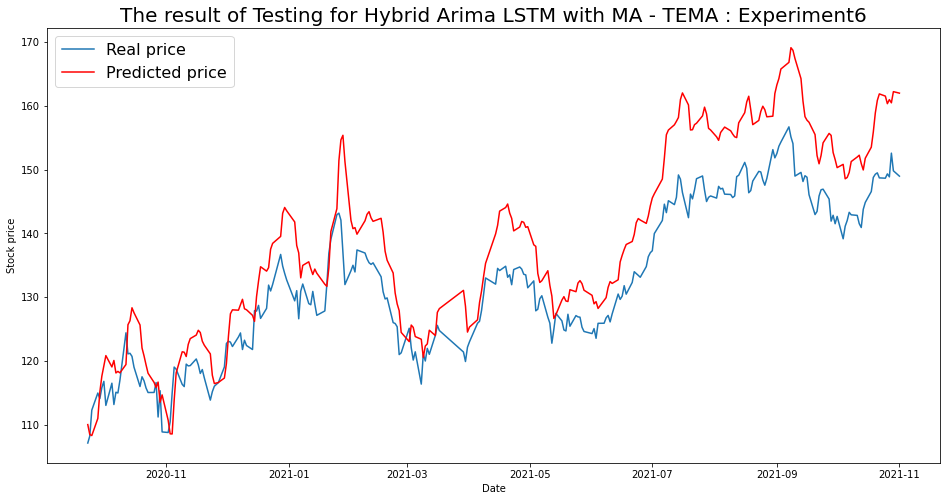

----- Test RMSE for TEMA----- 7.75998683084788
----- Test_MSE_LSTM for TEMA----- 60.21739561493253
----- Test_MAE_LSTM for TEMA----- 6.775089256594788


In [168]:
for i in range(len(list(simulation6.keys()))):
  SIM = list(simulation6.keys())[i]
  plot_train(simulation6,SIM)
  plot_test(simulation6,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 7

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15057.252, Time=5.47 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13616.841, Time=2.96 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15177.809, Time=11.08 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14725.568, Time=12.35 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15511.840, Time=16.78 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-15663.563, Time=16.92 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=-15093.498, Time=7.92 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15194.504, Time=11.57 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=-14885.340, Time=21.37 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 106.454 seconds
                               SARIMA

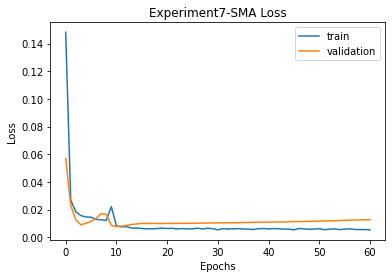


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.807, Time=3.35 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.19 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15585.734, Time=9.76 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14574.593, Time=7.84 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15458.426, Time=11.72 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15621.247, Time=13.61 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17231.605, Time=22.31 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14570.593, Time=10.58 sec
 ARIMA(1,3,3)(0,0,0)[

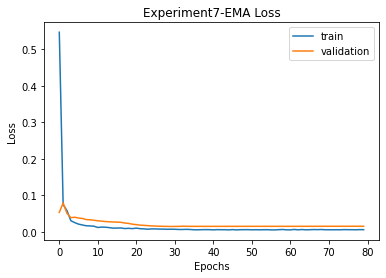


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 63.36969283161608 
RMSE:	 7.960508327463522 
MAPE:	 6.712143148682283
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15462.744, Time=15.26 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13144.103, Time=2.93 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16179.868, Time=7.16 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14670.350, Time=14.58 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15643.233, Time=21.91 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15673.437, Time=19.12 sec


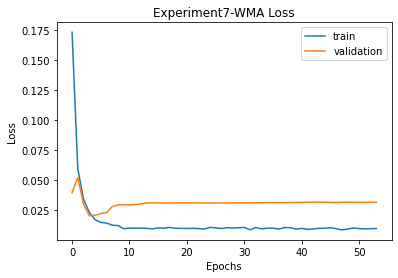


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 63.36969283161608 
RMSE:	 7.960508327463522 
MAPE:	 6.712143148682283

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	41.04% Accuracy
MSE:	 71.61670961743842 
RMSE:	 8.462665633087392 
MAPE:	 6.541482431642796
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.773, Time=3.30 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.09 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16293.727, Time=8.63 sec
 ARIMA(0,3,1)(0,0,0)[0]           

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17005.977, Time=4.14 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17000.665, Time=4.95 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 103.606 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Sun, 12 Dec 2021   AIC                         -17089.440
Time:                        22:54:50   BIC                         -16972.169
Sample:                             0   HQIC                        -17044.403
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

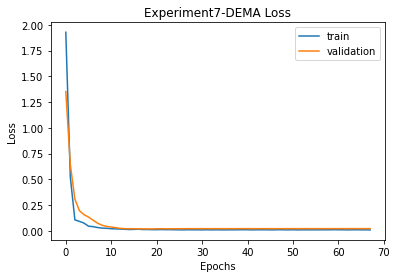


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 63.36969283161608 
RMSE:	 7.960508327463522 
MAPE:	 6.712143148682283

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	41.04% Accuracy
MSE:	 71.61670961743842 
RMSE:	 8.462665633087392 
MAPE:	 6.541482431642796

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 168.8259463108875 
RMSE:	 12.99330390281423 
MAPE:	 11.83342735128442
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.733, Time=3.45 sec
 ARIMA(0,3

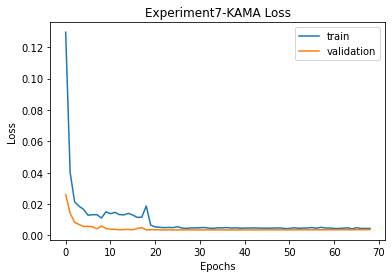


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 63.36969283161608 
RMSE:	 7.960508327463522 
MAPE:	 6.712143148682283

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	41.04% Accuracy
MSE:	 71.61670961743842 
RMSE:	 8.462665633087392 
MAPE:	 6.541482431642796

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 168.8259463108875 
RMSE:	 12.99330390281423 
MAPE:	 11.83342735128442

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 69.29548051216841 
RMSE:	 8.324390699154408 
MAPE:	 6.942234066695414
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDPOI

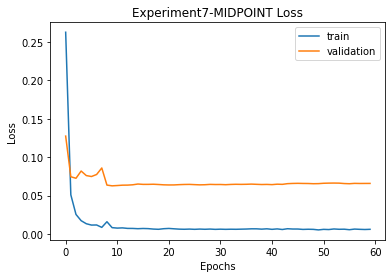


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 63.36969283161608 
RMSE:	 7.960508327463522 
MAPE:	 6.712143148682283

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	41.04% Accuracy
MSE:	 71.61670961743842 
RMSE:	 8.462665633087392 
MAPE:	 6.541482431642796

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 168.8259463108875 
RMSE:	 12.99330390281423 
MAPE:	 11.83342735128442

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 69.29548051216841 
RMSE:	 8.324390699154408 
MAPE:	 6.942234066695414

MIDPOINT
Prediction vs Close:		48.88% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 20.287194417114076 
RMSE:	 4.504130817051618 
MAPE:	 3.6982533278355527
T3
T3([input_arrays], [time

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17006.024, Time=4.31 sec
 ARIMA(3,3,3)(0,0,0)[0]             : AIC=-14720.521, Time=14.42 sec
 ARIMA(2,3,3)(0,0,0)[0]             : AIC=-16599.516, Time=14.49 sec
 ARIMA(3,3,2)(0,0,0)[0] intercept   : AIC=-13110.324, Time=18.62 sec

Best model:  ARIMA(3,3,2)(0,0,0)[0]          
Total fit time: 124.535 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 2)   Log Likelihood                8700.998
Date:                Sun, 12 Dec 2021   AIC                         -17349.997
Time:                        23:27:32   BIC                         -17228.035
Sample:                             0   HQIC                        -17303.158
                                - 808                                         
Covariance Type:                  opg                                         
              

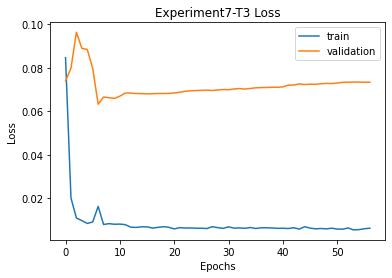


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 63.36969283161608 
RMSE:	 7.960508327463522 
MAPE:	 6.712143148682283

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	41.04% Accuracy
MSE:	 71.61670961743842 
RMSE:	 8.462665633087392 
MAPE:	 6.541482431642796

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 168.8259463108875 
RMSE:	 12.99330390281423 
MAPE:	 11.83342735128442

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 69.29548051216841 
RMSE:	 8.324390699154408 
MAPE:	 6.942234066695414

MIDPOINT
Prediction vs Close:		48.88% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 20.287194417114076 
RMSE:	 4.504130817051618 
MAPE:	 3.6982533278355527

T3
Prediction vs Close:		5

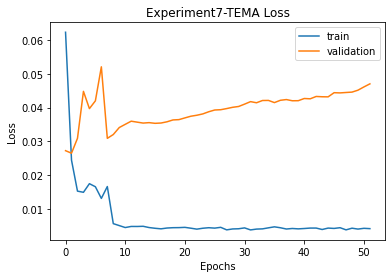


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 52.20083682521797 
RMSE:	 7.225014659169763 
MAPE:	 5.885308101636885

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 63.36969283161608 
RMSE:	 7.960508327463522 
MAPE:	 6.712143148682283

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	41.04% Accuracy
MSE:	 71.61670961743842 
RMSE:	 8.462665633087392 
MAPE:	 6.541482431642796

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 168.8259463108875 
RMSE:	 12.99330390281423 
MAPE:	 11.83342735128442

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 69.29548051216841 
RMSE:	 8.324390699154408 
MAPE:	 6.942234066695414

MIDPOINT
Prediction vs Close:		48.88% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 20.287194417114076 
RMSE:	 4.504130817051618 
MAPE:	 3.6982533278355527

T3
Prediction vs Close:		5

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation7 = {}
    imgfile = 'Experiment7'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation7[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation7_data.json', 'w') as fp:
                    json.dump(simulation7, fp)

                for ma in simulation7.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation7[ma]['final']['mse'],
                          '\nRMSE:\t', simulation7[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation7[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: min:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment7.png to Experiment7 (2).png


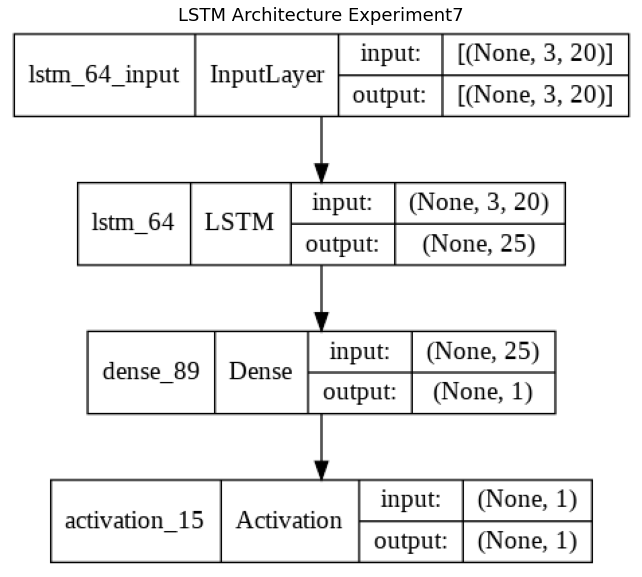

In [ ]:
img = cv2.imread('Experiment7.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [174]:
with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)
fileimg = 'Experiment7'

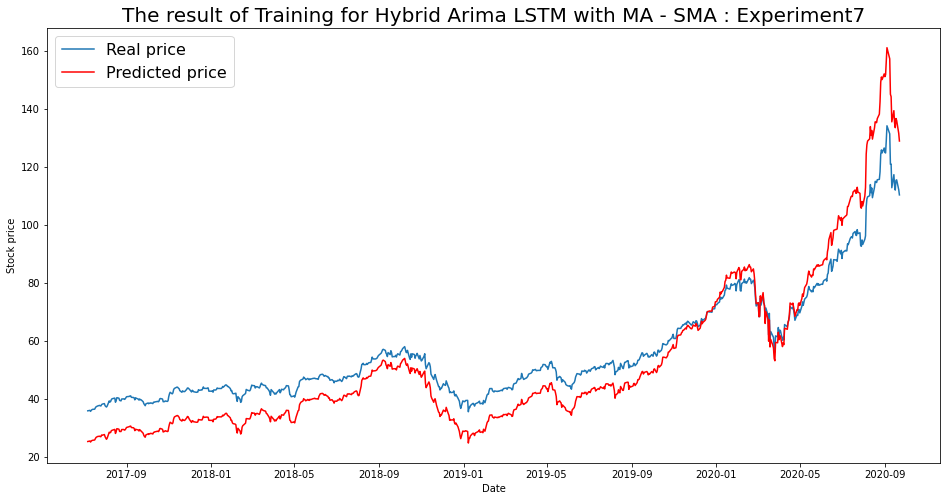

----- Train RMSE for SMA ----- 9.057211794541606
----- Train_MSE_LSTM for SMA ----- 82.03308549118358
----- Train MAE LSTM for SMA ----- 7.94711277040072


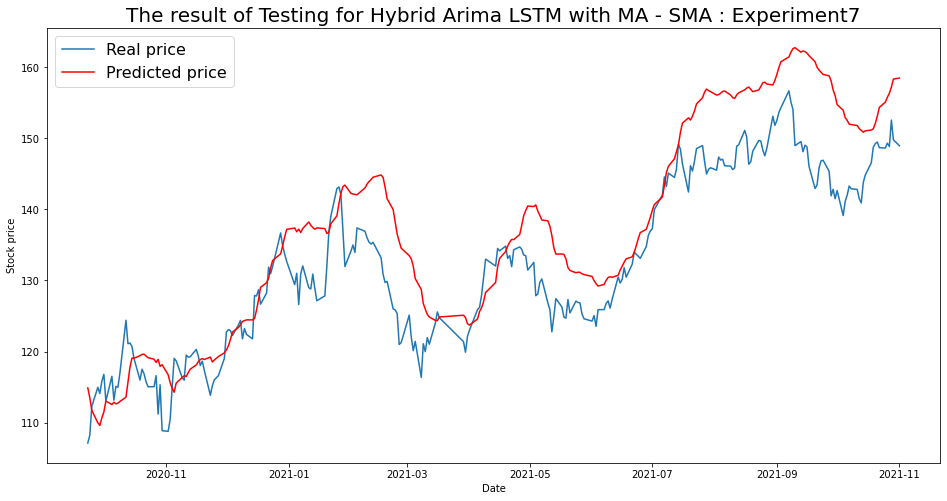

----- Test RMSE for SMA----- 7.225014659169763
----- Test_MSE_LSTM for SMA----- 52.20083682521797
----- Test_MAE_LSTM for SMA----- 5.885308101636885


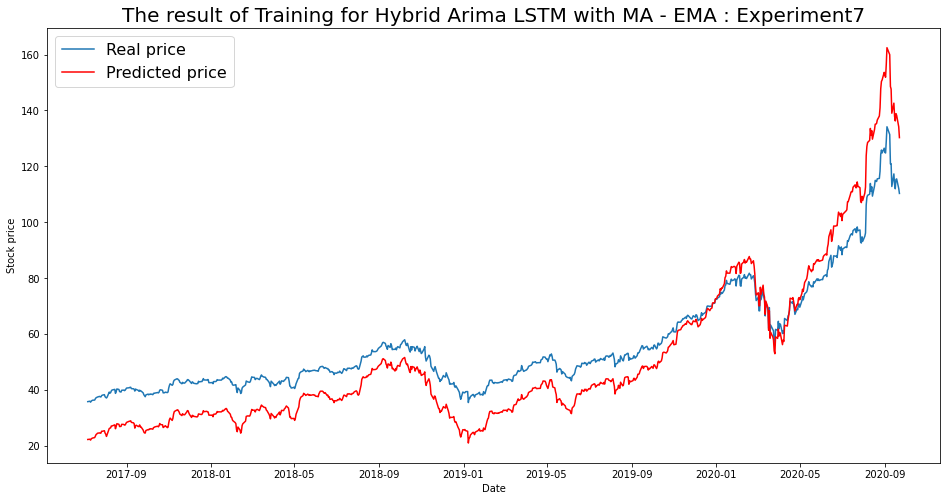

----- Train RMSE for EMA ----- 10.618347756101933
----- Train_MSE_LSTM for EMA ----- 112.74930906951495
----- Train MAE LSTM for EMA ----- 9.56987204528091


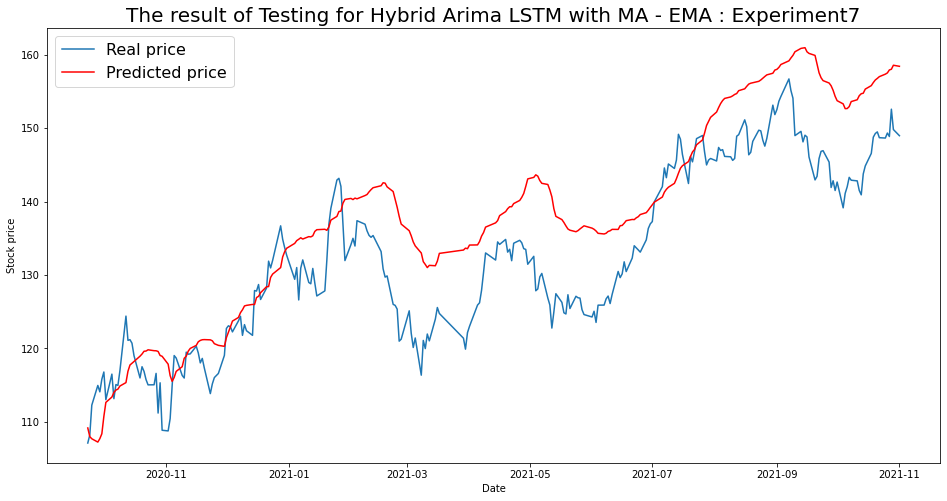

----- Test RMSE for EMA----- 7.960508327463522
----- Test_MSE_LSTM for EMA----- 63.36969283161608
----- Test_MAE_LSTM for EMA----- 6.712143148682283


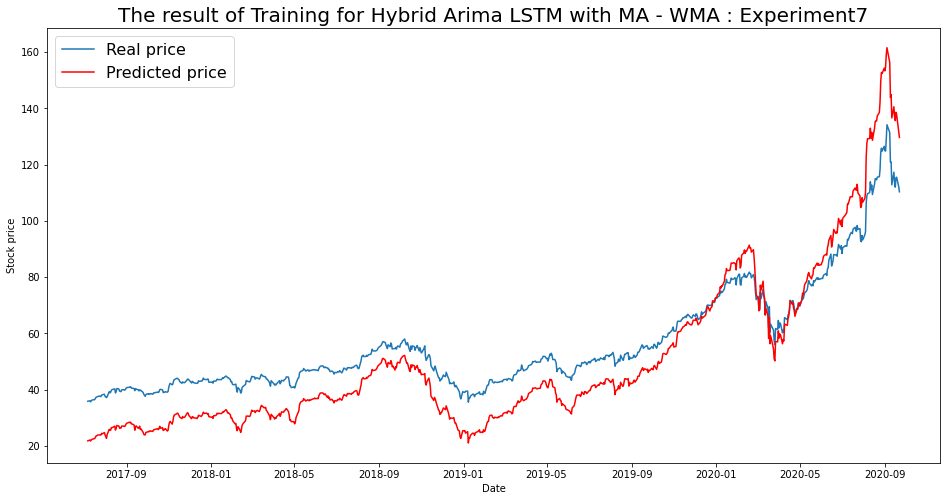

----- Train RMSE for WMA ----- 10.936273635149417
----- Train_MSE_LSTM for WMA ----- 119.60208102286424
----- Train MAE LSTM for WMA ----- 9.916874330919605


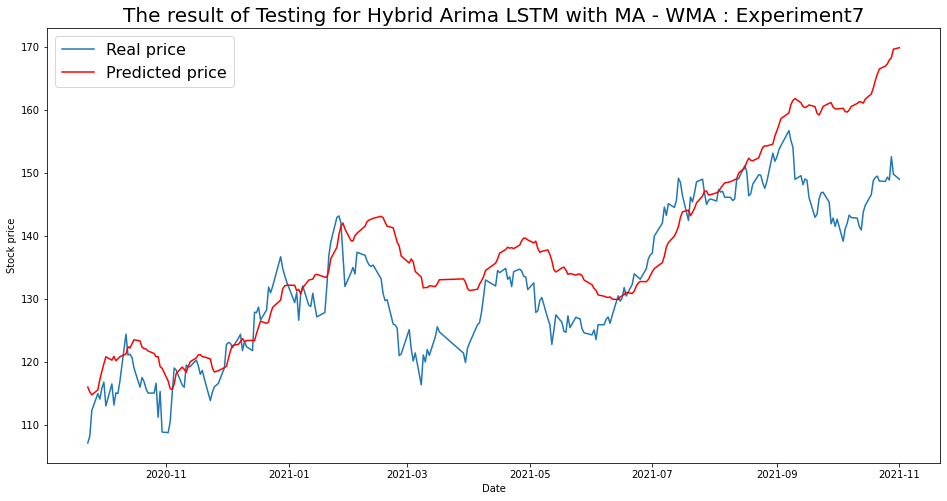

----- Test RMSE for WMA----- 8.462665633087392
----- Test_MSE_LSTM for WMA----- 71.61670961743842
----- Test_MAE_LSTM for WMA----- 6.541482431642796


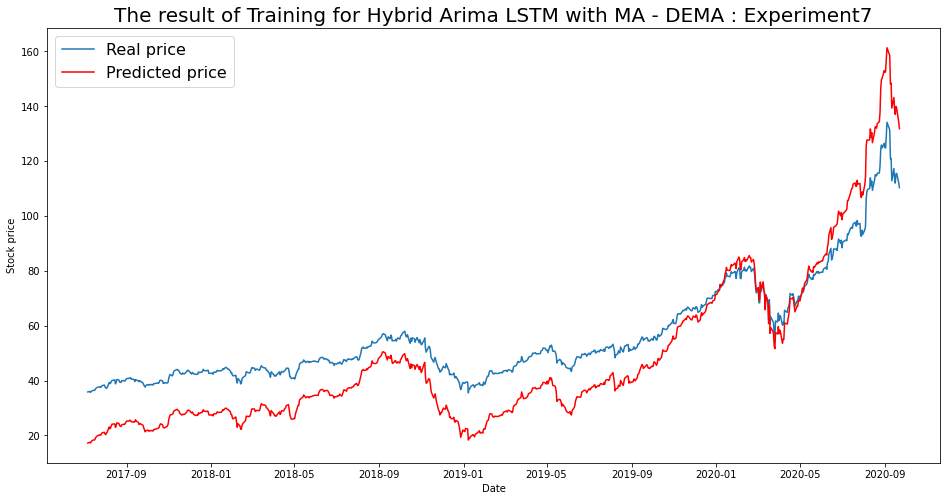

----- Train RMSE for DEMA ----- 12.811456939062188
----- Train_MSE_LSTM for DEMA ----- 164.1334289014447
----- Train MAE LSTM for DEMA ----- 11.627435864373526


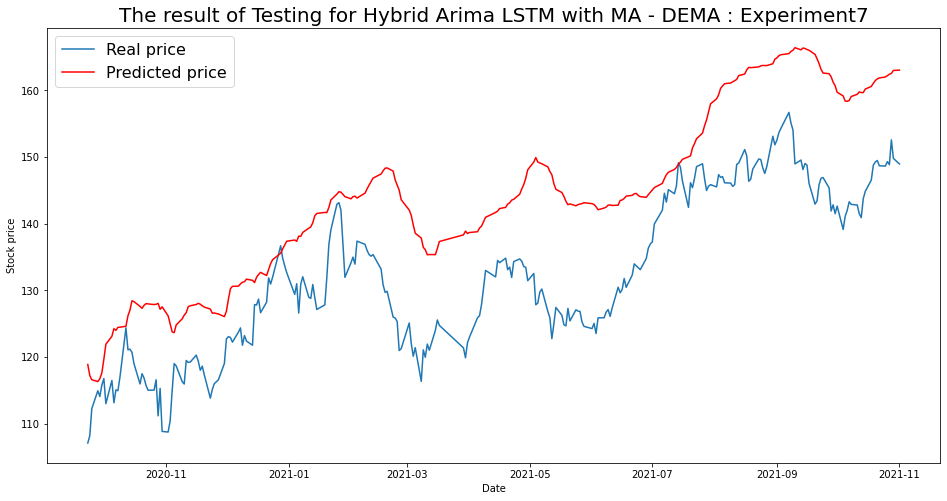

----- Test RMSE for DEMA----- 12.99330390281423
----- Test_MSE_LSTM for DEMA----- 168.8259463108875
----- Test_MAE_LSTM for DEMA----- 11.83342735128442


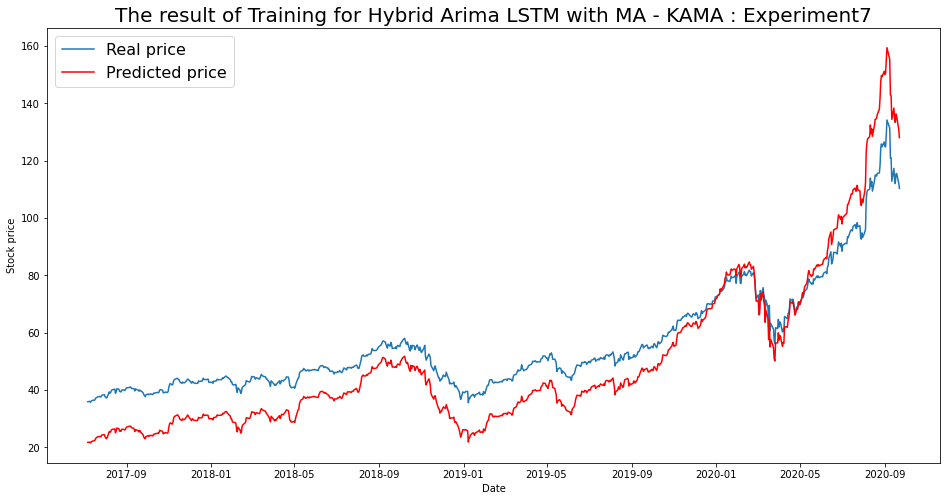

----- Train RMSE for KAMA ----- 10.744564202390054
----- Train_MSE_LSTM for KAMA ----- 115.44565989928182
----- Train MAE LSTM for KAMA ----- 9.731041218642845


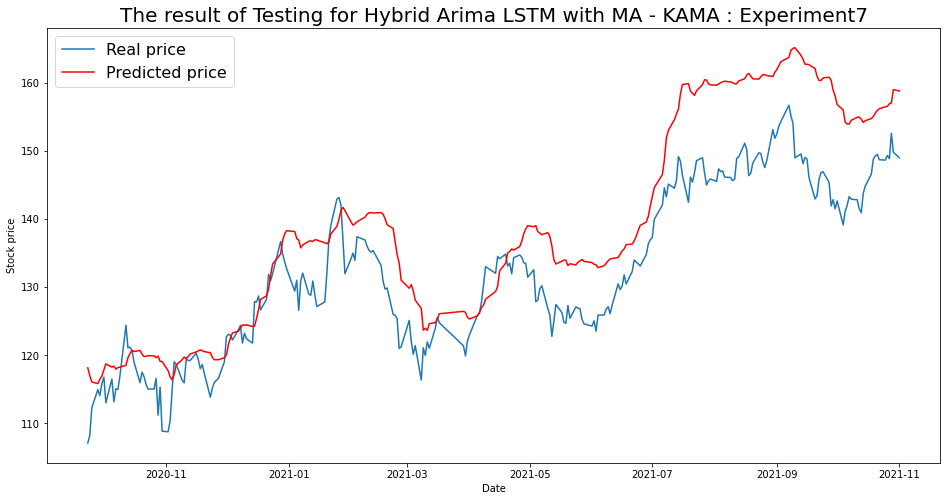

----- Test RMSE for KAMA----- 8.324390699154408
----- Test_MSE_LSTM for KAMA----- 69.29548051216841
----- Test_MAE_LSTM for KAMA----- 6.942234066695414


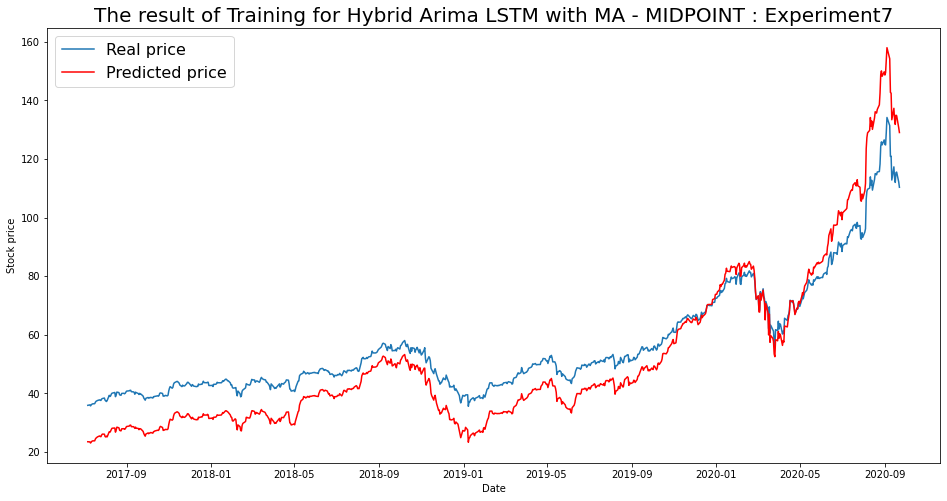

----- Train RMSE for MIDPOINT ----- 9.643330328183875
----- Train_MSE_LSTM for MIDPOINT ----- 92.99381981847093
----- Train MAE LSTM for MIDPOINT ----- 8.55559535246656


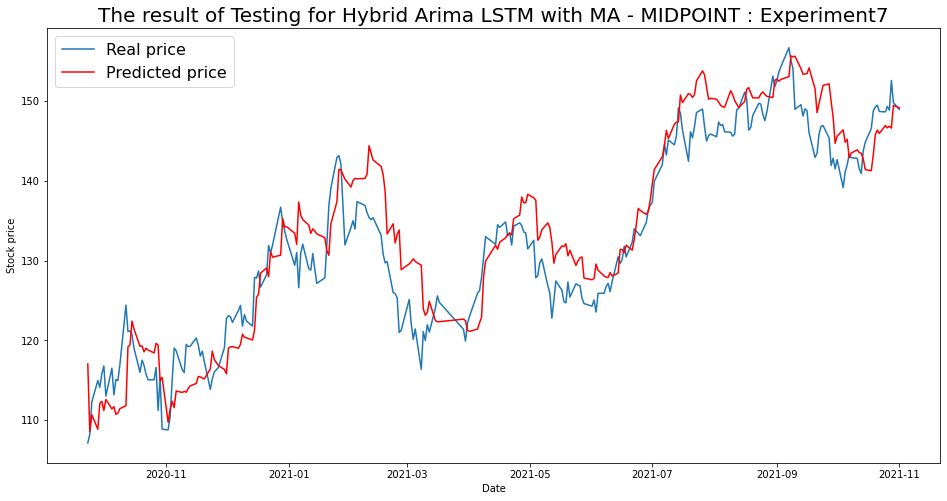

----- Test RMSE for MIDPOINT----- 4.504130817051618
----- Test_MSE_LSTM for MIDPOINT----- 20.287194417114076
----- Test_MAE_LSTM for MIDPOINT----- 3.6982533278355527


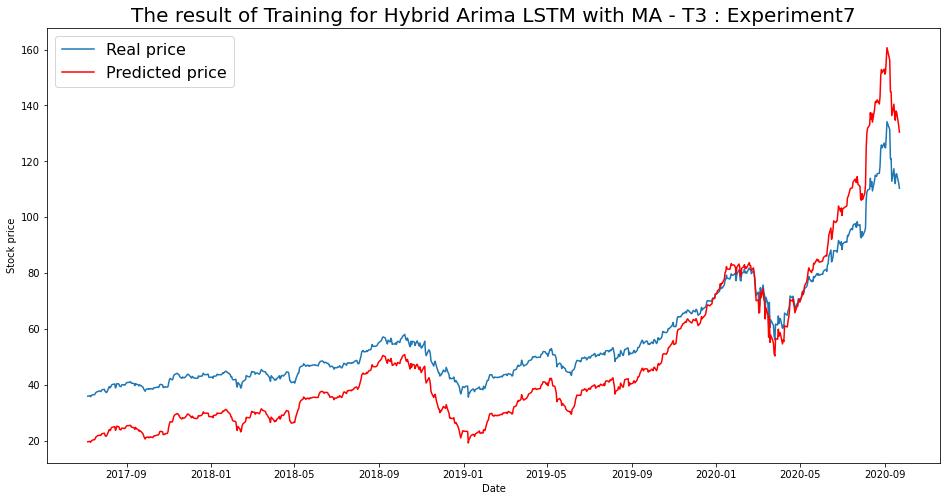

----- Train RMSE for T3 ----- 12.403273889547718
----- Train_MSE_LSTM for T3 ----- 153.84120317913616
----- Train MAE LSTM for T3 ----- 11.217496684263692


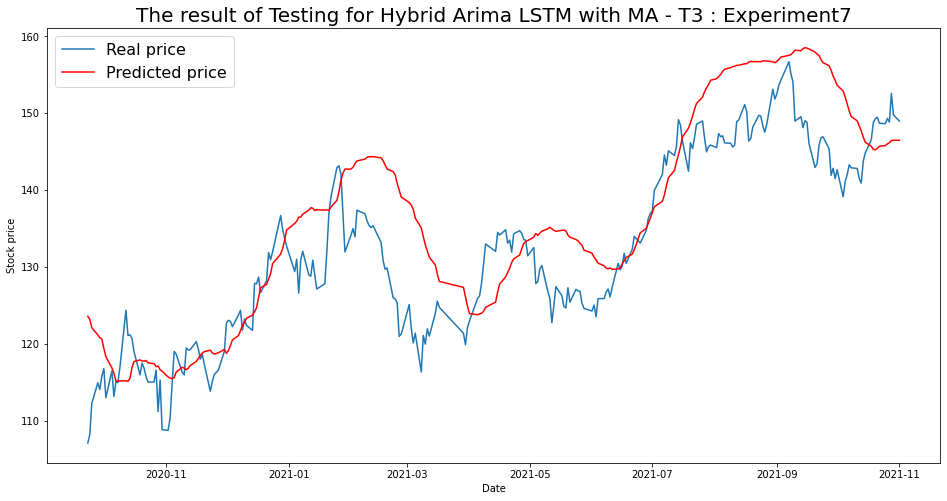

----- Test RMSE for T3----- 7.1055894968451945
----- Test_MSE_LSTM for T3----- 50.48940209767674
----- Test_MAE_LSTM for T3----- 5.703419596047134


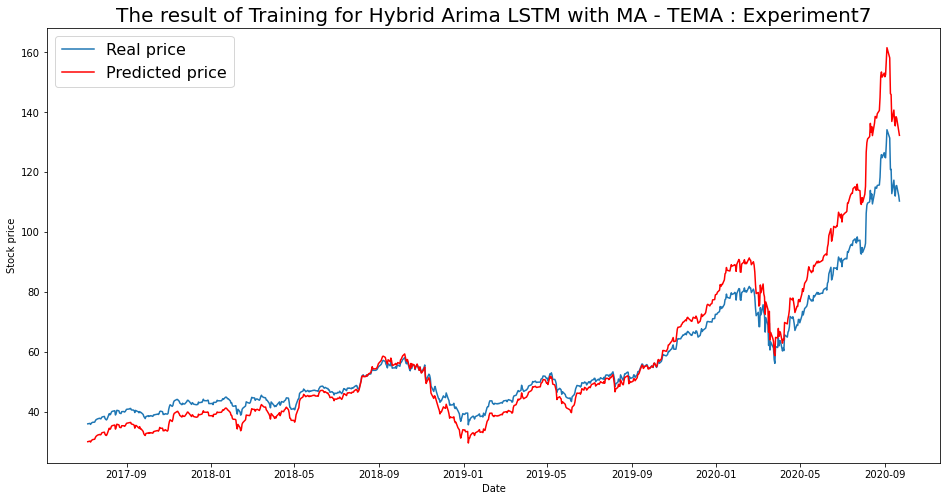

----- Train RMSE for TEMA ----- 7.403494010381279
----- Train_MSE_LSTM for TEMA ----- 54.81172356175147
----- Train MAE LSTM for TEMA ----- 5.156797193308905


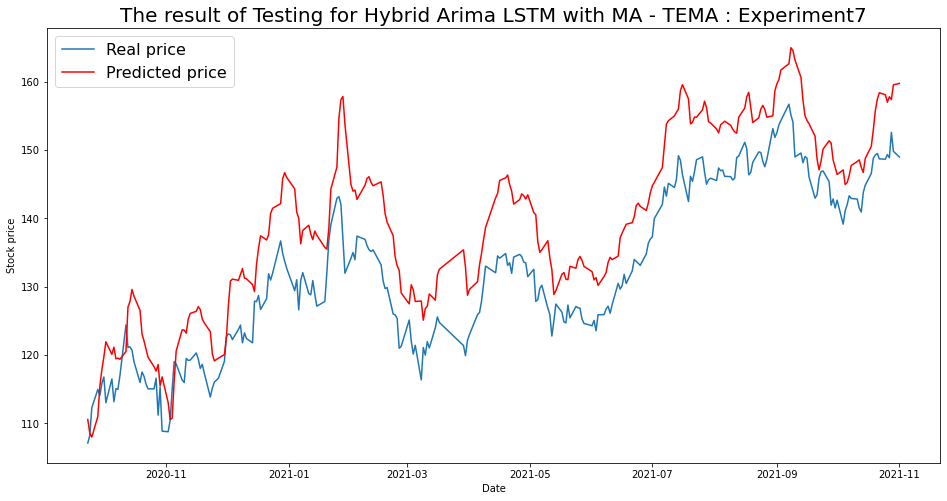

----- Test RMSE for TEMA----- 7.98509908324628
----- Test_MSE_LSTM for TEMA----- 63.76180736926059
----- Test_MAE_LSTM for TEMA----- 7.313429173529297


In [175]:
for i in range(len(list(simulation7.keys()))):
  SIM = list(simulation7.keys())[i]
  plot_train(simulation7,SIM)
  plot_test(simulation7,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 8

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # #Option 4
    # # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM8.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15057.252, Time=4.91 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13616.841, Time=2.91 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15177.809, Time=11.14 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14725.568, Time=12.35 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15511.840, Time=16.89 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-15663.563, Time=16.54 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=-15093.498, Time=7.85 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15194.504, Time=11.47 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=-14885.340, Time=20.83 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 104.921 seconds
                               SARIMA

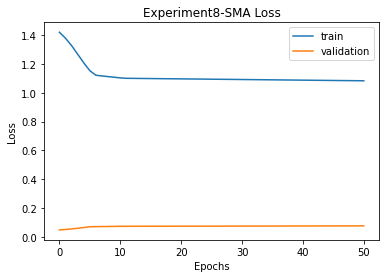


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.807, Time=3.79 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.07 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15585.734, Time=9.71 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14574.593, Time=7.87 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15458.426, Time=12.12 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15621.247, Time=13.61 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17231.605, Time=21.61 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14570.593, Time=10.33 sec
 ARIMA(1,3,3)(0,0

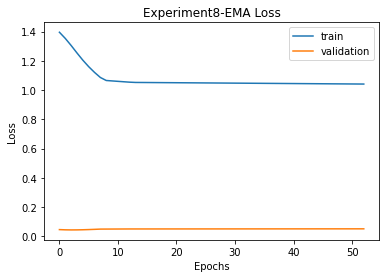


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 36.33111760049725 
RMSE:	 6.027529975080776 
MAPE:	 4.717669821139163
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15462.744, Time=14.88 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13144.103, Time=2.90 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16179.868, Time=7.19 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14670.350, Time=14.57 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-15643.233, Time=21.05 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15673.437, Time=18.26 

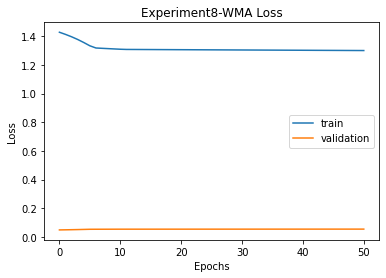


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 36.33111760049725 
RMSE:	 6.027529975080776 
MAPE:	 4.717669821139163

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 47.98959198497618 
RMSE:	 6.927452055768859 
MAPE:	 5.543762493289533
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.773, Time=3.52 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14576.593, Time=5.11 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16293.727, Time=8.63 sec
 ARIMA(0,3,1)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17005.977, Time=4.02 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17000.665, Time=4.81 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 104.791 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Mon, 13 Dec 2021   AIC                         -17089.440
Time:                        00:04:26   BIC                         -16972.169
Sample:                             0   HQIC                        -17044.403
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

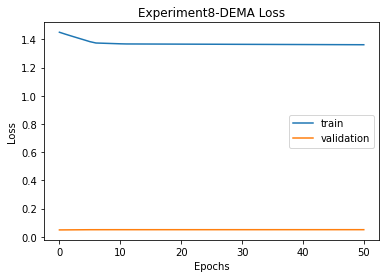


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 36.33111760049725 
RMSE:	 6.027529975080776 
MAPE:	 4.717669821139163

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 47.98959198497618 
RMSE:	 6.927452055768859 
MAPE:	 5.543762493289533

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 147.1351003665105 
RMSE:	 12.129925818673026 
MAPE:	 10.86165140779962
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17007.733, Time=3.51 sec
 ARIM

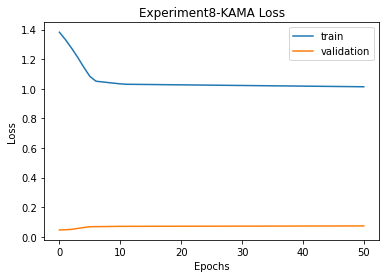


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 36.33111760049725 
RMSE:	 6.027529975080776 
MAPE:	 4.717669821139163

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 47.98959198497618 
RMSE:	 6.927452055768859 
MAPE:	 5.543762493289533

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 147.1351003665105 
RMSE:	 12.129925818673026 
MAPE:	 10.86165140779962

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 23.174387847088422 
RMSE:	 4.8139783804134835 
MAPE:	 3.8527324736855544
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working o

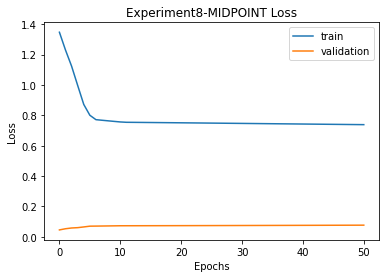


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 36.33111760049725 
RMSE:	 6.027529975080776 
MAPE:	 4.717669821139163

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 47.98959198497618 
RMSE:	 6.927452055768859 
MAPE:	 5.543762493289533

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 147.1351003665105 
RMSE:	 12.129925818673026 
MAPE:	 10.86165140779962

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 23.174387847088422 
RMSE:	 4.8139783804134835 
MAPE:	 3.8527324736855544

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 18.693186732823552 
RMSE:	 4.323561810917424 
MAPE:	 3.393872875098524
T3
T3([input_arrays],

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17006.024, Time=4.30 sec
 ARIMA(3,3,3)(0,0,0)[0]             : AIC=-14720.521, Time=14.16 sec
 ARIMA(2,3,3)(0,0,0)[0]             : AIC=-16599.516, Time=14.86 sec
 ARIMA(3,3,2)(0,0,0)[0] intercept   : AIC=-13110.324, Time=19.08 sec

Best model:  ARIMA(3,3,2)(0,0,0)[0]          
Total fit time: 124.685 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 2)   Log Likelihood                8700.998
Date:                Mon, 13 Dec 2021   AIC                         -17349.997
Time:                        00:36:37   BIC                         -17228.035
Sample:                             0   HQIC                        -17303.158
                                - 808                                         
Covariance Type:                  opg                                         
              

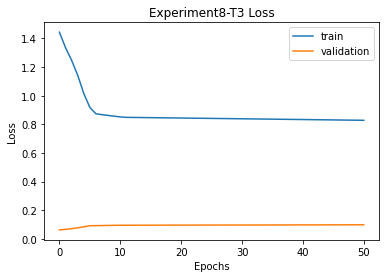


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 36.33111760049725 
RMSE:	 6.027529975080776 
MAPE:	 4.717669821139163

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 47.98959198497618 
RMSE:	 6.927452055768859 
MAPE:	 5.543762493289533

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 147.1351003665105 
RMSE:	 12.129925818673026 
MAPE:	 10.86165140779962

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 23.174387847088422 
RMSE:	 4.8139783804134835 
MAPE:	 3.8527324736855544

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 18.693186732823552 
RMSE:	 4.323561810917424 
MAPE:	 3.393872875098524

T3
Prediction vs Clo

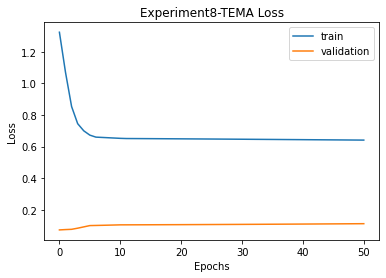


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.581571013749205 
RMSE:	 4.8560859767665985 
MAPE:	 3.8329222497365705

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 36.33111760049725 
RMSE:	 6.027529975080776 
MAPE:	 4.717669821139163

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 47.98959198497618 
RMSE:	 6.927452055768859 
MAPE:	 5.543762493289533

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 147.1351003665105 
RMSE:	 12.129925818673026 
MAPE:	 10.86165140779962

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	39.93% Accuracy
MSE:	 23.174387847088422 
RMSE:	 4.8139783804134835 
MAPE:	 3.8527324736855544

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 18.693186732823552 
RMSE:	 4.323561810917424 
MAPE:	 3.393872875098524

T3
Prediction vs Clo

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation8 = {}
    imgfile = 'Experiment8'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation8[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation8_data.json', 'w') as fp:
                    json.dump(simulation8, fp)

                for ma in simulation8.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation8[ma]['final']['mse'],
                          '\nRMSE:\t', simulation8[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation8[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/3600)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment8.png to Experiment8 (2).png


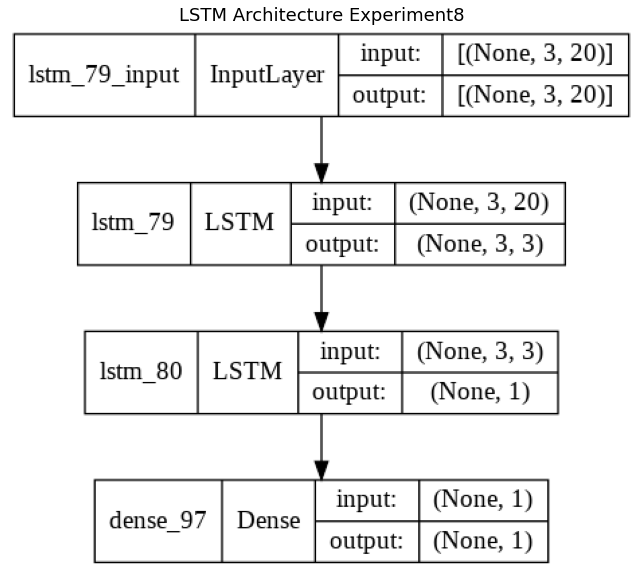

In [ ]:
img = cv2.imread('Experiment8.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [169]:
with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)
fileimg = 'Experiment8'

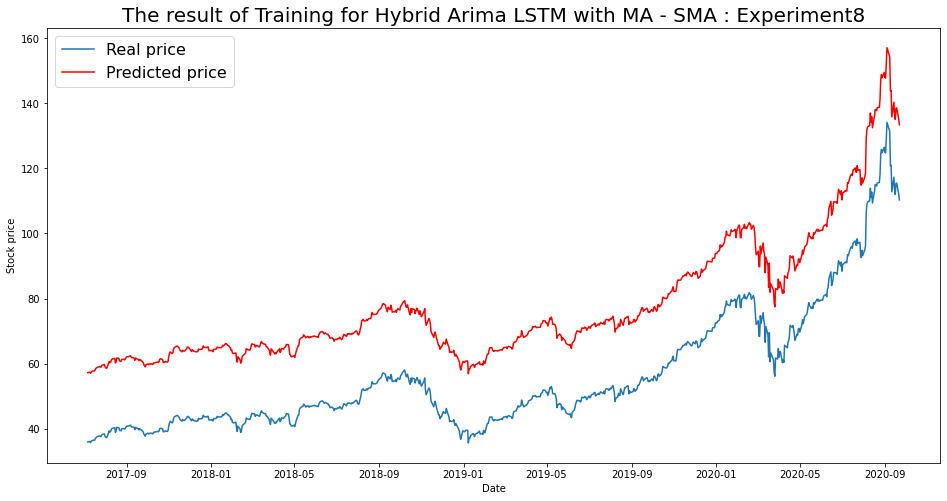

----- Train RMSE for SMA ----- 21.459837351832487
----- Train_MSE_LSTM for SMA ----- 460.5246191671048
----- Train MAE LSTM for SMA ----- 21.456445802556406


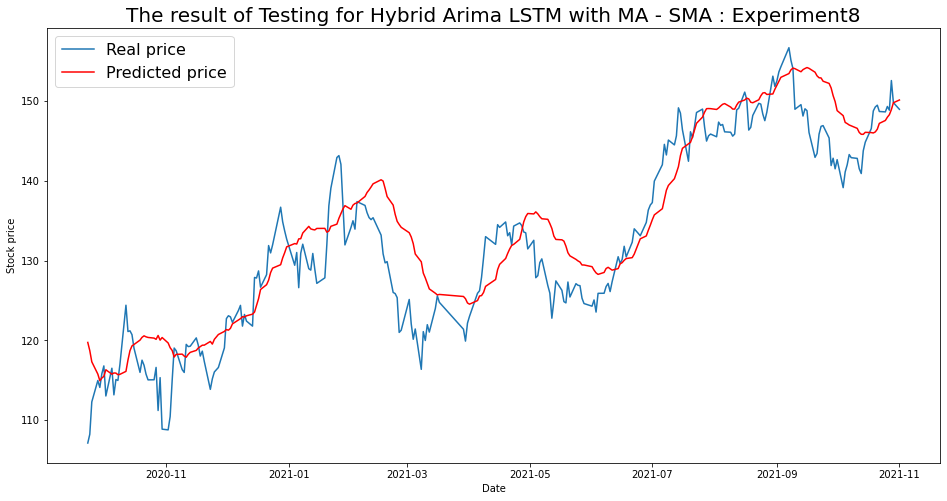

----- Test RMSE for SMA----- 4.8560859767665985
----- Test_MSE_LSTM for SMA----- 23.581571013749205
----- Test_MAE_LSTM for SMA----- 3.8329222497365705


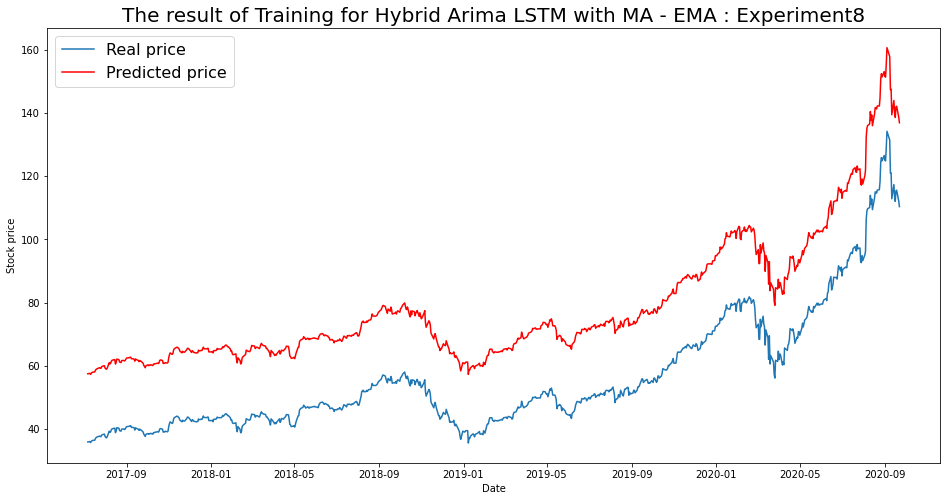

----- Train RMSE for EMA ----- 22.299931979787875
----- Train_MSE_LSTM for EMA ----- 497.2869663031659
----- Train MAE LSTM for EMA ----- 22.271449528118172


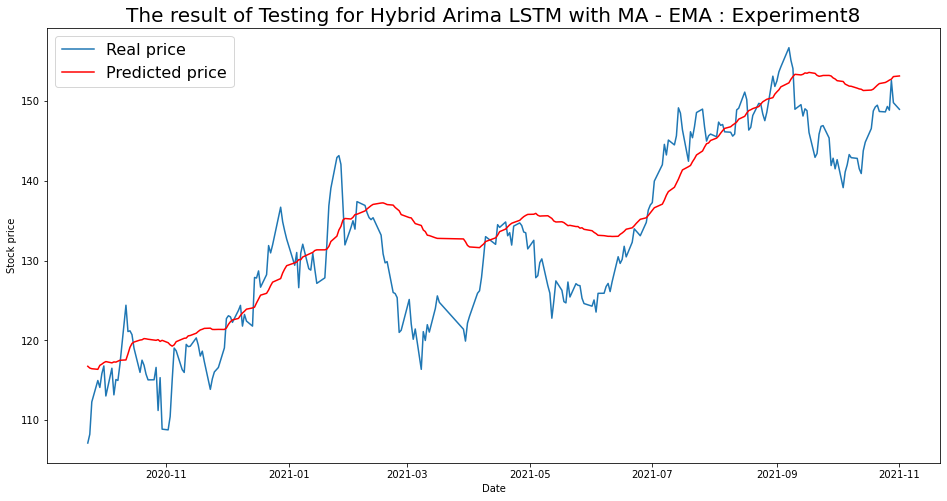

----- Test RMSE for EMA----- 6.027529975080776
----- Test_MSE_LSTM for EMA----- 36.33111760049725
----- Test_MAE_LSTM for EMA----- 4.717669821139163


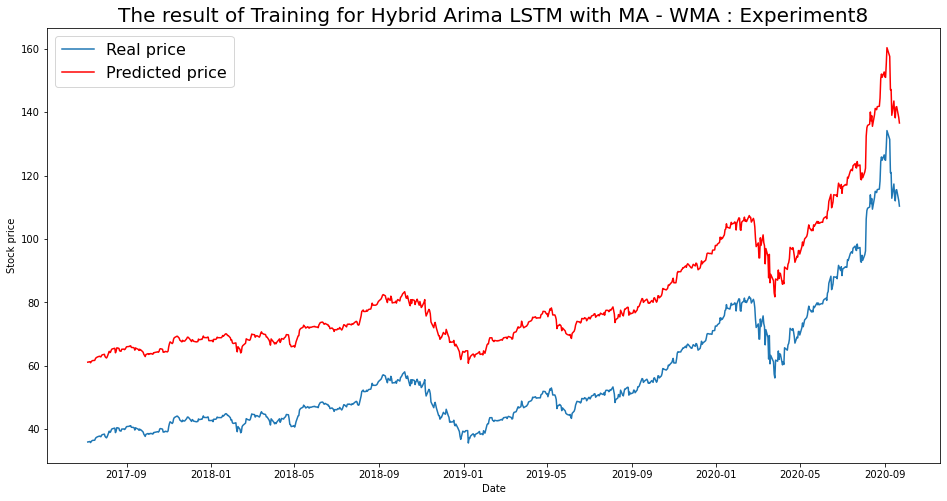

----- Train RMSE for WMA ----- 25.36567259630859
----- Train_MSE_LSTM for WMA ----- 643.4173462631205
----- Train MAE LSTM for WMA ----- 25.36438252666209


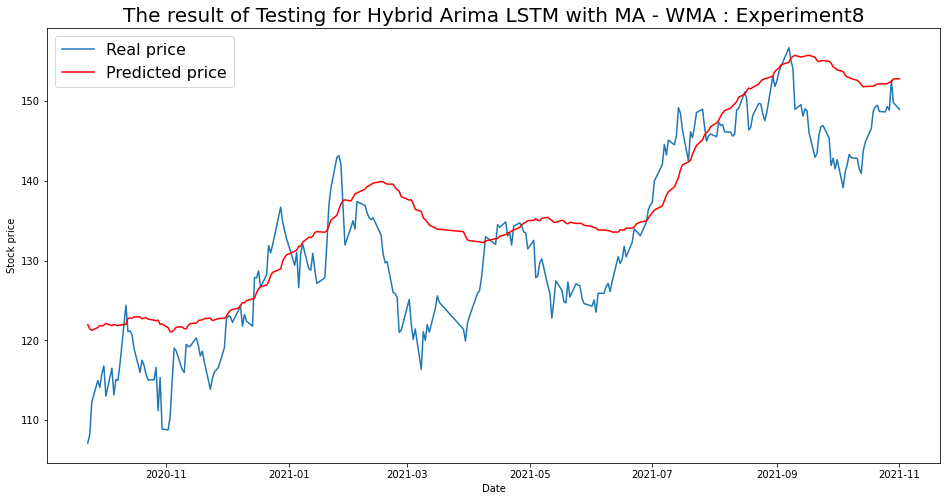

----- Test RMSE for WMA----- 6.927452055768859
----- Test_MSE_LSTM for WMA----- 47.98959198497618
----- Test_MAE_LSTM for WMA----- 5.543762493289533


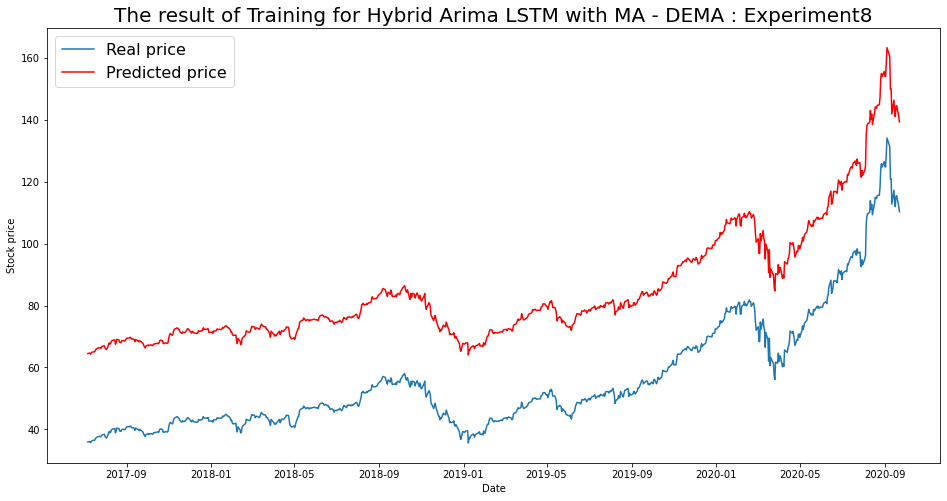

----- Train RMSE for DEMA ----- 28.627513883688447
----- Train_MSE_LSTM for DEMA ----- 819.5345511607749
----- Train MAE LSTM for DEMA ----- 28.627047009987407


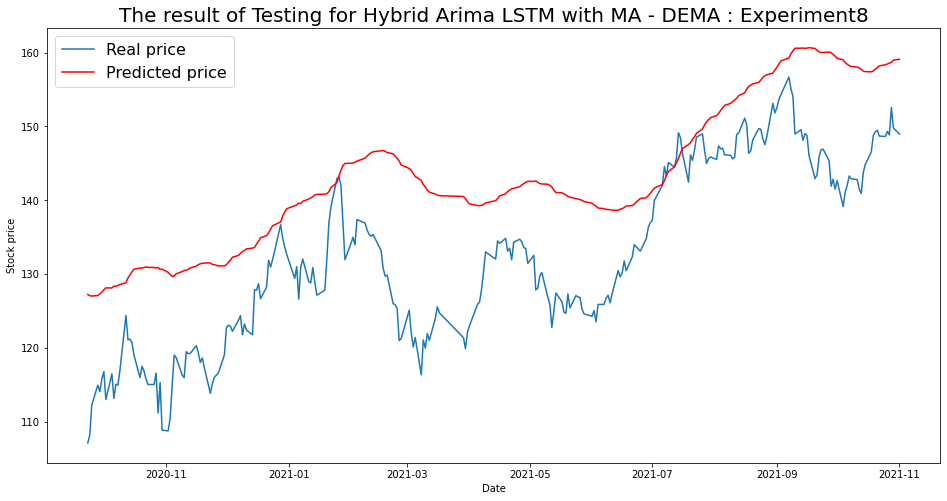

----- Test RMSE for DEMA----- 12.129925818673026
----- Test_MSE_LSTM for DEMA----- 147.1351003665105
----- Test_MAE_LSTM for DEMA----- 10.86165140779962


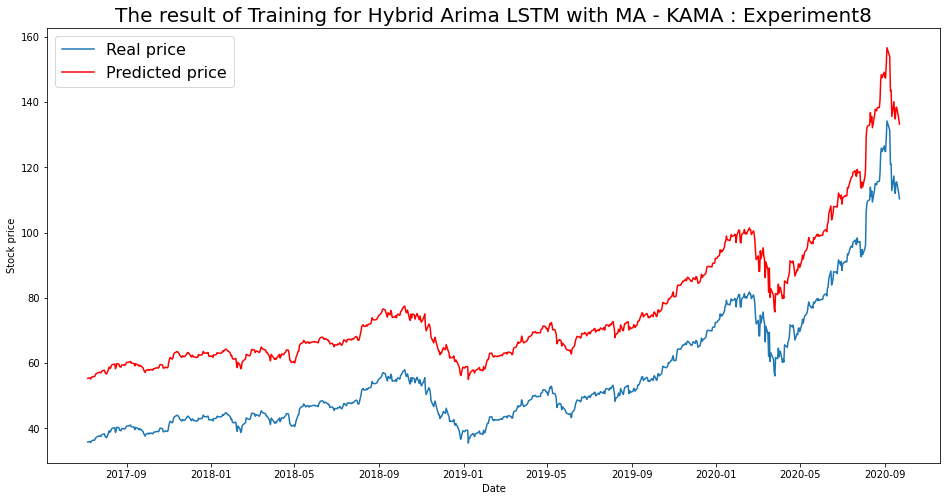

----- Train RMSE for KAMA ----- 19.726968740783253
----- Train_MSE_LSTM for KAMA ----- 389.15329569983953
----- Train MAE LSTM for KAMA ----- 19.714890199132483


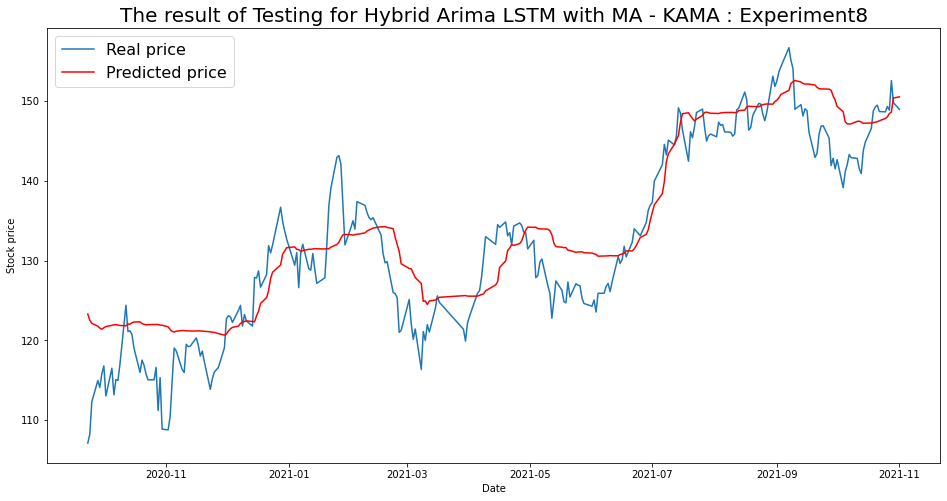

----- Test RMSE for KAMA----- 4.8139783804134835
----- Test_MSE_LSTM for KAMA----- 23.174387847088422
----- Test_MAE_LSTM for KAMA----- 3.8527324736855544


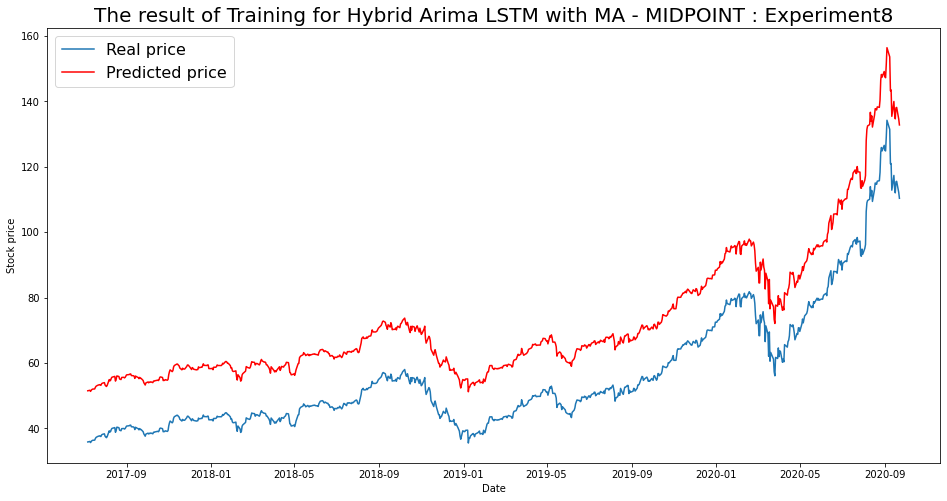

----- Train RMSE for MIDPOINT ----- 16.271251141384827
----- Train_MSE_LSTM for MIDPOINT ----- 264.75361370601706
----- Train MAE LSTM for MIDPOINT ----- 16.194465255973363


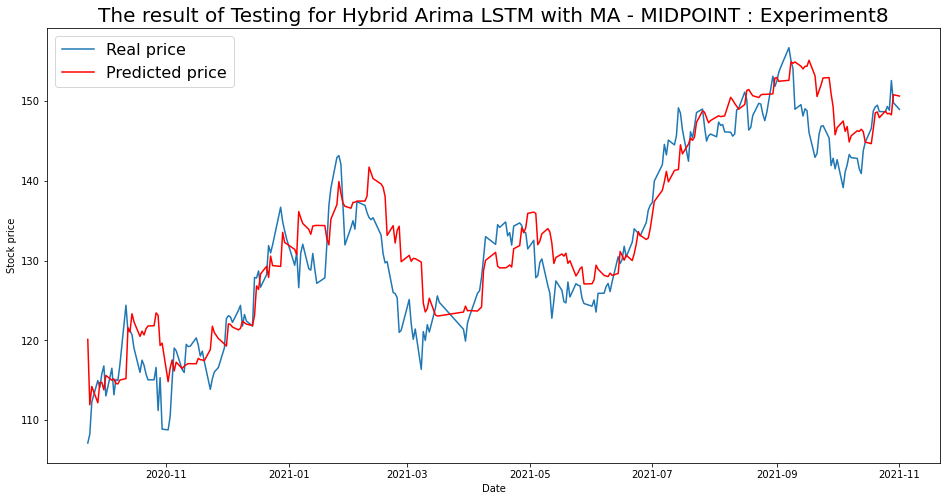

----- Test RMSE for MIDPOINT----- 4.323561810917424
----- Test_MSE_LSTM for MIDPOINT----- 18.693186732823552
----- Test_MAE_LSTM for MIDPOINT----- 3.393872875098524


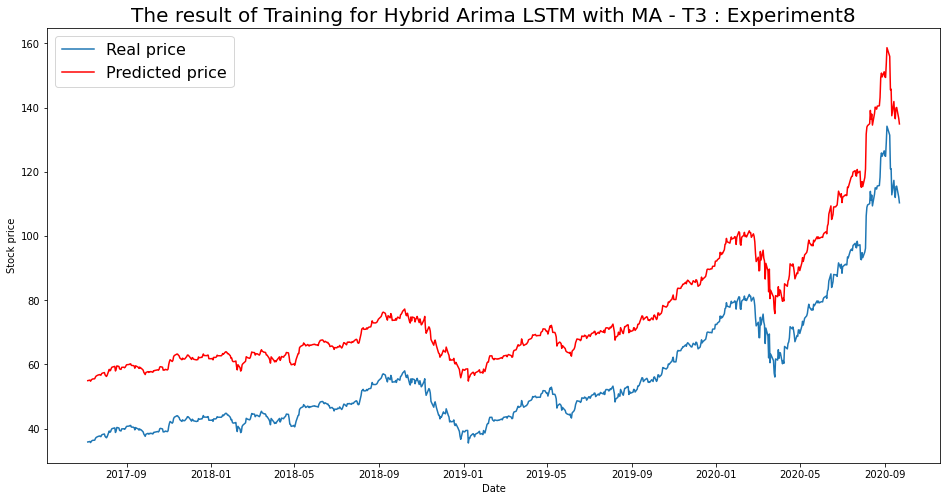

----- Train RMSE for T3 ----- 19.716088793140845
----- Train_MSE_LSTM for T3 ----- 388.72415729901405
----- Train MAE LSTM for T3 ----- 19.675862314677474


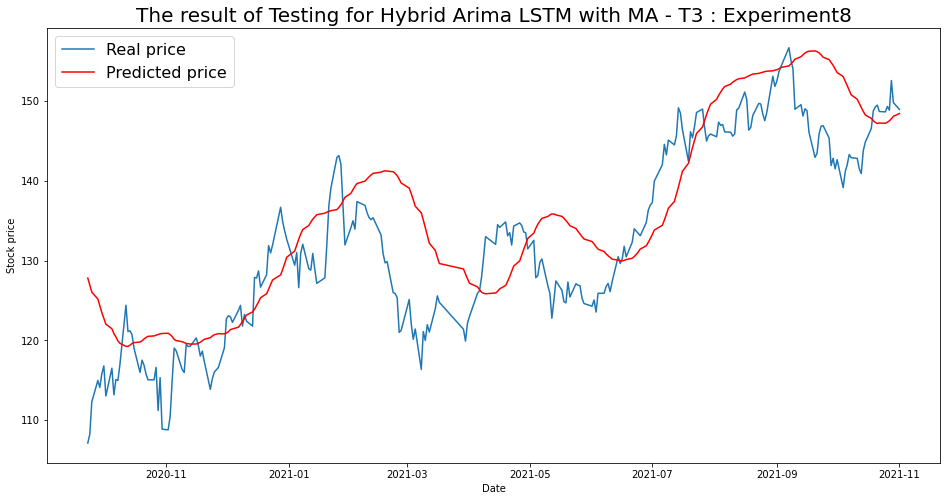

----- Test RMSE for T3----- 7.026803551744203
----- Test_MSE_LSTM for T3----- 49.37596815480495
----- Test_MAE_LSTM for T3----- 5.656408399322556


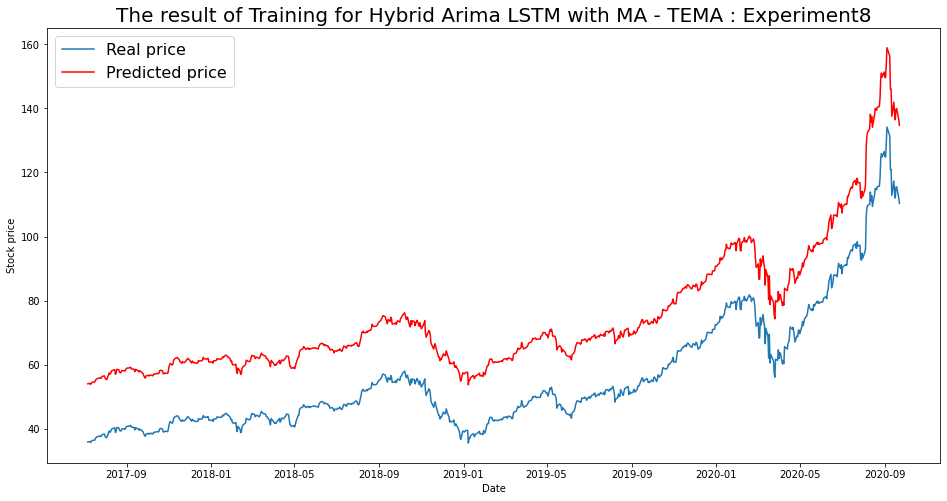

----- Train RMSE for TEMA ----- 18.552481299317044
----- Train_MSE_LSTM for TEMA ----- 344.19456236150864
----- Train MAE LSTM for TEMA ----- 18.50773582364073


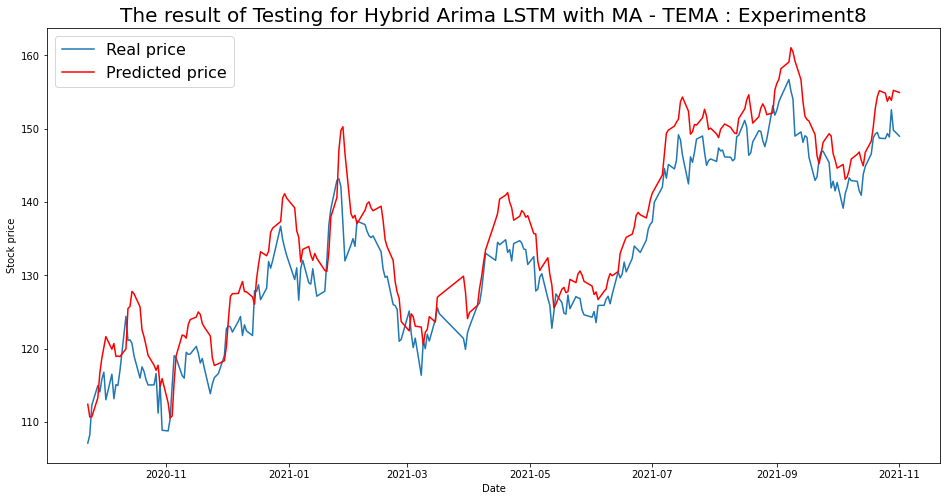

----- Test RMSE for TEMA----- 4.540808274653241
----- Test_MSE_LSTM for TEMA----- 20.618939787159338
----- Test_MAE_LSTM for TEMA----- 3.9138992194140063


In [170]:
for i in range(len(list(simulation8.keys()))):
  SIM = list(simulation8.keys())[i]
  plot_train(simulation8,SIM)
  plot_test(simulation8,SIM)

## List of RMSE, MSE & MAE scores for Test data

In [171]:
import json
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)

with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)

with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)

with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)

with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)

with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)

with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)

with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)

In [172]:
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    print('Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[SIM]['final']['mse'])
    print('Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[SIM]['final']['rmse'])
    print('Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[SIM]['final']['mae'])

Experiment  1  for MA : SMA the MSE  is:  33.21332596254529
Experiment  1  for MA : SMA the RMSE is:  5.763100377621866
Experiment  1  for MA : SMA the MAE is:  4.8410208542529105
Experiment  1  for MA : EMA the MSE  is:  33.21332596254529
Experiment  1  for MA : EMA the RMSE is:  5.763100377621866
Experiment  1  for MA : EMA the MAE is:  4.8410208542529105
Experiment  1  for MA : WMA the MSE  is:  33.21332596254529
Experiment  1  for MA : WMA the RMSE is:  5.763100377621866
Experiment  1  for MA : WMA the MAE is:  4.8410208542529105
Experiment  1  for MA : DEMA the MSE  is:  33.21332596254529
Experiment  1  for MA : DEMA the RMSE is:  5.763100377621866
Experiment  1  for MA : DEMA the MAE is:  4.8410208542529105
Experiment  1  for MA : KAMA the MSE  is:  33.21332596254529
Experiment  1  for MA : KAMA the RMSE is:  5.763100377621866
Experiment  1  for MA : KAMA the MAE is:  4.8410208542529105
Experiment  1  for MA : MIDPOINT the MSE  is:  33.21332596254529
Experiment  1  for MA : MIDPO

In [173]:
text = 'Stock with Baseline '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Baseline Experiment  1  for MA : SMA the RMSE is:  6.068911917484476
Stock with Baseline Experiment  1  for MA : EMA the RMSE is:  8.465370483543822
Stock with Baseline Experiment  1  for MA : WMA the RMSE is:  7.359939097954609
Stock with Baseline Experiment  1  for MA : DEMA the RMSE is:  11.047191433294731
Stock with Baseline Experiment  1  for MA : KAMA the RMSE is:  6.759014190816157
Stock with Baseline Experiment  1  for MA : MIDPOINT the RMSE is:  6.965410649911217
Stock with Baseline Experiment  1  for MA : T3 the RMSE is:  14.019217214863545
Stock with Baseline Experiment  1  for MA : TEMA the RMSE is:  5.763100377621866
Stock with Baseline Experiment  1  for MA : SMA the MSE  is:  36.8316918621851
Stock with Baseline Experiment  1  for MA : EMA the MSE  is:  71.66249742365495
Stock with Baseline Experiment  1  for MA : WMA the MSE  is:  54.1687035256009
Stock with Baseline Experiment  1  for MA : DEMA the MSE  is:  122.04043856386052
Stock with Baseline Experiment 

## Create HTML

In [177]:
cd ..

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid


In [178]:
%%shell
jupyter nbconvert --to html LSTM_Hybrid_using_TA_LIB_Baseline.ipynb

[NbConvertApp] Converting notebook LSTM_Hybrid_using_TA_LIB_Baseline.ipynb to html
[NbConvertApp] Writing 14553665 bytes to LSTM_Hybrid_using_TA_LIB_Baseline.html
